In [1]:
import os
import json
import numpy as np
import SimpleITK as sitk
import torch

import random

import matplotlib.pyplot as plt
plt.rcParams.update({'font.size': 22})

from skimage.util import montage as montage2d

/home/ar32500@ens.ad.etsmtl.ca/SelfSupervisedAL/venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
os.chdir('<PATH-TO-SRC-FOLDER-OF-REPO>')

In [3]:
from Utils.load_utils import create_unexisting_folder, save_hdf5

In [4]:
data_folder = '<PATH-TO-DATA-FOLDER>'

## Helper Functions

In [5]:
from Utils.utils import natural_keys

In [6]:
def set_all_seed(seed=42):
    """
    We are setting all seeds
    :param seed: (default: 42)
    :return:
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

In [7]:
set_all_seed(seed=42)

## We get raw data

In [8]:
# We can get raw data from command line:
# (in data_folder)
# $ wget https://msd-for-monai.s3-us-west-2.amazonaws.com/Task04_Hippocampus.tar
# $ tar -xf Task04_Hippocampus.tar

In [9]:
dataset_name = "Task04_Hippocampus"
dataset_folder_path = os.path.join(data_folder, dataset_name, 'raw')

json_path = os.path.join(dataset_folder_path, 'dataset.json')

with open(json_path, 'r') as f:
  data_dic = json.load(f)

In [10]:
# We get the list of patient data
patient_list = data_dic['training']

# We order the list of patient data
#patient_list.sort(key=natural_keys)

patient_list 

[{'image': './imagesTr/hippocampus_367.nii.gz',
  'label': './labelsTr/hippocampus_367.nii.gz'},
 {'image': './imagesTr/hippocampus_304.nii.gz',
  'label': './labelsTr/hippocampus_304.nii.gz'},
 {'image': './imagesTr/hippocampus_204.nii.gz',
  'label': './labelsTr/hippocampus_204.nii.gz'},
 {'image': './imagesTr/hippocampus_279.nii.gz',
  'label': './labelsTr/hippocampus_279.nii.gz'},
 {'image': './imagesTr/hippocampus_308.nii.gz',
  'label': './labelsTr/hippocampus_308.nii.gz'},
 {'image': './imagesTr/hippocampus_375.nii.gz',
  'label': './labelsTr/hippocampus_375.nii.gz'},
 {'image': './imagesTr/hippocampus_216.nii.gz',
  'label': './labelsTr/hippocampus_216.nii.gz'},
 {'image': './imagesTr/hippocampus_316.nii.gz',
  'label': './labelsTr/hippocampus_316.nii.gz'},
 {'image': './imagesTr/hippocampus_089.nii.gz',
  'label': './labelsTr/hippocampus_089.nii.gz'},
 {'image': './imagesTr/hippocampus_189.nii.gz',
  'label': './labelsTr/hippocampus_189.nii.gz'},
 {'image': './imagesTr/hippoca

In [11]:
patient_name_list = []

for i in range(len(patient_list)):
    patient_name_list.append(patient_list[i]['image'].split('/')[-1].split('.')[0])

patient_name_list.sort(key=natural_keys)
patient_name_list

['hippocampus_001',
 'hippocampus_003',
 'hippocampus_004',
 'hippocampus_006',
 'hippocampus_007',
 'hippocampus_008',
 'hippocampus_011',
 'hippocampus_014',
 'hippocampus_015',
 'hippocampus_017',
 'hippocampus_019',
 'hippocampus_020',
 'hippocampus_023',
 'hippocampus_024',
 'hippocampus_025',
 'hippocampus_026',
 'hippocampus_033',
 'hippocampus_034',
 'hippocampus_035',
 'hippocampus_036',
 'hippocampus_037',
 'hippocampus_038',
 'hippocampus_039',
 'hippocampus_040',
 'hippocampus_041',
 'hippocampus_042',
 'hippocampus_044',
 'hippocampus_045',
 'hippocampus_046',
 'hippocampus_048',
 'hippocampus_049',
 'hippocampus_050',
 'hippocampus_051',
 'hippocampus_052',
 'hippocampus_053',
 'hippocampus_056',
 'hippocampus_057',
 'hippocampus_058',
 'hippocampus_060',
 'hippocampus_064',
 'hippocampus_065',
 'hippocampus_067',
 'hippocampus_068',
 'hippocampus_070',
 'hippocampus_074',
 'hippocampus_075',
 'hippocampus_077',
 'hippocampus_083',
 'hippocampus_084',
 'hippocampus_087',


In [12]:
len(patient_name_list)

260

# We check data attributes (shape, spacing, etc.)

In [13]:
class Dataset(object):
    def __init__(self, dataset_folder_path):
        # type: (object, object) -> object
        self.dataset_folder_path = dataset_folder_path
        
        json_path = os.path.join(dataset_folder_path, 'dataset.json')

        with open(json_path, 'r') as f:
            data_dic = json.load(f)
            
        self.patient_name_list = []
        for i in range(len(patient_list)):
            self.patient_name_list.append(patient_list[i]['image'].split('/')[-1].split('.')[0])
        self.patient_name_list.sort(key=natural_keys)
  
        # We create a dictionary with patient data and value from Info.cfg file
        self.patient_data = {}

    def get_patient_data(self, index):
        """
        Reads patient data in the cfg file and returns a dictionary and
        extract End diastole and End Systole image from patient folder
        using Info.cfg
        """
        patient_name = self.patient_name_list[index]
        
        img_name = '{}.nii.gz'.format(patient_name)
        img_filepath = os.path.join(self.dataset_folder_path, 'imagesTr', img_name)
        img = sitk.ReadImage(img_filepath)
        
        seg_name = '{}.nii.gz'.format(patient_name)
        seg_filepath = os.path.join(self.dataset_folder_path, 'labelsTr', seg_name)
        seg = sitk.ReadImage(seg_filepath)
      
        return img, seg

In [14]:
d = Dataset(dataset_folder_path)

In [15]:
# We cheeck the different image spacing and size in x, y and z directions
spacing_x = [np.inf, 0]
spacing_y = [np.inf, 0]
spacing_z = [np.inf, 0]
shape_x = [np.inf, 0]
shape_y = [np.inf, 0]
shape_z = [np.inf, 0]

for index in range(len(d.patient_name_list)):
    img, seg = d.get_patient_data(index, img_type='ED')
    
    cur_shape = np.asarray(img.GetSize())
    cur_origin = img.GetOrigin()
    cur_spacing = img.GetSpacing()
    cur_direction = img.GetDirection()
    print('INDEX {}: direction {}, origin {}, size {}, spacing {}'.format(index, cur_direction, cur_origin, cur_shape, cur_spacing))
    
    # We record the min spacing
    spacing_x[0] =  cur_spacing[0] if cur_spacing[0] < spacing_x[0] else spacing_x[0]
    spacing_y[0] =  cur_spacing[1] if cur_spacing[1] < spacing_y[0] else spacing_y[0]
    spacing_z[0] =  cur_spacing[2] if cur_spacing[2] < spacing_z[0] else spacing_z[0]

    # We record the max spacing
    spacing_x[1] =  cur_spacing[0] if cur_spacing[0] > spacing_x[1] else spacing_x[1]
    spacing_y[1] =  cur_spacing[1] if cur_spacing[1] > spacing_y[1] else spacing_y[1]
    spacing_z[1] =  cur_spacing[2] if cur_spacing[2] > spacing_z[1] else spacing_z[1]

    # We record the min shape
    shape_x[0] =  cur_shape[0] if cur_shape[0] < shape_x[0] else shape_x[0]
    shape_y[0] =  cur_shape[1] if cur_shape[1] < shape_y[0] else shape_y[0]
    shape_z[0] =  cur_shape[2] if cur_shape[2] < shape_z[0] else shape_z[0]

    # We record the max shape
    shape_x[1] =  cur_shape[0] if cur_shape[0] > shape_x[1] else shape_x[1]
    shape_y[1] =  cur_shape[1] if cur_shape[1] > shape_y[1] else shape_y[1]
    shape_z[1] =  cur_shape[2] if cur_shape[2] > shape_z[1] else shape_z[1]

print('\nspacing: x {}, y {}, z {}'.format(spacing_x, spacing_y, spacing_z))
print('shape: x {}, y {}, z {}'.format(shape_x, shape_y, shape_z))

INDEX 0: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 51 35], spacing (1.0, 1.0, 1.0)
INDEX 1: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 52 35], spacing (1.0, 1.0, 1.0)
INDEX 2: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 52 38], spacing (1.0, 1.0, 1.0)
INDEX 3: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 52 34], spacing (1.0, 1.0, 1.0)
INDEX 4: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 47 40], spacing (1.0, 1.0, 1.0)
INDEX 5: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 48 40], spacing (1.0, 1.0, 1.0)
INDEX 6: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 50 31], spacing (1.0, 1.0, 1.0)
INDEX 7: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0

INDEX 66: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 46 38], spacing (1.0, 1.0, 1.0)
INDEX 67: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 55 34], spacing (1.0, 1.0, 1.0)
INDEX 68: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 53 37], spacing (1.0, 1.0, 1.0)
INDEX 69: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 49 36], spacing (1.0, 1.0, 1.0)
INDEX 70: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [38 50 39], spacing (1.0, 1.0, 1.0)
INDEX 71: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [32 53 38], spacing (1.0, 1.0, 1.0)
INDEX 72: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 55 41], spacing (1.0, 1.0, 1.0)
INDEX 73: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 

INDEX 132: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 49 33], spacing (1.0, 1.0, 1.0)
INDEX 133: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [32 49 36], spacing (1.0, 1.0, 1.0)
INDEX 134: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [38 53 27], spacing (1.0, 1.0, 1.0)
INDEX 135: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [37 45 39], spacing (1.0, 1.0, 1.0)
INDEX 136: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [39 45 40], spacing (1.0, 1.0, 1.0)
INDEX 137: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [32 48 34], spacing (1.0, 1.0, 1.0)
INDEX 138: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 49 36], spacing (1.0, 1.0, 1.0)
INDEX 139: direction (-1.0, 0.0, 0.0, 0.0

INDEX 192: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (0.0, 0.0, 0.0), size [31 50 36], spacing (1.0, 1.0, 1.0)
INDEX 193: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (0.0, 0.0, 0.0), size [35 46 39], spacing (1.0, 1.0, 1.0)
INDEX 194: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 48 38], spacing (1.0, 1.0, 1.0)
INDEX 195: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 48 38], spacing (1.0, 1.0, 1.0)
INDEX 196: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (0.0, 0.0, 0.0), size [34 49 30], spacing (1.0, 1.0, 1.0)
INDEX 197: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [38 48 40], spacing (1.0, 1.0, 1.0)
INDEX 198: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 52 38], spacing (1.0, 1.0, 1.0)
INDEX 199: direction (-1.0, 0.0, 0.0, 0.0, -1.0

INDEX 252: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [33 55 29], spacing (1.0, 1.0, 1.0)
INDEX 253: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [35 48 40], spacing (1.0, 1.0, 1.0)
INDEX 254: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [37 45 40], spacing (1.0, 1.0, 1.0)
INDEX 255: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [33 51 32], spacing (1.0, 1.0, 1.0)
INDEX 256: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [34 49 32], spacing (1.0, 1.0, 1.0)
INDEX 257: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [38 51 33], spacing (1.0, 1.0, 1.0)
INDEX 258: direction (-1.0, 0.0, 0.0, 0.0, -1.0, 0.0, 0.0, 0.0, 1.0), origin (-1.0, -1.0, 1.0), size [36 51 31], spacing (1.0, 1.0, 1.0)
INDEX 259: direction (-1.0, 0.0, 0.0, 0.0

# Visualizing the data

###  Visualize with Overlay

In [13]:
def sitk_show(img, title=None, margin=0.05, dpi=40 ):
    nda = sitk.GetArrayFromImage(img)
    spacing = img.GetSpacing()
    #figsize = (1 + margin) * nda.shape[0] / dpi, (1 + margin) * nda.shape[1] / dpi
    figsize = (10, 10)
    extent = (0, nda.shape[1]*spacing[1], nda.shape[0]*spacing[0], 0)
    fig = plt.figure(figsize=figsize, dpi=dpi)
    ax = fig.add_axes([margin, margin, 1 - 2*margin, 1 - 2*margin])

    plt.set_cmap("gray")
    ax.imshow(nda,extent=extent,interpolation=None)
    
    if title:
        plt.title(title)
    plt.axis('off')
    
    plt.show()

In [14]:
len(patient_name_list)

260

In [18]:
index = 15

In [19]:
img_file_path = os.path.join(dataset_folder_path, 'imagesTr', patient_name_list[index] + '.nii.gz')
img = sitk.ReadImage(img_file_path)
_img_arr = sitk.GetArrayFromImage(img)
img_arr = _img_arr.transpose()
print(img_arr.shape)

seg_file_path = os.path.join(dataset_folder_path, 'labelsTr', patient_name_list[index] + '.nii.gz')
seg = sitk.ReadImage(seg_file_path)
_seg_arr = sitk.GetArrayFromImage(seg)
seg_arr = _seg_arr.transpose()
print(seg_arr.shape)

(36, 50, 36)
(36, 50, 36)


[0 1 2]


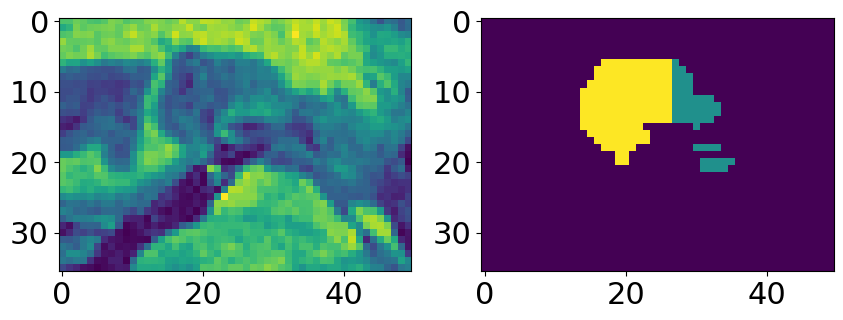

In [21]:
# We plot the center image (z-direction) and mask of the given volume
fig = plt.figure(figsize=(10, 5))
ax = fig.add_subplot(121)  # left s
ax.imshow(img_arr[:, :, z_slice])

ax = fig.add_subplot(122)  # left s
ax.imshow(seg_arr[:, :, z_slice])
print(np.unique(seg_arr))

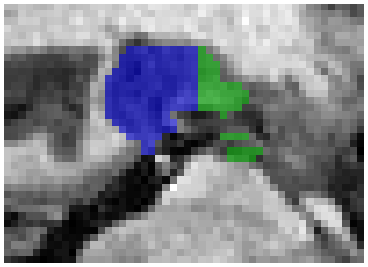

In [22]:
# We plot the corresponding overlay
# We rescale image and cast it to an integer type to match that of mask
red_img = sitk.GetImageFromArray(img_arr[:,:, z_slice])
red_seg = sitk.GetImageFromArray(seg_arr[:,:, z_slice])
img_rescaled = sitk.Cast(sitk.RescaleIntensity(red_img), red_seg.GetPixelID())

# Use 'LabelOverlay' to overlay image and mask
sitk_show(sitk.LabelOverlay(img_rescaled, red_seg))

### Visualize with montage

In [23]:
index = 22

In [24]:
# We get the data
img_file_path = os.path.join(dataset_folder_path, 'imagesTr', patient_name_list[index] + '.nii.gz')
img = sitk.ReadImage(img_file_path)
img_arr = sitk.GetArrayFromImage(img)

seg_file_path = os.path.join(dataset_folder_path, 'labelsTr', patient_name_list[index] + '.nii.gz')
seg = sitk.ReadImage(seg_file_path)
seg_arr = sitk.GetArrayFromImage(seg)

(-0.5, 203.5, 317.5, -0.5)

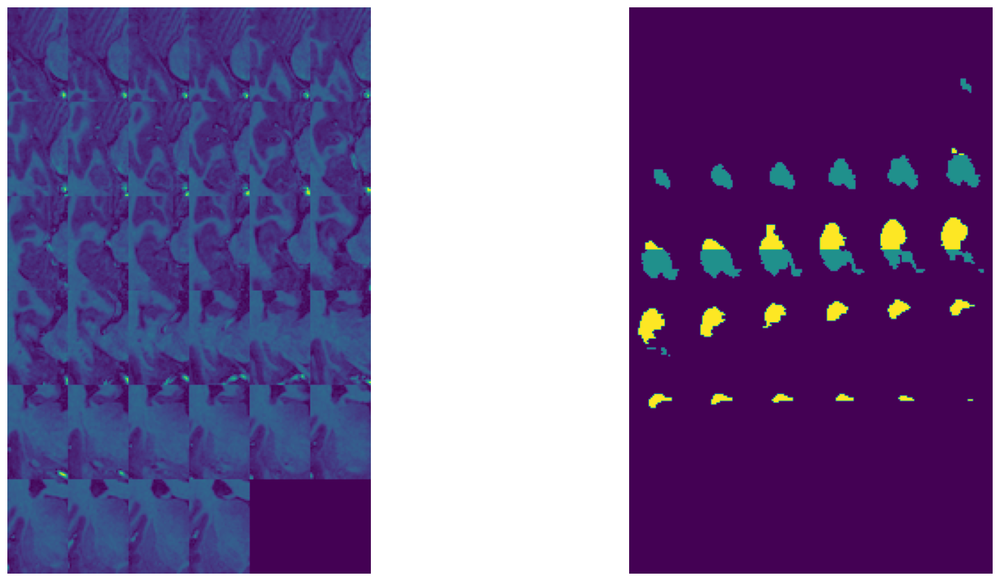

In [25]:
# We plot the montage
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(montage2d(img_arr, fill=0), cmap='viridis')
plt.axis('off')

ax = fig.add_subplot(1, 2, 2)
ax.imshow(montage2d(seg_arr, fill=0), cmap='viridis')
plt.axis('off')

# Preprocessing using SimpleITK

## Load preprocessing functions

In [13]:
def plot_preprocessing(img, seg, preprocessed_img_arr, preprocessed_seg_arr, index, slice_frac=2, inter_img=None,
                      vmin=None, vmax=None):
    """
    We will plot image and mask both raw and preprocessed
    """

    fig = plt.figure(figsize=(20, 12))

    nrow = 1
    ncols = 4 if inter_img is None else 5
    i = 1

    # Raw image
    cur_img = sitk.GetArrayFromImage(img)
    ax = fig.add_subplot(nrow, ncols, i)
    ax.title.set_text('IMG {}'.format(index))
    ax.imshow(cur_img[cur_img.shape[0]//slice_frac, :, :], cmap='viridis')
    i += 1

    cur_img = sitk.GetArrayFromImage(seg)
    ax = fig.add_subplot(nrow, ncols, i)
    ax.imshow(cur_img[cur_img.shape[0]//slice_frac, :, :], cmap='viridis')
    i += 1
    
    # Intermediate image
    if inter_img is not None:
        cur_img = inter_img.copy()
        ax = fig.add_subplot(nrow, ncols, i)
        ax.imshow(cur_img[:, :, cur_img.shape[2]//slice_frac], cmap='viridis', vmin=vmin, vmax=vmax)
        i += 1        
    

    # Preprocessed image
    cur_img = preprocessed_img_arr.copy()
    ax = fig.add_subplot(nrow, ncols, i)
    ax.title.set_text('')
    ax.imshow(cur_img[:, :, cur_img.shape[2]//slice_frac], cmap='viridis', vmin=vmin, vmax=vmax)
    i += 1

    cur_img = preprocessed_seg_arr.copy()
    ax = fig.add_subplot(nrow, ncols, i)
    ax.imshow(cur_img[:, :, cur_img.shape[2]//slice_frac], cmap='viridis')
    i += 1
    
    plt.show()

In [14]:
def percentile_normalization(image, percent=99):
    """
    We normalize by diving by 99th percentile
    """
    new_image = image / np.percentile(image.flatten(), percent)
    return new_image

In [33]:
class DatasetPreprocessor(object):
    def __init__(self, dataset_folder_path):
        # type: (object, object) -> object
        self.dataset_folder_path = dataset_folder_path
        
        json_path = os.path.join(dataset_folder_path, 'dataset.json')

        with open(json_path, 'r') as f:
            data_dic = json.load(f)
            
        self.patient_name_list = []
        for i in range(len(patient_list)):
            self.patient_name_list.append(patient_list[i]['image'].split('/')[-1].split('.')[0])
        self.patient_name_list.sort(key=natural_keys)
  
        # We create a dictionary with patient data and value from Info.cfg file
        self.patient_data = {}

    def get_patient_data(self, index):
        """
        Reads patient data in the cfg file and returns a dictionary and
        extract End diastole and End Systole image from patient folder
        using Info.cfg
        """
        patient_name = self.patient_name_list[index]
        
        img_name = '{}.nii.gz'.format(patient_name)
        img_filepath = os.path.join(self.dataset_folder_path, 'imagesTr', img_name)
        img = sitk.ReadImage(img_filepath)
        
        seg_name = '{}.nii.gz'.format(patient_name)
        seg_filepath = os.path.join(self.dataset_folder_path, 'labelsTr', seg_name)
        seg = sitk.ReadImage(seg_filepath)
      
        return img, seg, patient_name
    
    def _create_ref_img(self, img, dimension, pixelID, new_img_width, new_spacing):
        """
        We create a reference image to apply deformations on the input image
        """
        # Create the reference image with a zero origin, identity direction cosine matrix and dimension     
        reference_origin = np.zeros(dimension)
        reference_direction = np.identity(dimension).flatten()
        #reference_direction = np.array(img.GetDirection())

        # Select arbitrary number of pixels per dimension, smallest size that yields desired results (non-isotropic pixels) 
        reference_spacing = np.asarray([new_spacing, new_spacing, img.GetSpacing()[2]]) 
        reference_physical_size = np.asarray([new_img_width, new_img_width, img.GetSize()[2]]) * reference_spacing 
        reference_size = (1 / reference_spacing * reference_physical_size).astype('int').tolist()

        reference_image = sitk.Image(reference_size, pixelID)
        reference_image.SetOrigin(reference_origin)
        reference_image.SetSpacing(reference_spacing)
        reference_image.SetDirection(reference_direction)

        return reference_image, reference_origin
    
    def _create_transform(self, img, reference_image, reference_origin, dimension):
        """
        We create the transformation (origin, direction and resolution)
        """
        # We create an affine transform to align origin and direction
        transform = sitk.AffineTransform(dimension)
        transform.SetMatrix(img.GetDirection())
        transform.SetTranslation(np.array(img.GetOrigin()) - reference_origin)

        # We get the reference center
        im_size = np.array(reference_image.GetSize())
        im_center = im_size / 2
        ref = reference_image.TransformContinuousIndexToPhysicalPoint(im_center)
        reference_center = np.array(ref)
        
        # We modify the transformation to align the centers of the original and reference image instead of their origins.
        centering_transform = sitk.TranslationTransform(dimension)
        img_center = np.array(img.TransformContinuousIndexToPhysicalPoint(np.array(img.GetSize()) / 2.0))
        centering_transform.SetOffset(np.array(transform.GetInverse().TransformPoint(img_center) - reference_center))
        
        # We create the final transformation to applyt to the image
        new_transform = sitk.CompositeTransform([
            transform, 
            centering_transform
        ])
        
        return new_transform
    
    def preprocess_dataset(self, new_img_width=256, new_spacing=1., padding_type='min', 
                           vol_idx_list=None, 
                           clip_range=[],
                           normalize_min_max=False,
                           normalize_percentile=0, 
                           center_crop_width=0,
                           nchannels_last = False,
                           plot=False):
        
        # We ensure a max of 1 normalization has been given
        assert not (normalize_min_max and normalize_percentile != 0)
        
        # We take the first patient to extract dimension and pixelvalue ID
        img0, _, _ = self.get_patient_data(0)
        dimension = img0.GetDimension()
        pixelID = img0.GetPixelIDValue()
        
        all_img_list = []
        all_seg_list = []
        slice_info = {}   # Dictionary of form {<id>: {"scan_name": <scan-name>, 
                                                    #"num_slices": <num-slices-in-volume>}}
        scan_info = {}   # Dictionary of form {<scan-name>: {"slice_idx": <id>, 
                                                    #"num_slices": <num-slices-in-volume>}}
        slice_idx_list = []
        
        for index in vol_idx_list:
            img, seg, patient_name = self.get_patient_data(index)
            print(patient_name)
            
            if new_img_width != 0:
                # We create the reference image and transform
                reference_image, reference_origin = self._create_ref_img(img, dimension, pixelID, new_img_width, new_spacing)
                sitk_transform = self._create_transform(img, reference_image, reference_origin, dimension)

                # We get the background value
                if padding_type == 'zero':
                    padding_value = 0.0
                if padding_type == 'min':
                    padding_value = float(np.min(sitk.GetArrayFromImage(img)))
                print('Padding value: {}'.format(padding_value))

                # We preprocess the image and target (centering, aligning direction, resampling)
                resampled_img = sitk.Resample(img, reference_image, sitk_transform, 
                                              defaultPixelValue=padding_value)
                resampled_seg = sitk.Resample(seg, reference_image, sitk_transform, sitk.sitkNearestNeighbor,
                                         defaultPixelValue=padding_value)
                
            else:
                print('{}: no resampling'.format(patient_name))
                resampled_img = img
                resampled_seg = seg
            
            # We center crop the image (if required)
            if center_crop_width > 0:
                width, height, _ = resampled_img.GetSize()   # Get dimensions
                print(width, height)

                left = int((width - center_crop_width)/2)
                top = int((height + center_crop_width)/2)
                right = int((width + center_crop_width)/2)
                bottom = int((height - center_crop_width)/2)

                # Crop the center of the image
                resampled_img = resampled_img[left:right, bottom:top, :]
                resampled_seg = resampled_seg[left:right, bottom:top, :]

            # We convert image and target to numpy
            # We convert target mask to array of shape (x, y, z) from (z, y, x)
            _resampled_img_arr = sitk.GetArrayFromImage(resampled_img)
            resampled_img_arr = np.moveaxis(_resampled_img_arr, 0, -1)   # _resampled_img_arr.transpose()
            _resampled_seg_arr = sitk.GetArrayFromImage(resampled_seg)
            resampled_seg_arr = np.moveaxis(_resampled_seg_arr, 0, -1)  # _resampled_seg_arr.transpose()
            
            # We convert the types of image and target
            resampled_img_arr = resampled_img_arr.astype(np.float32)
            resampled_seg_arr = resampled_seg_arr.astype(np.uint8)
                
            # We clip upper and lower values to given range (if required)
            if len(clip_range) != 0:
                resampled_img_arr = np.clip(resampled_img_arr, clip_range[0], clip_range[1])
            
            if normalize_min_max:
                # If we clipped the range, we make sure the min and max are given by the clipping range
                if len(clip_range) != 0:
                    print(np.min(resampled_img_arr))
                    print(np.max(resampled_img_arr))
                    assert (clip_range[0] == np.min(resampled_img_arr) \
                           ) and (clip_range[1] == np.max(resampled_img_arr))
                # We normalize according to clip  range, 
                # to have minimum to 0 and max to (val - min)/max
                resampled_img_arr = (resampled_img_arr - np.min(resampled_img_arr)
                                    ) / (np.max(resampled_img_arr) - np.min(resampled_img_arr))
                    
            # We normalize intensities by dividing by 99th percentile (if required)
            elif normalize_percentile != 0:
                print('Normalizing intensities via {} percentile'.format(normalize_percentile))
                resampled_img_arr = percentile_normalization(resampled_img_arr, percent=normalize_percentile)
                resampled_seg_arr = resampled_seg_arr.copy()

            if plot:
                print(index, resampled_img_arr.shape)
                if normalize_min_max:
                    vmin = 0
                    vmax = 1
                elif normalize_percentile != 0:
                    vmin = None
                    vmax=1.5
                elif len(clip_range) != 0:
                    vmin = clip_range[0]
                    vmax = clip_range[1]
                else:
                    vmin, vmax = None, None
                plot_preprocessing(img, seg, resampled_img_arr, resampled_seg_arr, index, slice_frac=2,
                                  vmin=vmin, vmax=vmax)
            
            # We convert each 3D volume to 2D slices
            for z_position, z_slice in enumerate(range(resampled_img_arr.shape[2])):
                _img_slice = resampled_img_arr[:, :, z_slice]
                
                if nchannels_last:
                    img_slice = np.expand_dims(_img_slice, axis=(-1)) # shape (H x W x C)
                else:
                    img_slice = np.expand_dims(_img_slice, axis=(0)) # shape (C x H x W)
                all_img_list.append(img_slice)
                all_seg_list.append(resampled_seg_arr[:, :, z_slice])
                
                if not plot:
                    print('index {}: slice {}, given position {}'.format(index, z_slice, position))
                
                # We update the total number of 2D slices
                slice_idx = len(slice_idx_list)
                slice_idx_list.append(slice_idx)
                
                # We update the information dictionaries (slice-level)
                slice_info[slice_idx] = {"scan_name": patient_name,
                                      "num_slices": resampled_img_arr.shape[2],
                                      "slice_position": z_position + 1}
            
            # We update the information dictionaries (volume-level)
            scan_info[patient_name] = {"idx_list": slice_idx_list[-resampled_img_arr.shape[2]:],
                                     "num_slices": resampled_img_arr.shape[2]}
          
        # We convert the img and target lists to arrays
        all_img_arr = np.asarray(all_img_list)
        all_seg_arr = np.asarray(all_seg_list)    
        
        preprocessing_info = {
                      "geometry": {
                          "image_width": new_img_width if center_crop_width == 0 else center_crop_width,
                          "spacing": new_spacing,
                          "resampling_width": new_img_width,
                          "padding_type": padding_type,
                          "center_crop": False if center_crop_width == 0 else True,
                          "nchannels_last": nchannels_last
                      },
                      "intensities": {
                          "clip_range": clip_range,
                          "normalize_min_max": normalize_min_max,
                          "normalization_percentile": normalize_percentile
                      }
                     }
        
        return all_img_arr, all_seg_arr, slice_info, scan_info, preprocessing_info
        

## Parameters

In [34]:
patient_name_list = []
for i in range(len(patient_list)):
    patient_name_list.append(patient_list[i]['image'].split('/')[-1].split('.')[0])
patient_name_list.sort(key=natural_keys)
len(patient_name_list)

260

In [39]:
new_img_width = 40
new_spacing = 1.
padding_type = 'zero'

center_crop_width = 0


clip_range = [] 
normalize_min_max = False
normalize_percentile = 99

nchannels_last = False

### Preprocess and save test data

In [24]:
num_test_patients = 50

In [25]:
# We make a list of int for test
_all_indices = np.arange(len(patient_list))
all_indices = _all_indices.tolist()

test_indices = random.sample(all_indices, num_test_patients)
test_indices = sorted(test_indices)

In [26]:
#test_indices = [1, 6, 7, 8, 12, 22, 23, 26, 35, 39, 40, 50, 55, 56, 57, 59, 71, 86, 87, 107, 108, 114, 125, 129, 139, 140, 143, 150, 151, 154, 166, 173, 178, 179, 183, 188, 189, 194, 195, 206, 207, 222, 226, 228, 241, 242, 245, 248, 252, 255]

In [27]:
print(test_indices)

[1, 6, 7, 8, 12, 22, 23, 26, 35, 39, 40, 50, 55, 56, 57, 59, 71, 86, 87, 107, 108, 114, 125, 129, 139, 140, 143, 150, 151, 154, 166, 173, 178, 179, 183, 188, 189, 194, 195, 206, 207, 222, 226, 228, 241, 242, 245, 248, 252, 255]


hippocampus_003
Padding value: 0.0
Normalizing intensities via 99 percentile
1 (40, 40, 35)


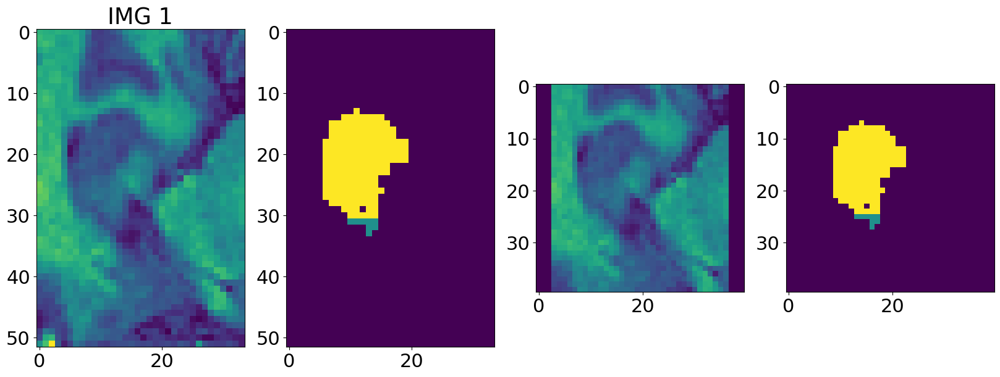

hippocampus_011
Padding value: 0.0
Normalizing intensities via 99 percentile
6 (40, 40, 31)


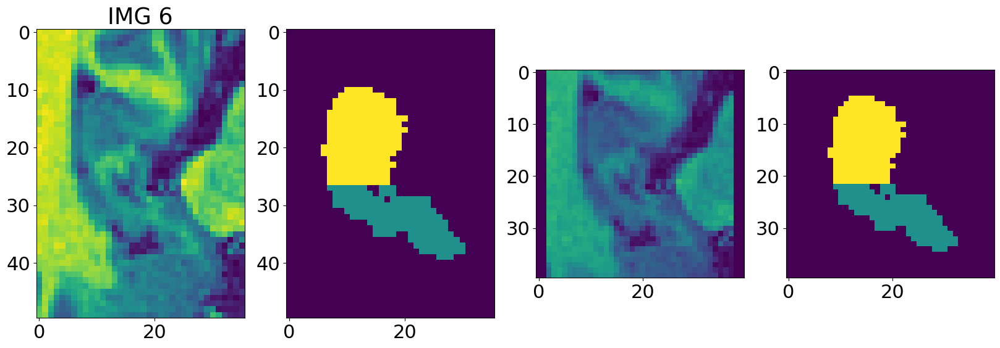

hippocampus_014
Padding value: 0.0
Normalizing intensities via 99 percentile
7 (40, 40, 40)


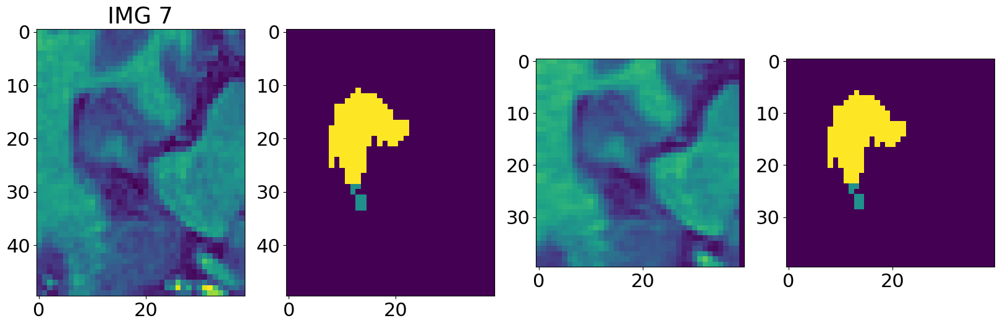

hippocampus_015
Padding value: 0.0
Normalizing intensities via 99 percentile
8 (40, 40, 28)


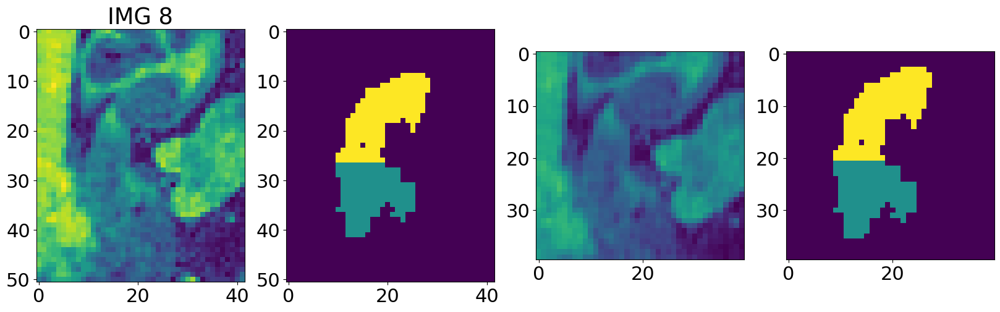

hippocampus_023
Padding value: 0.0
Normalizing intensities via 99 percentile
12 (40, 40, 35)


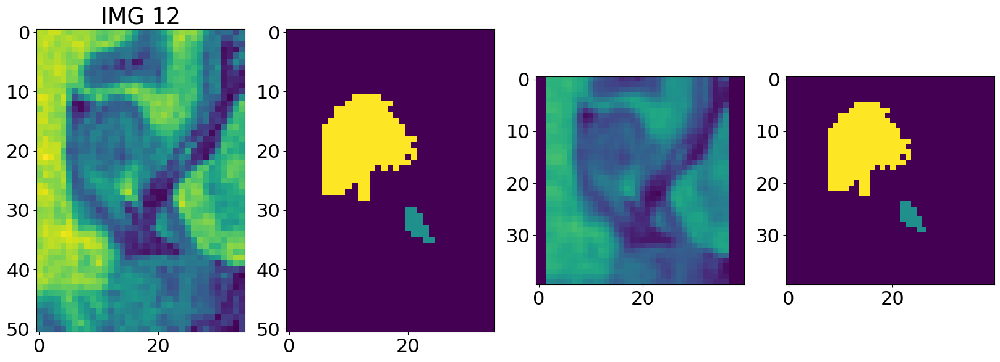

hippocampus_039
Padding value: 0.0
Normalizing intensities via 99 percentile
22 (40, 40, 34)


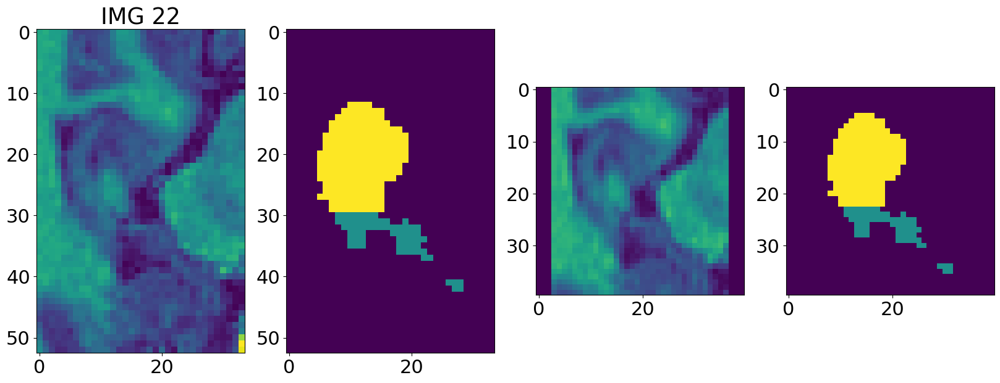

hippocampus_040
Padding value: 0.0
Normalizing intensities via 99 percentile
23 (40, 40, 37)


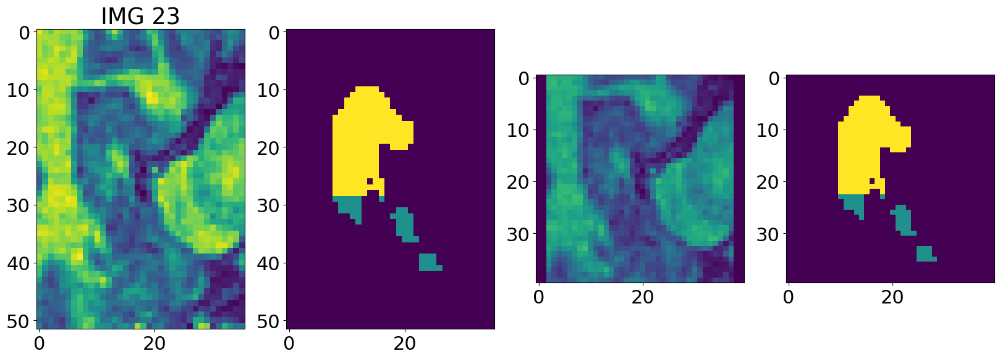

hippocampus_044
Padding value: 0.0
Normalizing intensities via 99 percentile
26 (40, 40, 33)


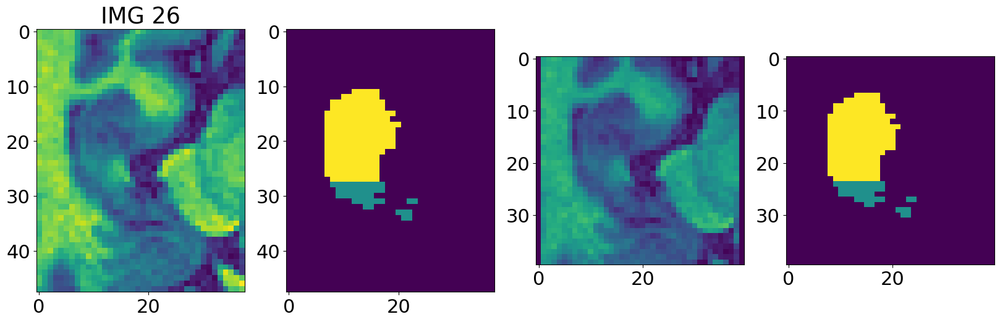

hippocampus_056
Padding value: 0.0
Normalizing intensities via 99 percentile
35 (40, 40, 42)


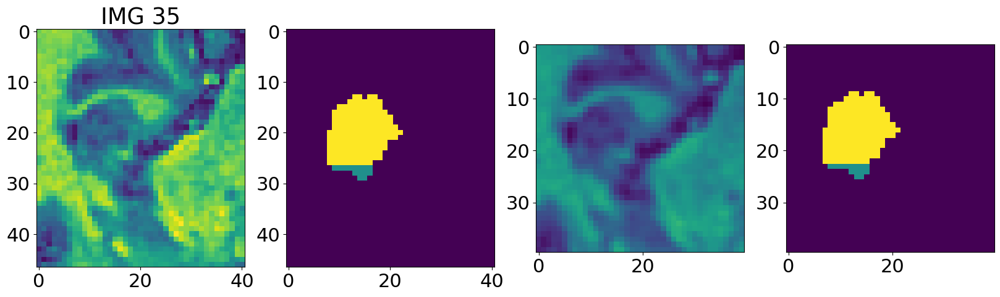

hippocampus_064
Padding value: 0.0
Normalizing intensities via 99 percentile
39 (40, 40, 35)


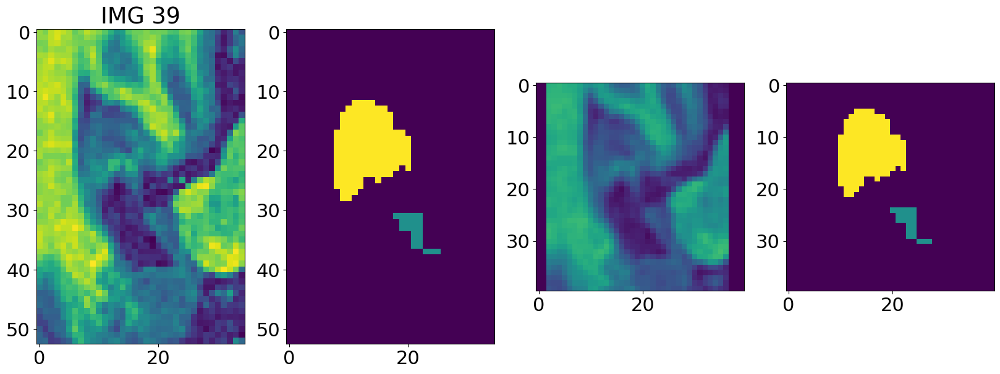

hippocampus_065
Padding value: 0.0
Normalizing intensities via 99 percentile
40 (40, 40, 37)


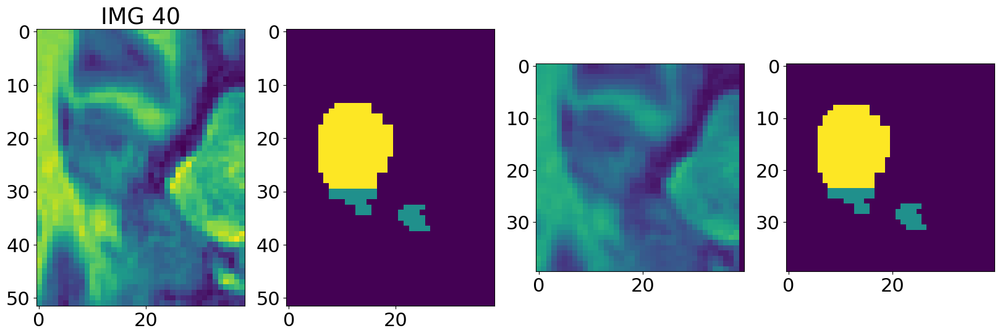

hippocampus_088
Padding value: 0.0
Normalizing intensities via 99 percentile
50 (40, 40, 35)


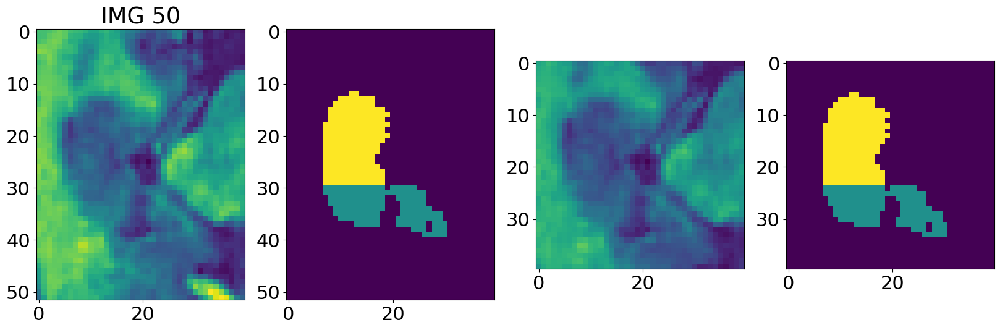

hippocampus_093
Padding value: 0.0
Normalizing intensities via 99 percentile
55 (40, 40, 37)


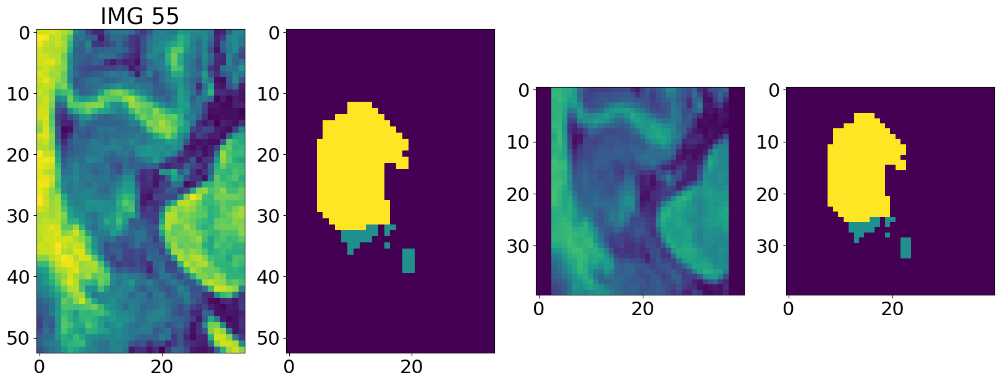

hippocampus_094
Padding value: 0.0
Normalizing intensities via 99 percentile
56 (40, 40, 38)


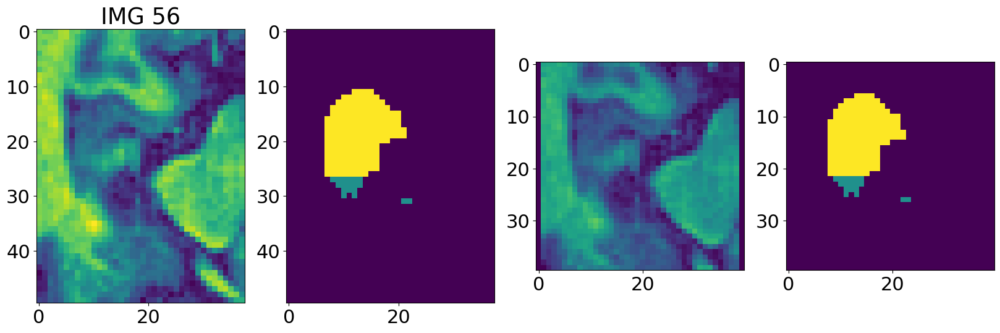

hippocampus_095
Padding value: 0.0
Normalizing intensities via 99 percentile
57 (40, 40, 39)


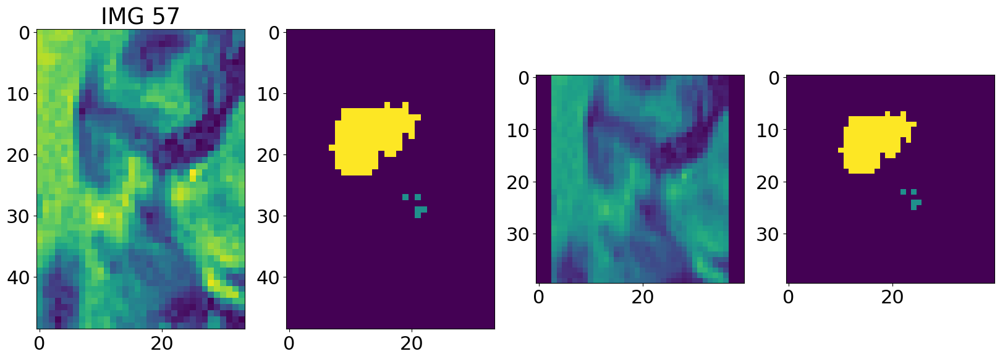

hippocampus_097
Padding value: 0.0
Normalizing intensities via 99 percentile
59 (40, 40, 34)


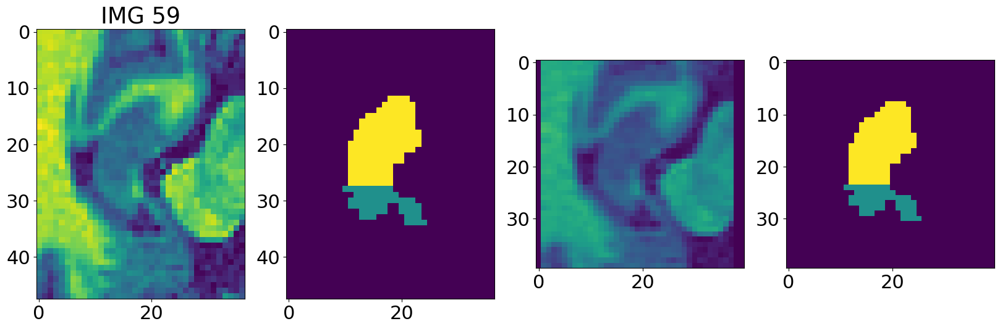

hippocampus_123
Padding value: 0.0
Normalizing intensities via 99 percentile
71 (40, 40, 38)


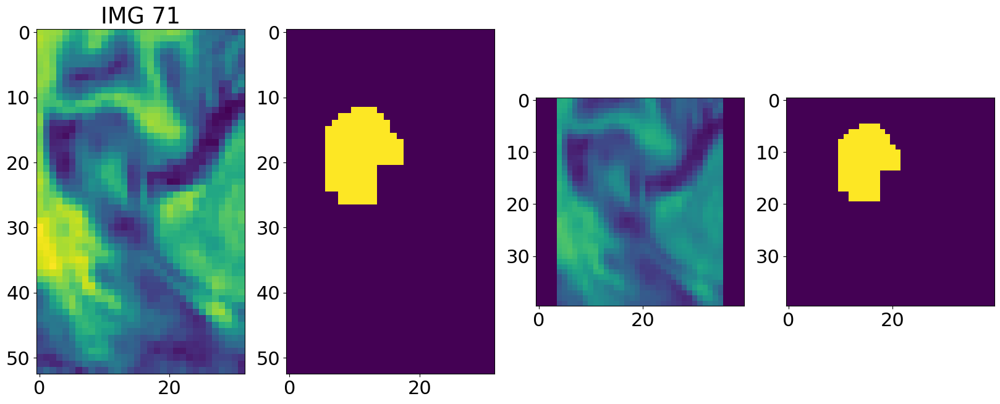

hippocampus_145
Padding value: 0.0
Normalizing intensities via 99 percentile
86 (40, 40, 33)


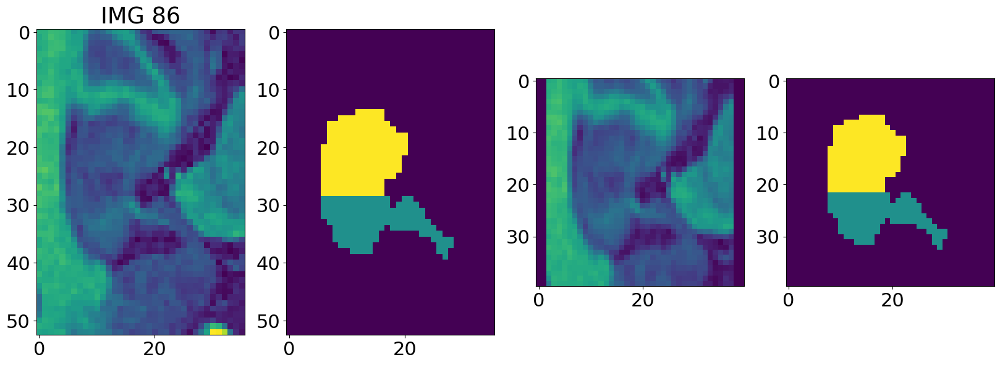

hippocampus_146
Padding value: 0.0
Normalizing intensities via 99 percentile
87 (40, 40, 32)


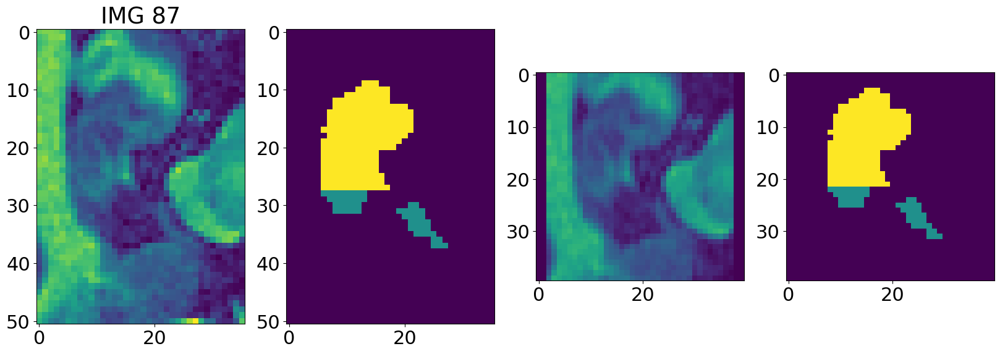

hippocampus_172
Padding value: 0.0
Normalizing intensities via 99 percentile
107 (40, 40, 31)


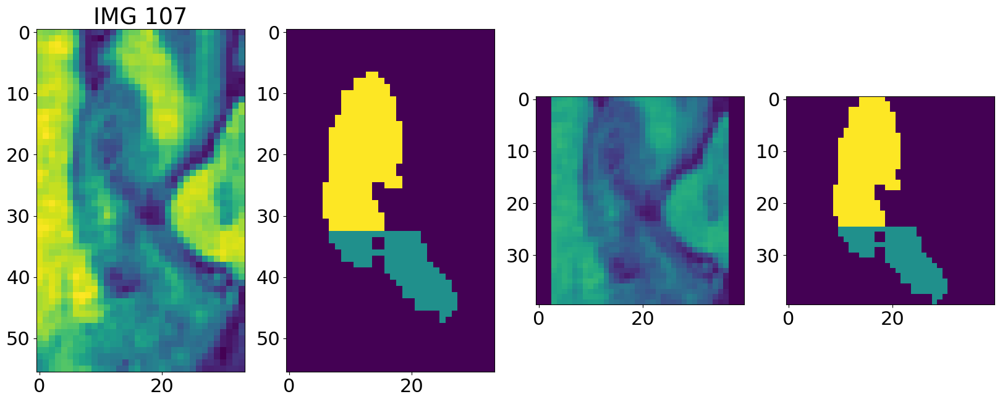

hippocampus_173
Padding value: 0.0
Normalizing intensities via 99 percentile
108 (40, 40, 32)


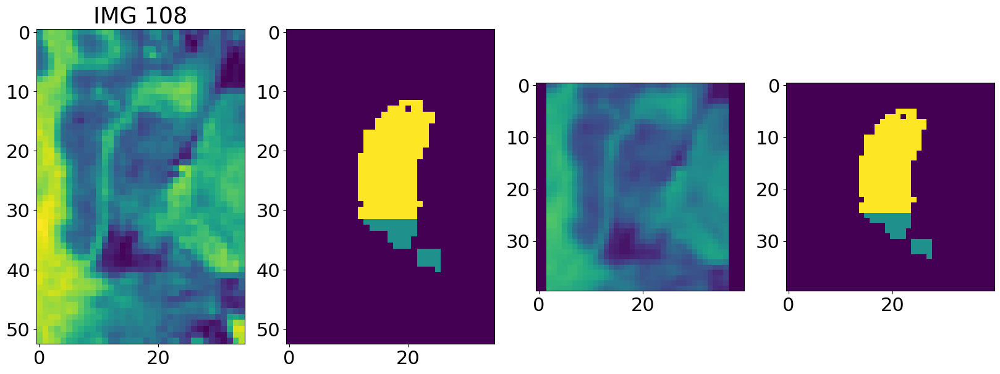

hippocampus_180
Padding value: 0.0
Normalizing intensities via 99 percentile
114 (40, 40, 36)


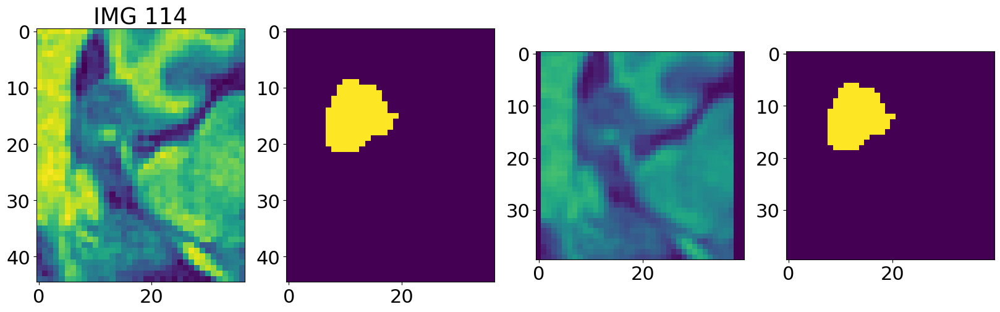

hippocampus_199
Padding value: 0.0
Normalizing intensities via 99 percentile
125 (40, 40, 26)


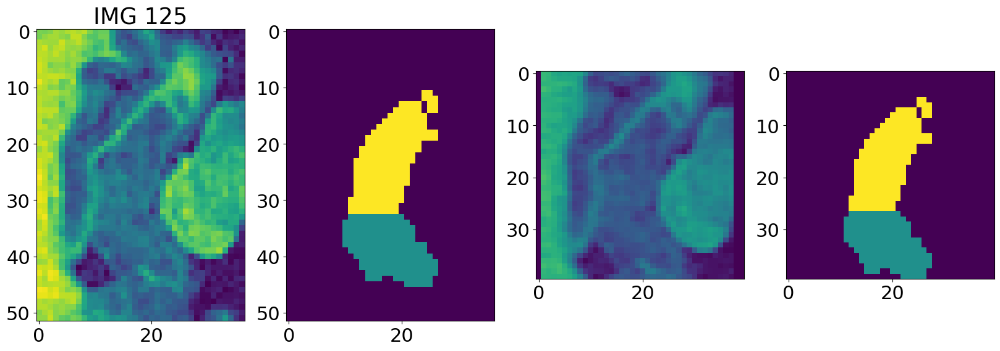

hippocampus_207
Padding value: 0.0
Normalizing intensities via 99 percentile
129 (40, 40, 33)


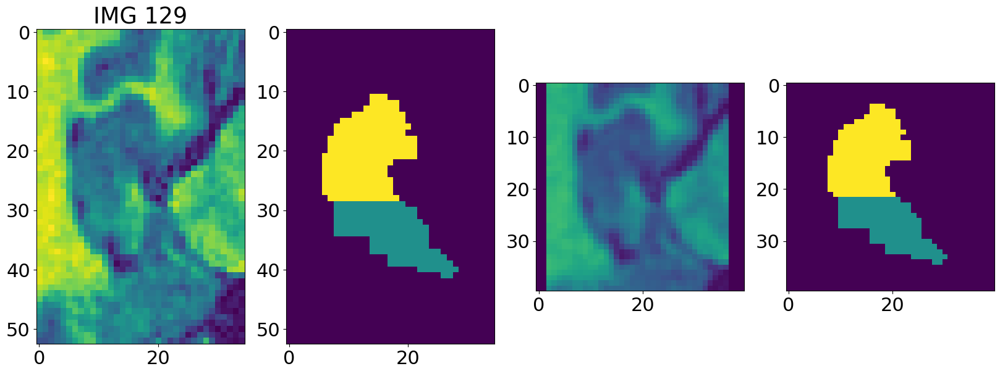

hippocampus_223
Padding value: 0.0
Normalizing intensities via 99 percentile
139 (40, 40, 37)


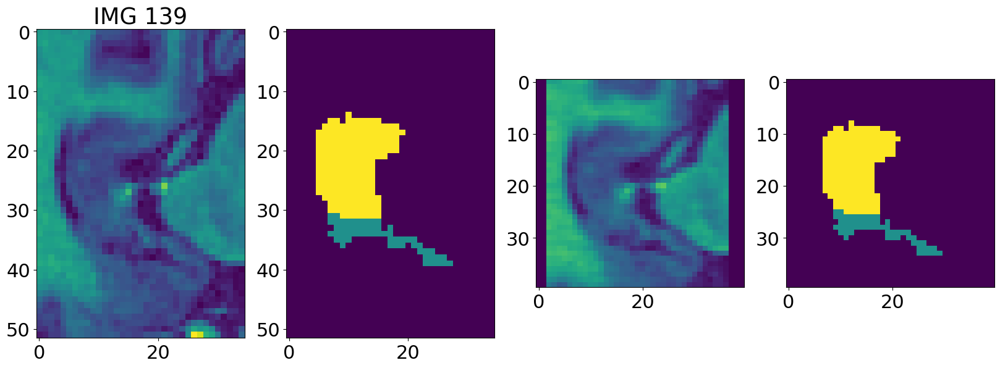

hippocampus_224
Padding value: 0.0
Normalizing intensities via 99 percentile
140 (40, 40, 37)


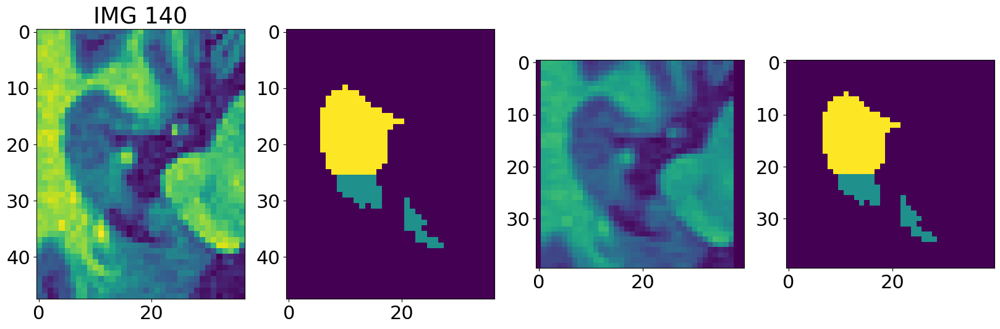

hippocampus_227
Padding value: 0.0
Normalizing intensities via 99 percentile
143 (40, 40, 36)


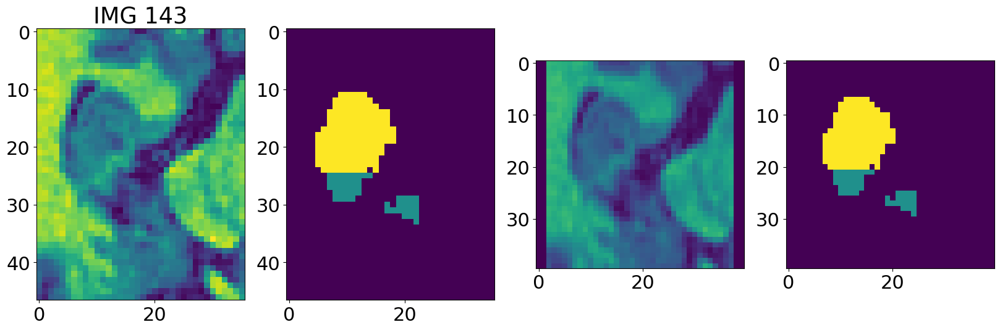

hippocampus_234
Padding value: 0.0
Normalizing intensities via 99 percentile
150 (40, 40, 36)


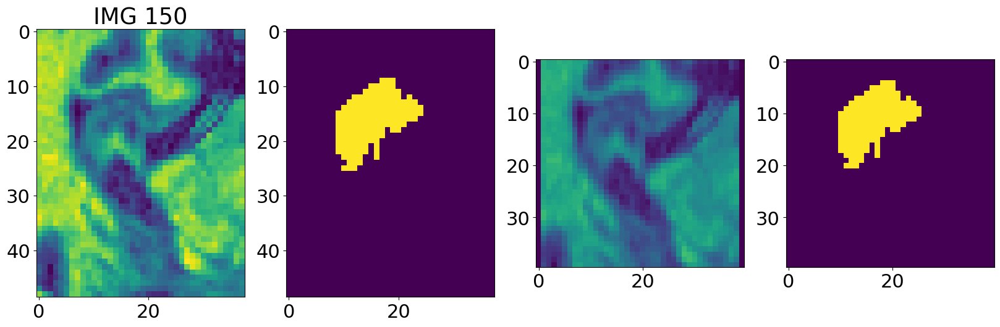

hippocampus_235
Padding value: 0.0
Normalizing intensities via 99 percentile
151 (40, 40, 35)


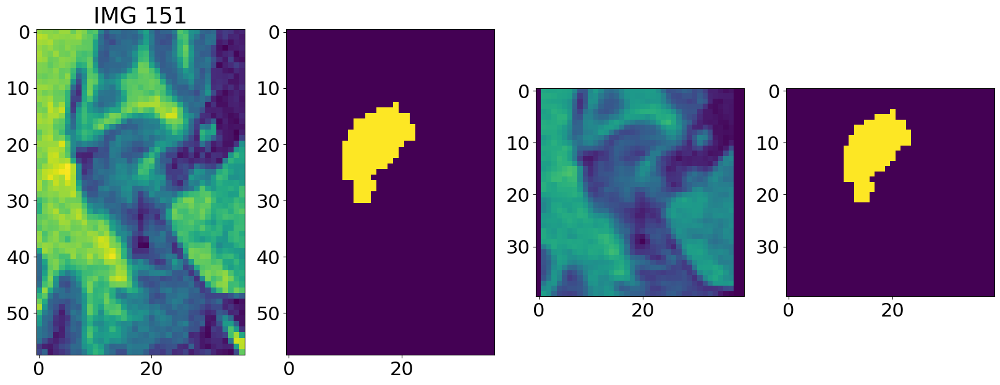

hippocampus_242
Padding value: 0.0
Normalizing intensities via 99 percentile
154 (40, 40, 34)


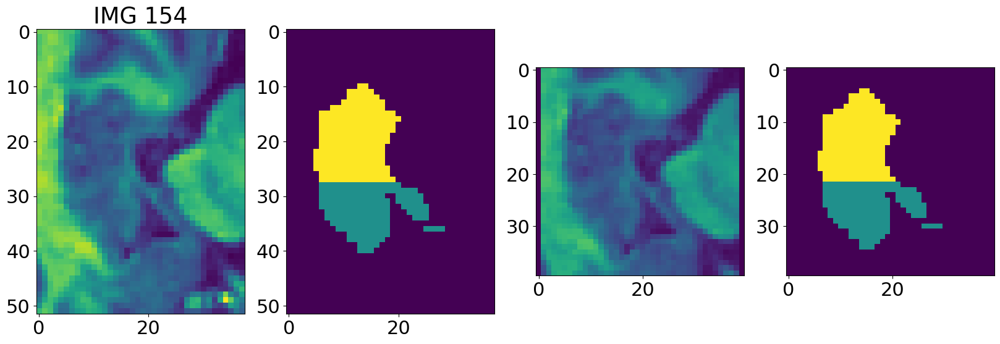

hippocampus_260
Padding value: 0.0
Normalizing intensities via 99 percentile
166 (40, 40, 29)


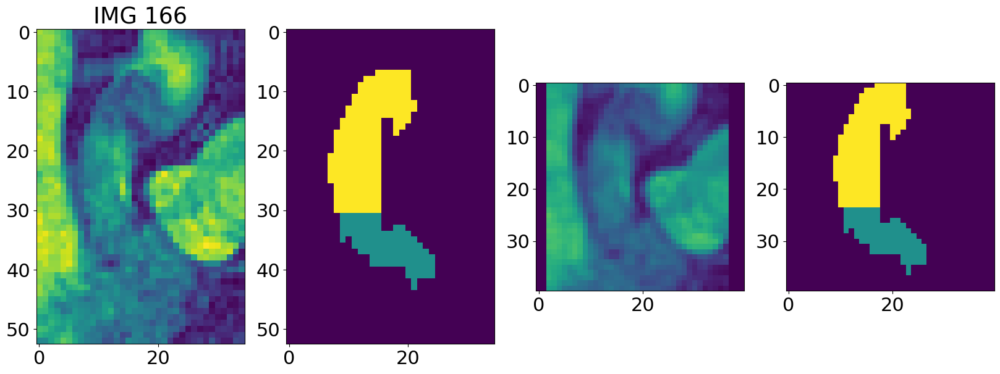

hippocampus_274
Padding value: 0.0
Normalizing intensities via 99 percentile
173 (40, 40, 40)


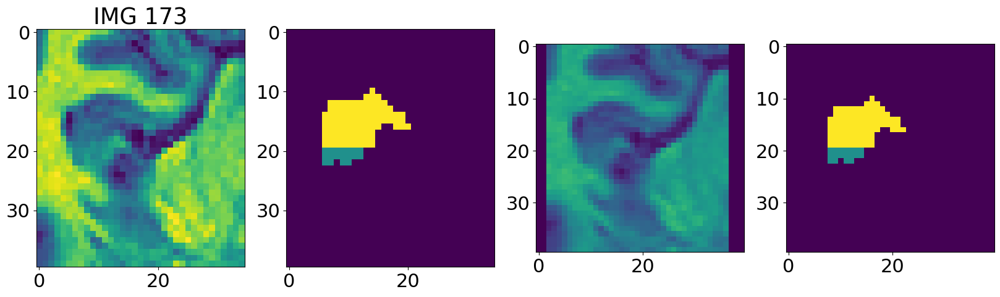

hippocampus_282
Padding value: 0.0
Normalizing intensities via 99 percentile
178 (40, 40, 32)


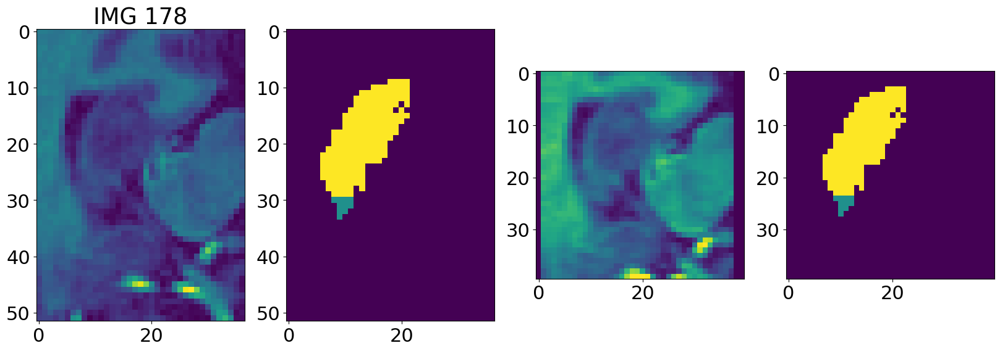

hippocampus_286
Padding value: 0.0
Normalizing intensities via 99 percentile
179 (40, 40, 46)


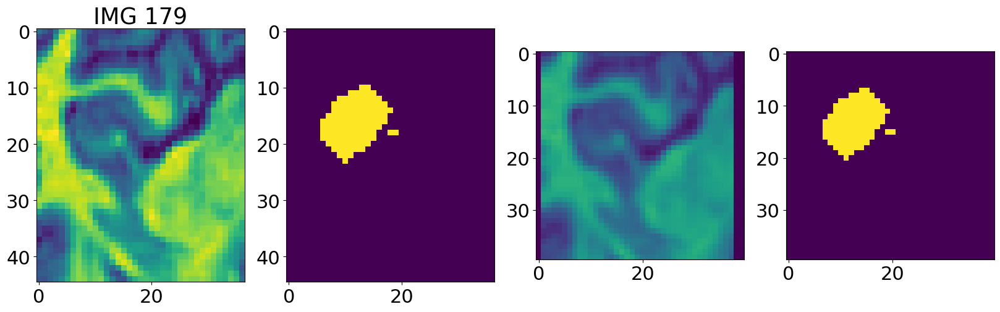

hippocampus_290
Padding value: 0.0
Normalizing intensities via 99 percentile
183 (40, 40, 40)


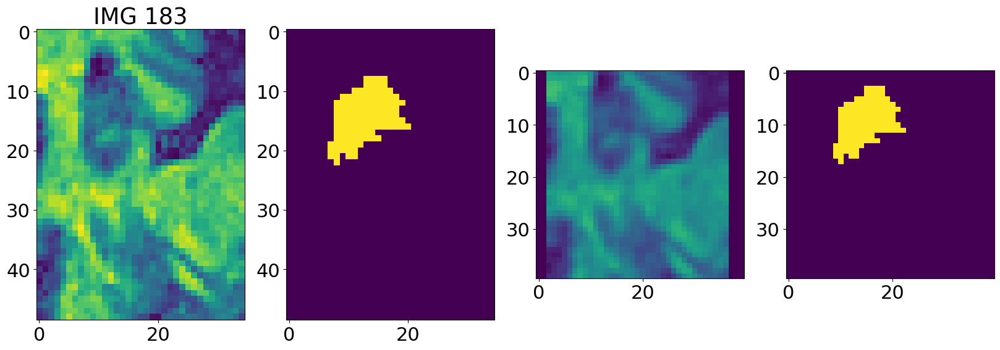

hippocampus_297
Padding value: 0.0
Normalizing intensities via 99 percentile
188 (40, 40, 30)


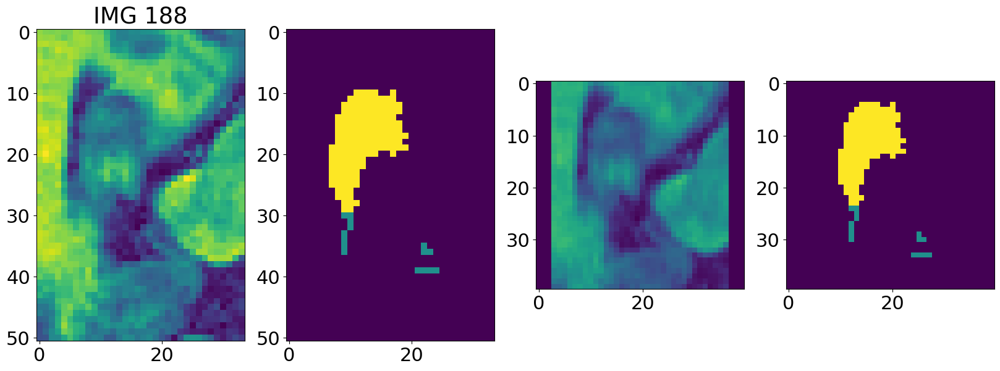

hippocampus_298
Padding value: 0.0
Normalizing intensities via 99 percentile
189 (40, 40, 33)


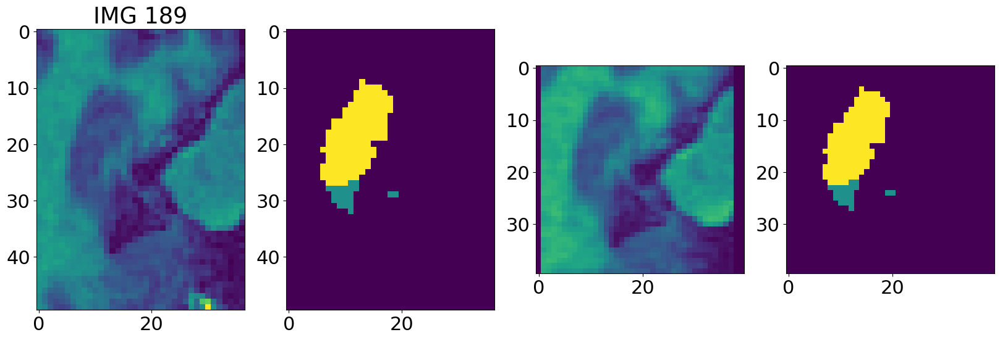

hippocampus_303
Padding value: 0.0
Normalizing intensities via 99 percentile
194 (40, 40, 38)


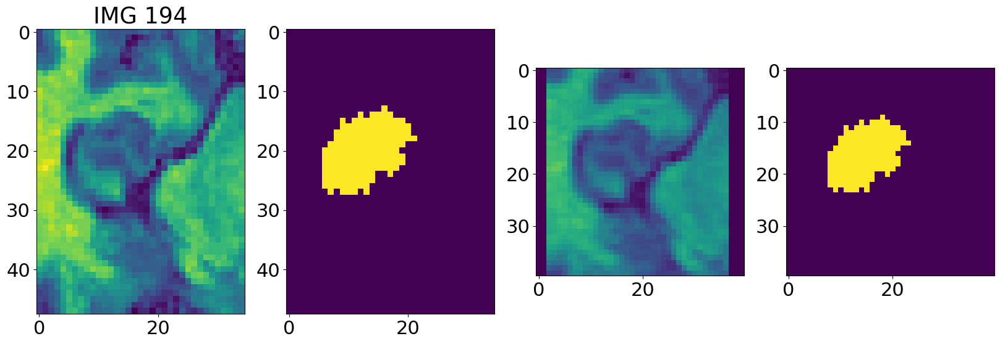

hippocampus_304
Padding value: 0.0
Normalizing intensities via 99 percentile
195 (40, 40, 38)


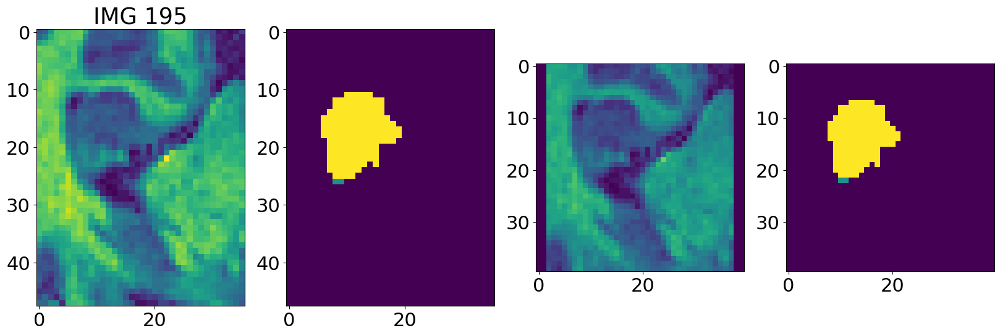

hippocampus_320
Padding value: 0.0
Normalizing intensities via 99 percentile
206 (40, 40, 34)


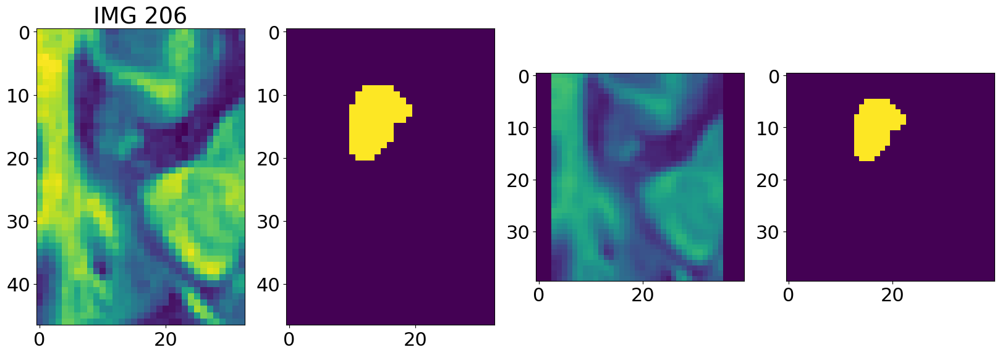

hippocampus_321
Padding value: 0.0
Normalizing intensities via 99 percentile
207 (40, 40, 34)


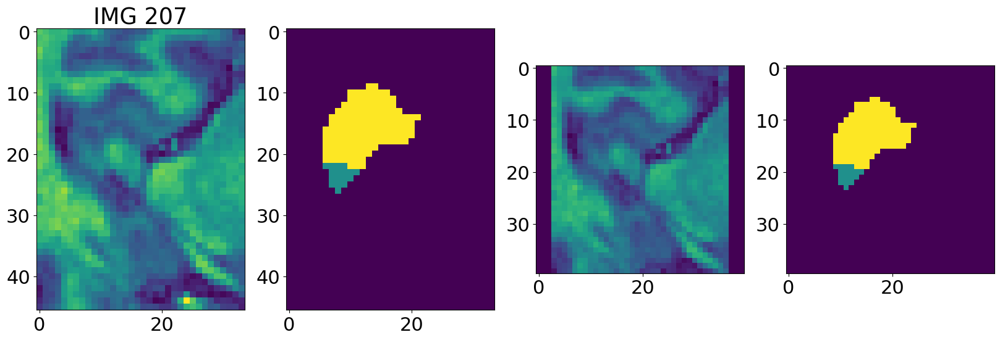

hippocampus_338
Padding value: 0.0
Normalizing intensities via 99 percentile
222 (40, 40, 43)


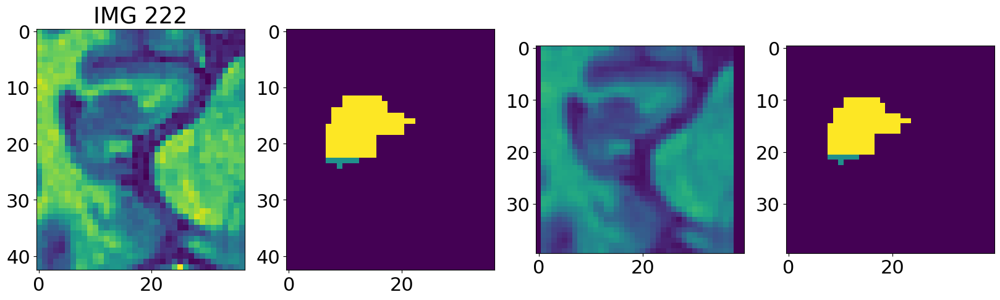

hippocampus_345
Padding value: 0.0
Normalizing intensities via 99 percentile
226 (40, 40, 30)


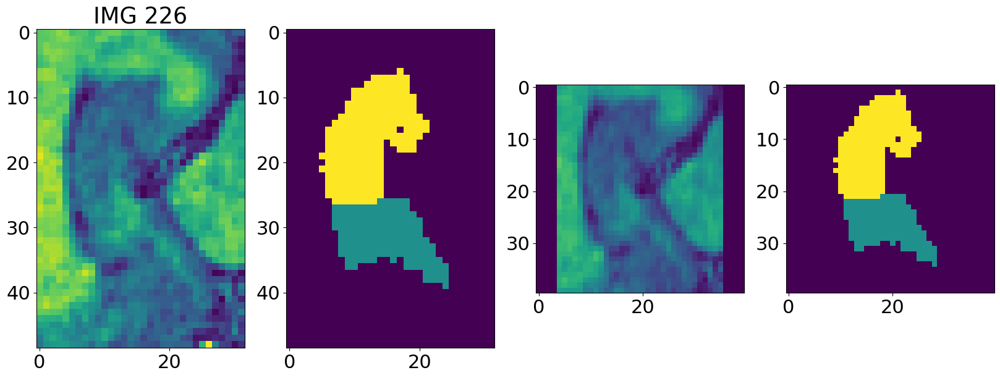

hippocampus_350
Padding value: 0.0
Normalizing intensities via 99 percentile
228 (40, 40, 34)


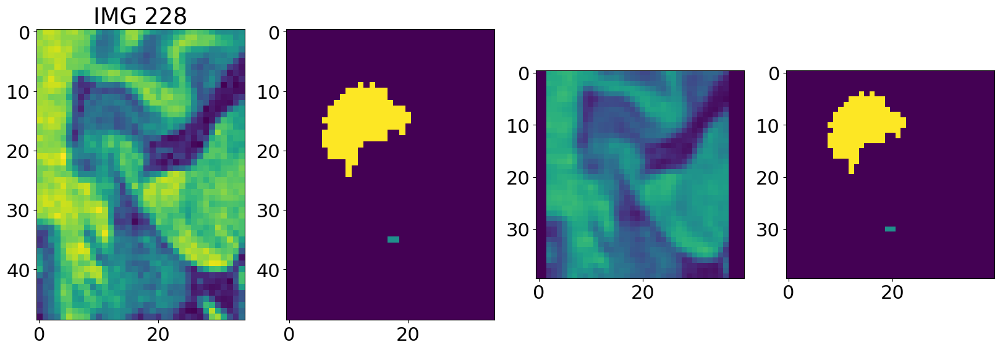

hippocampus_367
Padding value: 0.0
Normalizing intensities via 99 percentile
241 (40, 40, 37)


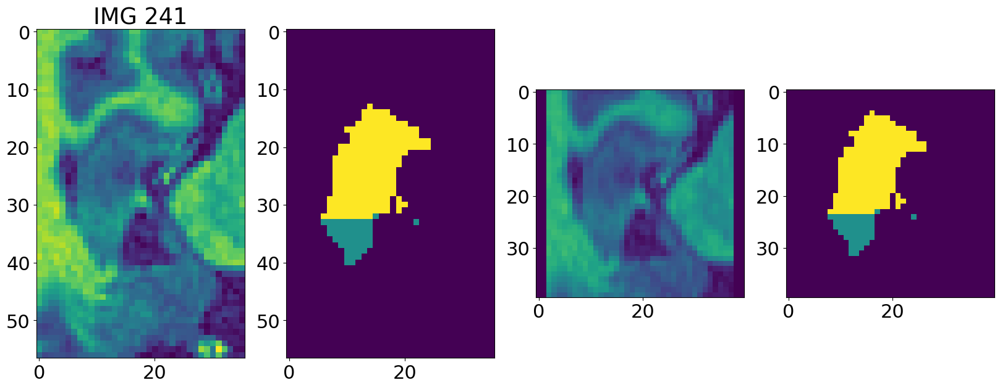

hippocampus_368
Padding value: 0.0
Normalizing intensities via 99 percentile
242 (40, 40, 40)


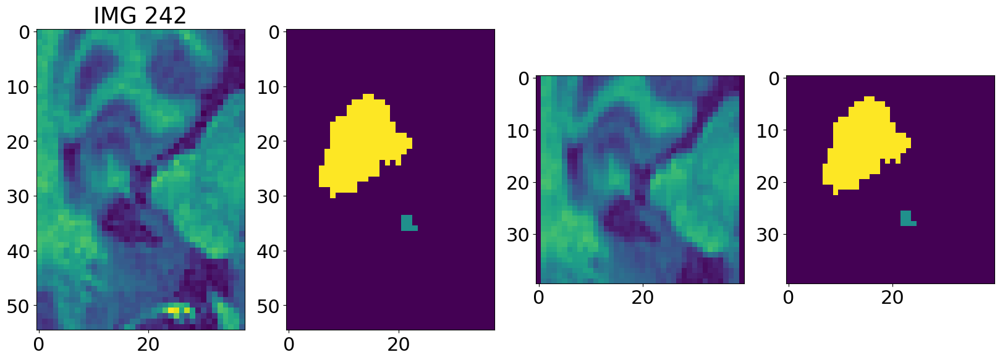

hippocampus_373
Padding value: 0.0
Normalizing intensities via 99 percentile
245 (40, 40, 35)


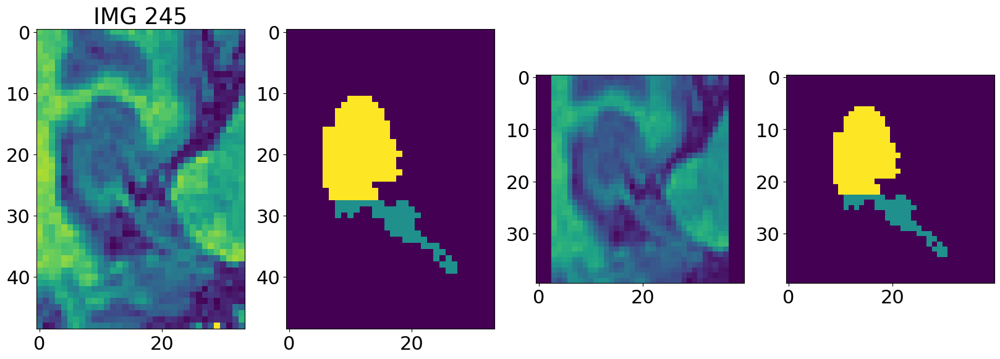

hippocampus_376
Padding value: 0.0
Normalizing intensities via 99 percentile
248 (40, 40, 37)


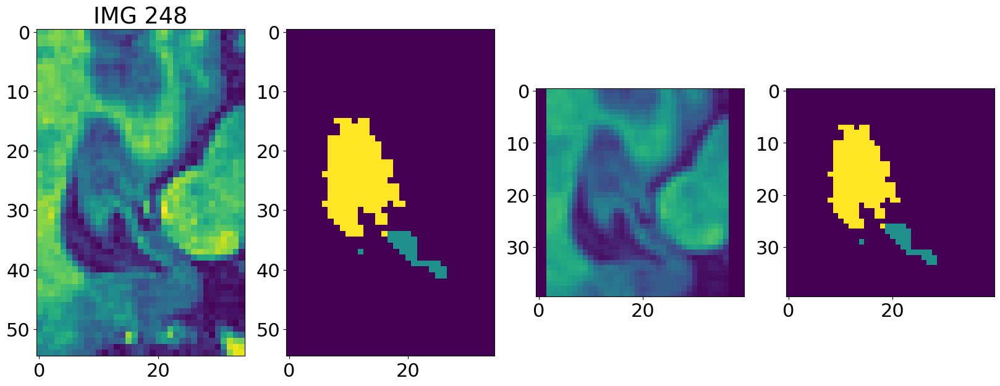

hippocampus_383
Padding value: 0.0
Normalizing intensities via 99 percentile
252 (40, 40, 29)


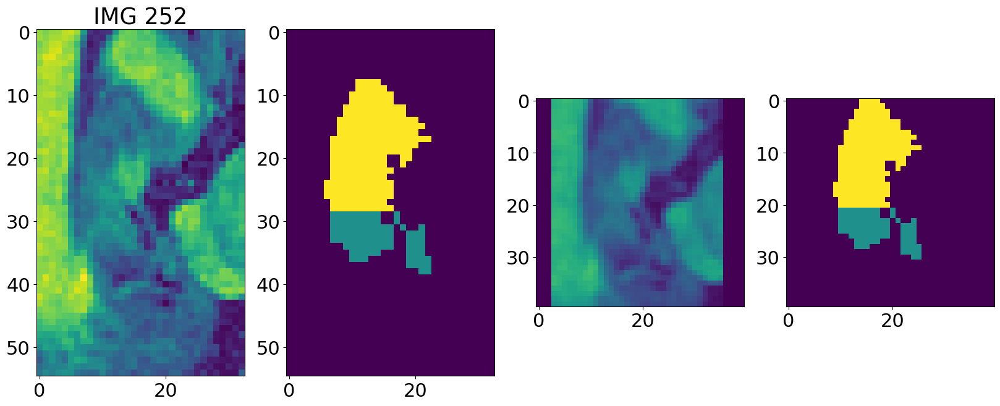

hippocampus_387
Padding value: 0.0
Normalizing intensities via 99 percentile
255 (40, 40, 32)


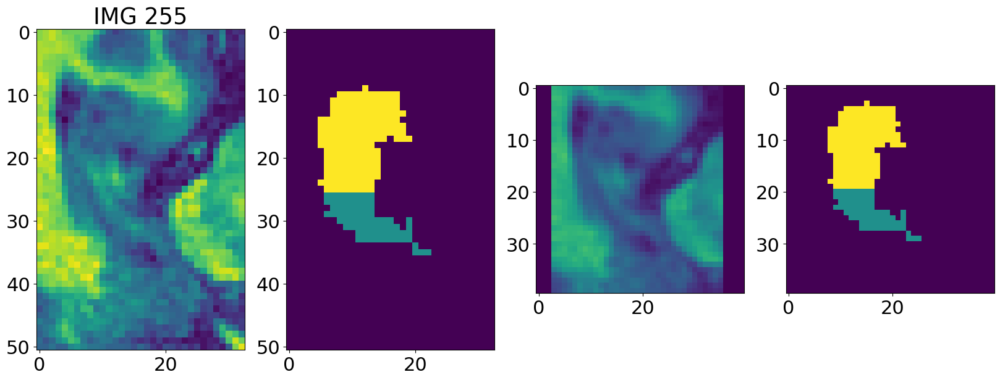

In [40]:
# Preprocesssing test data
d = DatasetPreprocessor(dataset_folder_path)
test_all_img_arr, test_all_seg_arr, \
    test_slice_info, test_scan_info, \
    test_preprocessing_info = d.preprocess_dataset(new_img_width=new_img_width, new_spacing=new_spacing, 
                                              padding_type=padding_type,
                                              vol_idx_list=test_indices, 
                                              clip_range=clip_range,
                                              normalize_min_max=normalize_min_max,
                                              normalize_percentile=normalize_percentile,
                                              center_crop_width=center_crop_width,
                                              nchannels_last=nchannels_last,
                                              plot=True
                                             )

In [26]:
test_all_img_arr.shape

(1757, 1, 50, 50)

In [24]:
test_preprocessing_info

{'geometry': {'image_width': 50,
  'spacing': 1.0,
  'resampling_width': 50,
  'padding_type': 'zero',
  'center_crop': False,
  'nchannels_last': False},
 'intensities': {'clip_range': [],
  'normalize_min_max': False,
  'normalization_percentile': 99}}

In [25]:
# Saving preprocessed data
preprocessing_type = 'test'

# We create the folders to save the preprocessed data
temp_save_folder = os.path.join(data_folder, dataset_name, 'preprocessed', preprocessing_type)
save_folder = create_unexisting_folder(temp_save_folder)
print('Saving preprocessed data in {}'.format(save_folder))

# We save data (image) and label in two .hdf5 files
for idx in range(len(test_all_img_arr)):
    # We save the preprocessed files
    volume_save_path = os.path.join(save_folder, 'data')
    save_hdf5(test_all_img_arr[idx, :, :, :], idx, volume_save_path + '.hdf5')

    label_save_path = os.path.join(save_folder, 'label')
    save_hdf5(test_all_seg_arr[idx, :, :], idx, label_save_path + '.hdf5')
    
# We save the *_info dictionaries as json files
preprocessing_info_path = os.path.join(save_folder, 'preprocessing_info.json')
with open(preprocessing_info_path, "w") as file:
    json.dump(test_preprocessing_info , file) 
    
scan_info_path = os.path.join(save_folder, 'scan_info.json')
with open(scan_info_path, "w") as file:
    json.dump(test_scan_info , file) 
    
slice_info_path = os.path.join(save_folder, 'slice_info.json')
with open(slice_info_path, "w") as file:
    json.dump(test_slice_info , file) 

Saving preprocessed data in /home/ar32500@ens.ad.etsmtl.ca/moneta_data/users/melanie/data/Task04_Hippocampus/preprocessed/test


/home/ar32500@ens.ad.etsmtl.ca/SelfSupervisedAL/src/Utils/load_utils.py:86: UserWarning: swmr=True only affects read ('r') mode. For swmr write mode, set f.swmr_mode = True after opening the file.
  with h5py.File(dest_file, "a", libver='latest', swmr=True) as hf:


['hippocampus_003', 'hippocampus_011', 'hippocampus_014', 'hippocampus_015', 'hippocampus_023', 'hippocampus_039', 'hippocampus_040', 'hippocampus_044', 'hippocampus_056', 'hippocampus_064', 'hippocampus_065', 'hippocampus_088', 'hippocampus_093', 'hippocampus_094', 'hippocampus_095', 'hippocampus_097', 'hippocampus_123', 'hippocampus_145', 'hippocampus_146', 'hippocampus_172', 'hippocampus_173', 'hippocampus_180', 'hippocampus_199', 'hippocampus_207', 'hippocampus_223', 'hippocampus_224', 'hippocampus_227', 'hippocampus_234', 'hippocampus_235', 'hippocampus_242', 'hippocampus_260', 'hippocampus_274', 'hippocampus_282', 'hippocampus_286', 'hippocampus_290', 'hippocampus_297', 'hippocampus_298', 'hippocampus_303', 'hippocampus_304', 'hippocampus_320', 'hippocampus_321', 'hippocampus_338', 'hippocampus_345', 'hippocampus_350', 'hippocampus_367', 'hippocampus_368', 'hippocampus_373', 'hippocampus_376', 'hippocampus_383', 'hippocampus_387']


hippocampus_003


(-0.5, 299.5, 299.5, -0.5)

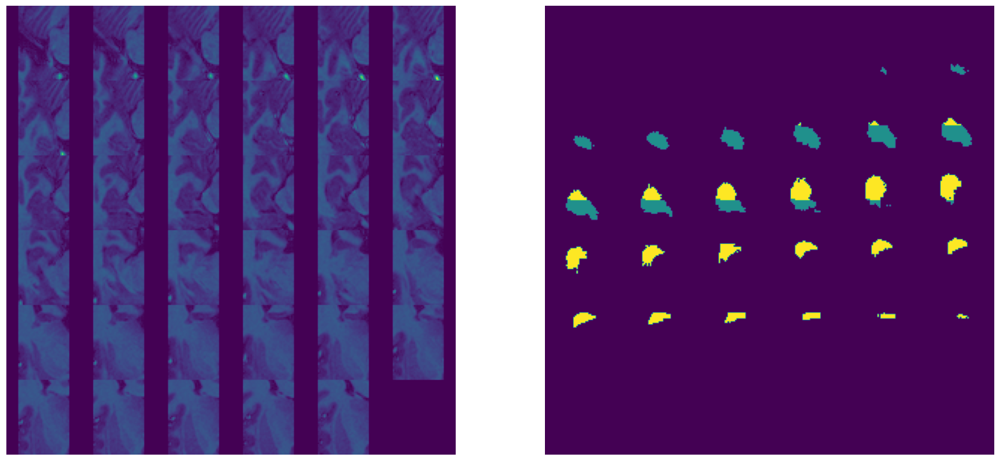

In [26]:
print(list(test_scan_info.keys()))
print('\n')

patient = list(test_scan_info.keys())[0]
print(patient)
patient_indices = [i for i in range(len(test_all_img_arr)) if i in test_scan_info[patient]['idx_list']]

# We plot the montage
fig = plt.figure(figsize = (20, 10))
ax = fig.add_subplot(1, 2, 1)

if nchannels_last:
    ax.imshow(montage2d(test_all_img_arr[patient_indices, :, :, 0], fill=0), cmap='viridis')
else:
    ax.imshow(montage2d(test_all_img_arr[patient_indices, 0, :, :], fill=0), cmap='viridis')
plt.axis('off')

ax = fig.add_subplot(1, 2, 2)
ax.imshow(montage2d(test_all_seg_arr[patient_indices, :, :], fill=0), cmap='viridis')
plt.axis('off')

### Preprocess and save train data

In [27]:
# We get the rest of the indices for training
_all_train_indices = np.setdiff1d(all_indices, test_indices)
train_indices = _all_train_indices.tolist()
print(len(train_indices))

210


hippocampus_001
Padding value: 0.0
Normalizing intensities via 99 percentile
0 (50, 50, 35)


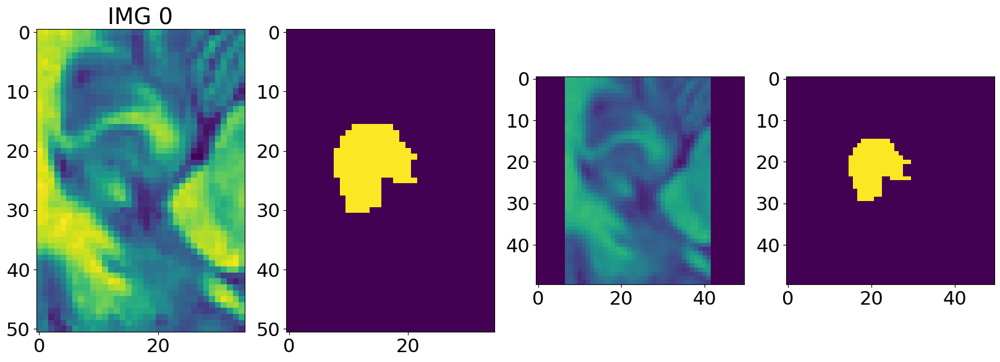

hippocampus_004
Padding value: 0.0
Normalizing intensities via 99 percentile
2 (50, 50, 38)


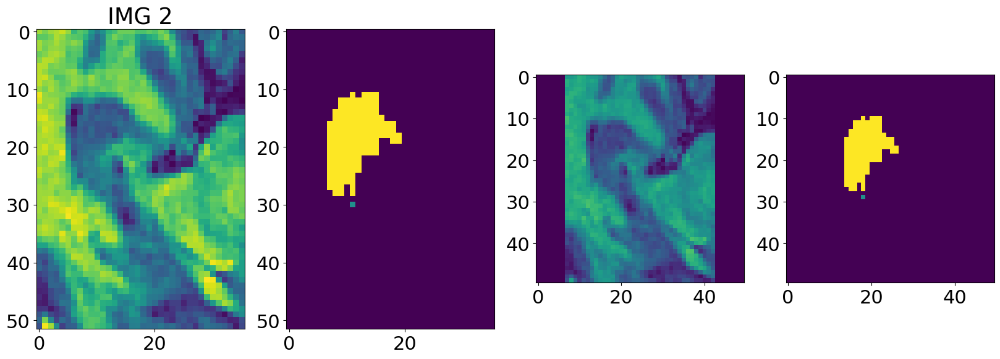

hippocampus_006
Padding value: 0.0
Normalizing intensities via 99 percentile
3 (50, 50, 34)


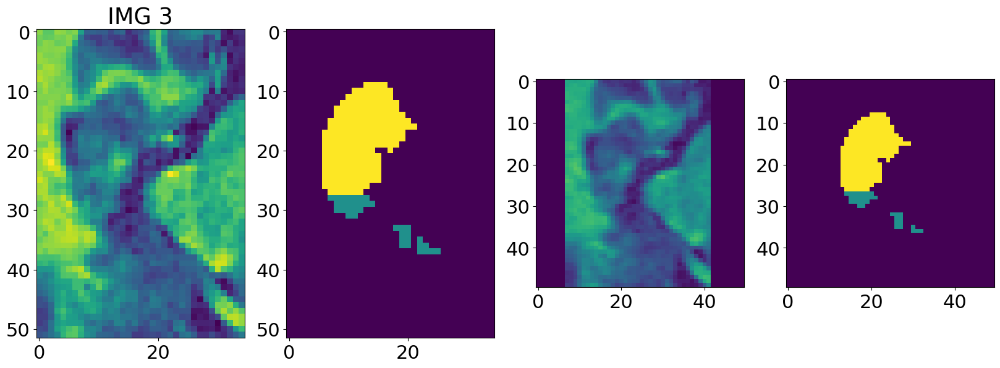

hippocampus_007
Padding value: 0.0
Normalizing intensities via 99 percentile
4 (50, 50, 40)


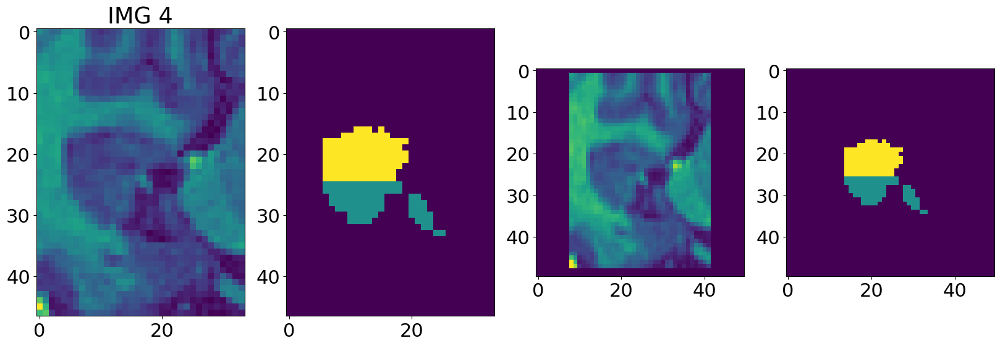

hippocampus_008
Padding value: 0.0
Normalizing intensities via 99 percentile
5 (50, 50, 40)


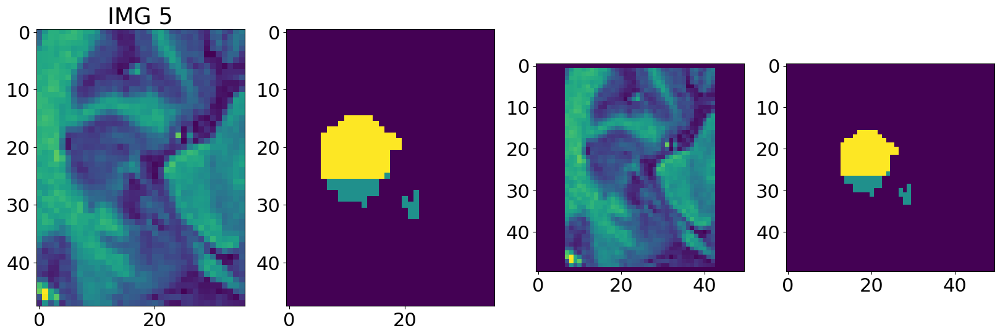

hippocampus_017
Padding value: 0.0
Normalizing intensities via 99 percentile
9 (50, 50, 32)


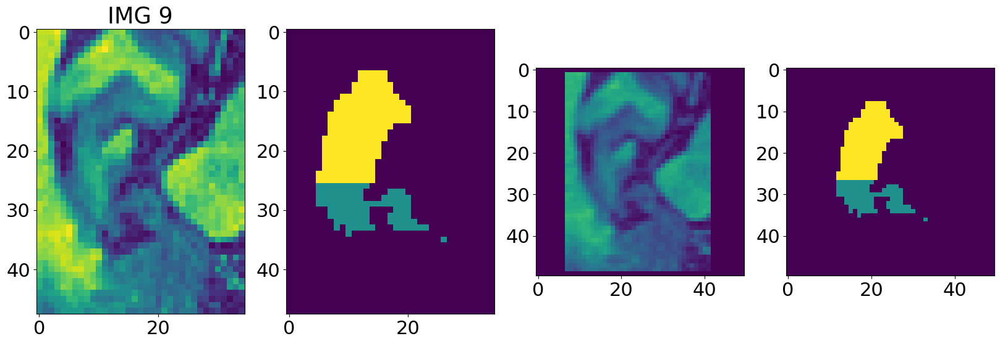

hippocampus_019
Padding value: 0.0
Normalizing intensities via 99 percentile
10 (50, 50, 41)


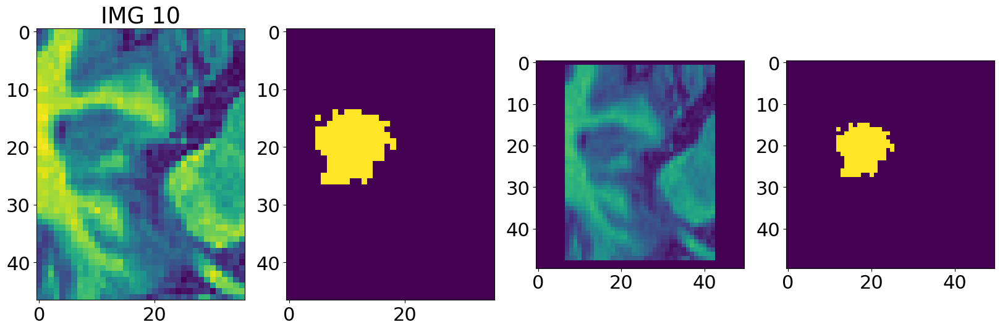

hippocampus_020
Padding value: 0.0
Normalizing intensities via 99 percentile
11 (50, 50, 43)


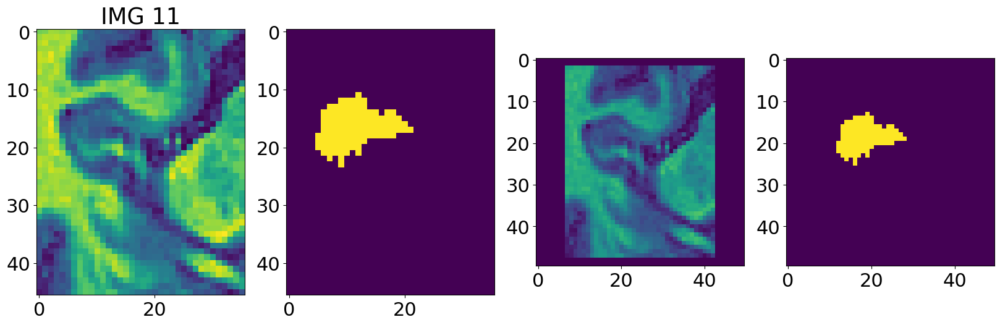

hippocampus_024
Padding value: 0.0
Normalizing intensities via 99 percentile
13 (50, 50, 33)


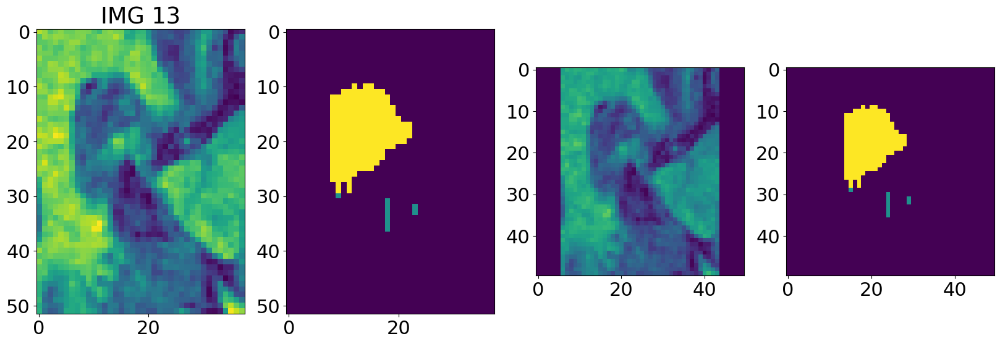

hippocampus_025
Padding value: 0.0
Normalizing intensities via 99 percentile
14 (50, 50, 35)


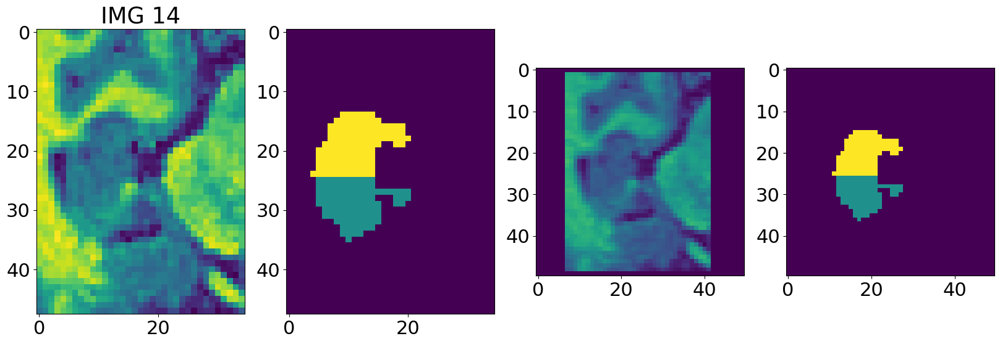

hippocampus_026
Padding value: 0.0
Normalizing intensities via 99 percentile
15 (50, 50, 36)


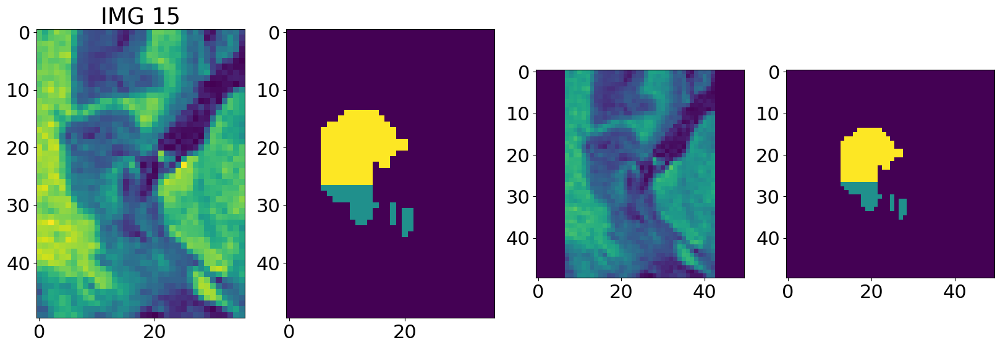

hippocampus_033
Padding value: 0.0
Normalizing intensities via 99 percentile
16 (50, 50, 38)


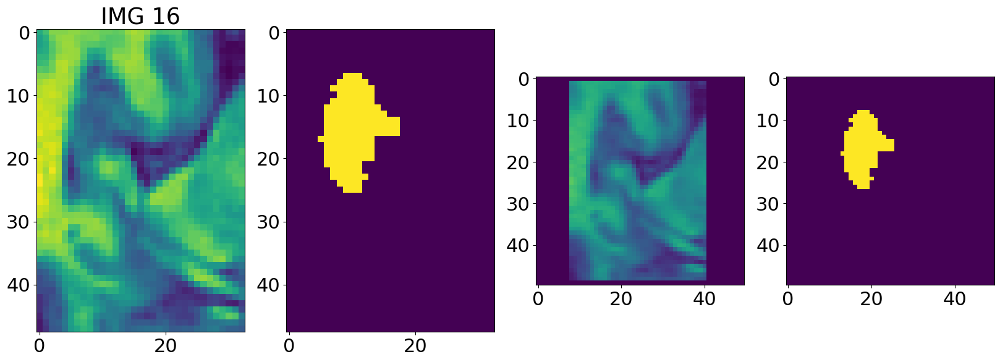

hippocampus_034
Padding value: 0.0
Normalizing intensities via 99 percentile
17 (50, 50, 40)


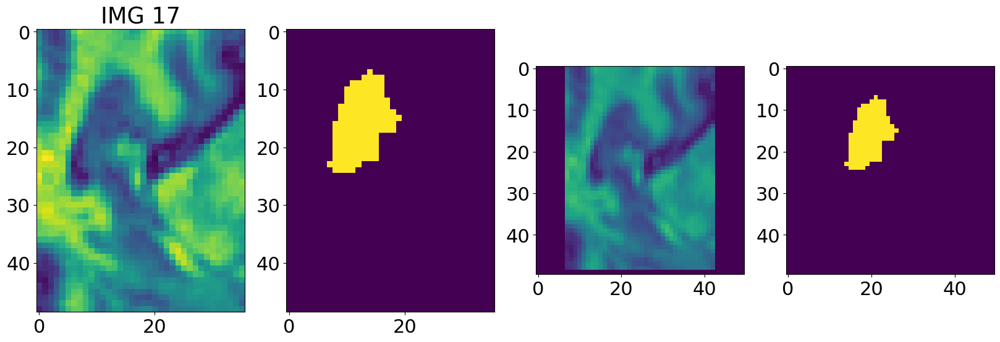

hippocampus_035
Padding value: 0.0
Normalizing intensities via 99 percentile
18 (50, 50, 37)


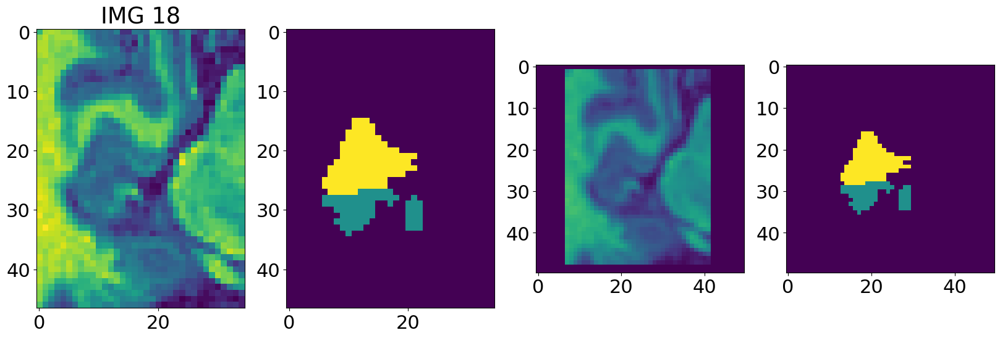

hippocampus_036
Padding value: 0.0
Normalizing intensities via 99 percentile
19 (50, 50, 39)


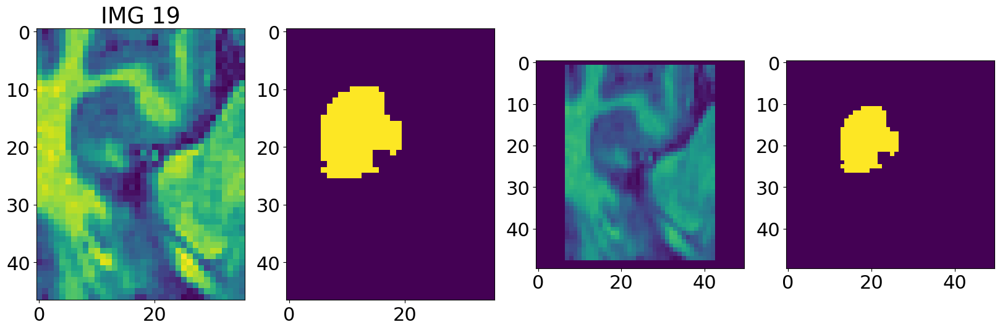

hippocampus_037
Padding value: 0.0
Normalizing intensities via 99 percentile
20 (50, 50, 32)


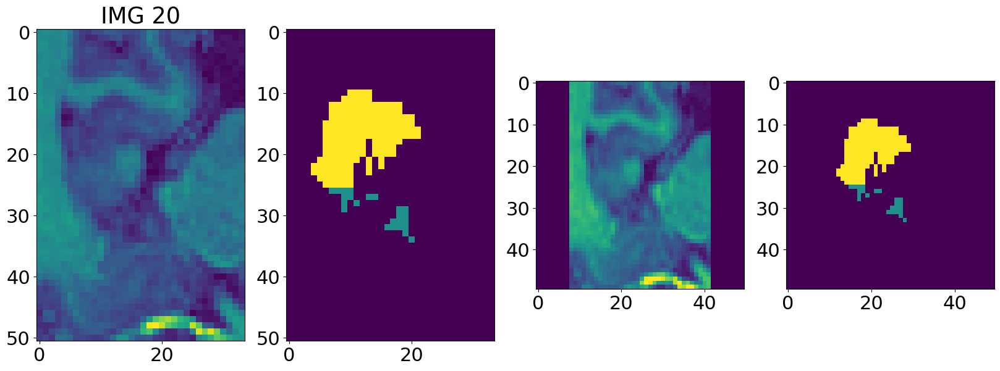

hippocampus_038
Padding value: 0.0
Normalizing intensities via 99 percentile
21 (50, 50, 35)


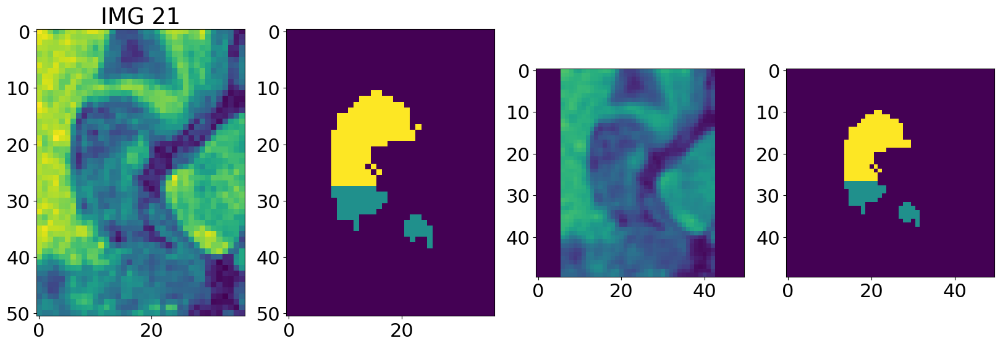

hippocampus_041
Padding value: 0.0
Normalizing intensities via 99 percentile
24 (50, 50, 34)


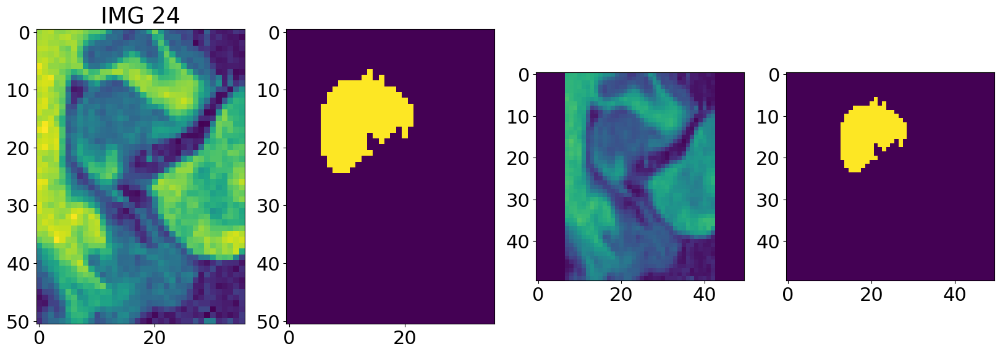

hippocampus_042
Padding value: 0.0
Normalizing intensities via 99 percentile
25 (50, 50, 34)


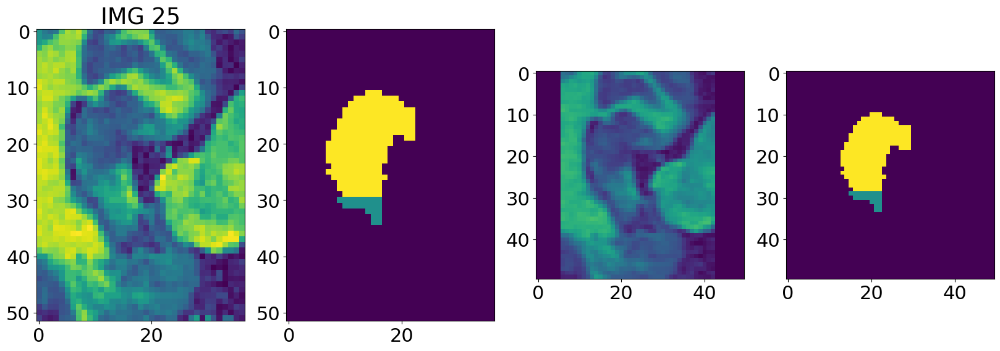

hippocampus_045
Padding value: 0.0
Normalizing intensities via 99 percentile
27 (50, 50, 37)


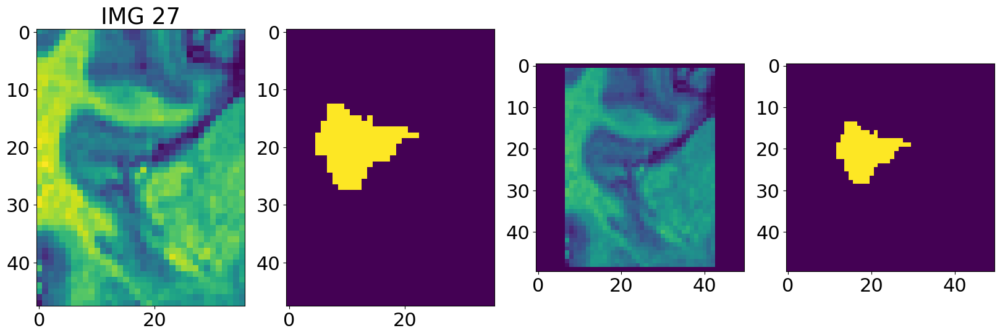

hippocampus_046
Padding value: 0.0
Normalizing intensities via 99 percentile
28 (50, 50, 38)


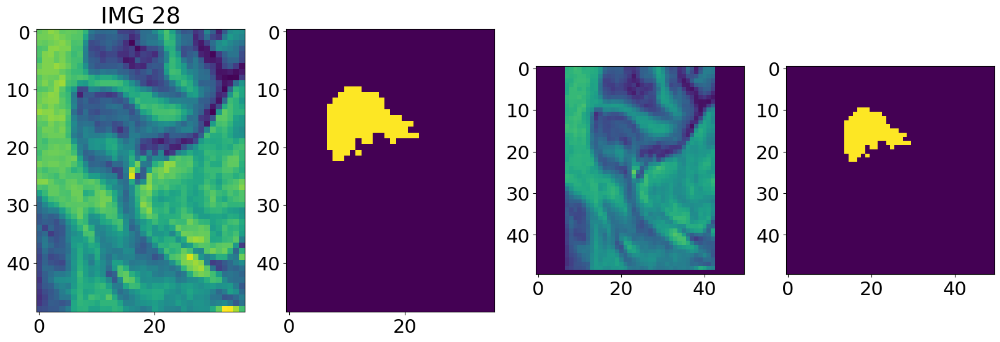

hippocampus_048
Padding value: 0.0
Normalizing intensities via 99 percentile
29 (50, 50, 29)


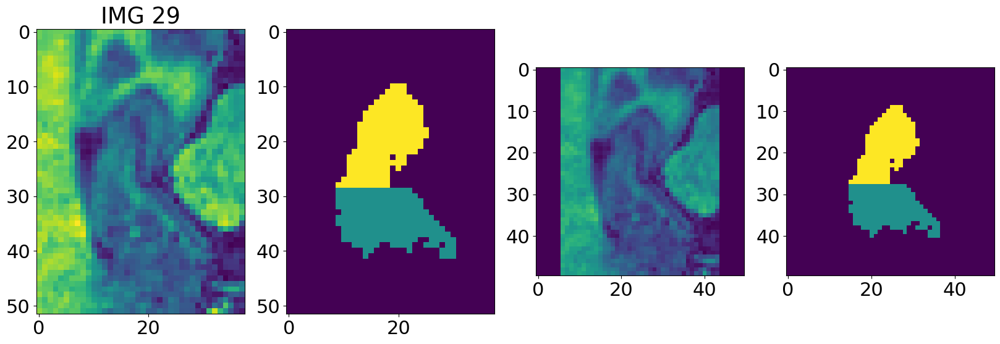

hippocampus_049
Padding value: 0.0
Normalizing intensities via 99 percentile
30 (50, 50, 36)


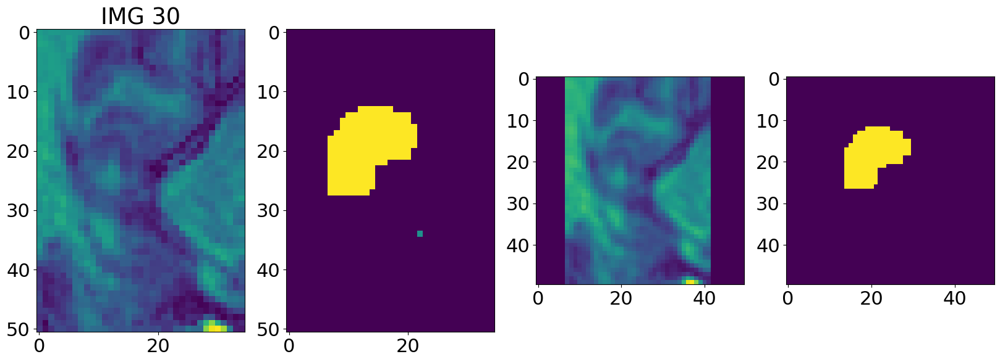

hippocampus_050
Padding value: 0.0
Normalizing intensities via 99 percentile
31 (50, 50, 38)


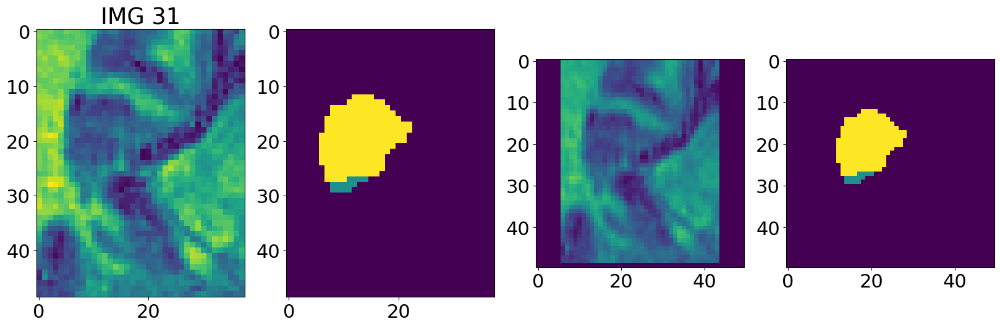

hippocampus_051
Padding value: 0.0
Normalizing intensities via 99 percentile
32 (50, 50, 39)


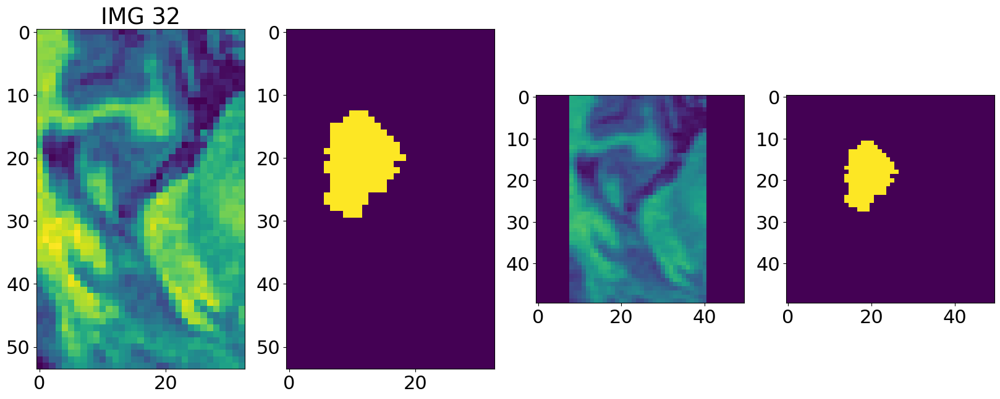

hippocampus_052
Padding value: 0.0
Normalizing intensities via 99 percentile
33 (50, 50, 40)


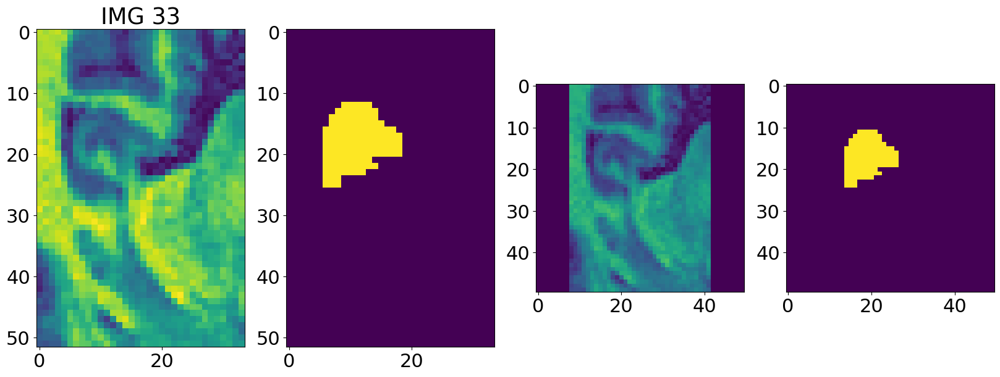

hippocampus_053
Padding value: 0.0
Normalizing intensities via 99 percentile
34 (50, 50, 35)


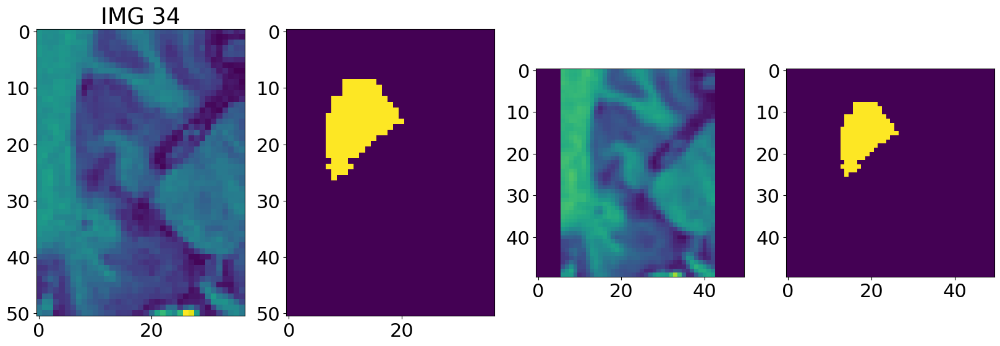

hippocampus_057
Padding value: 0.0
Normalizing intensities via 99 percentile
36 (50, 50, 34)


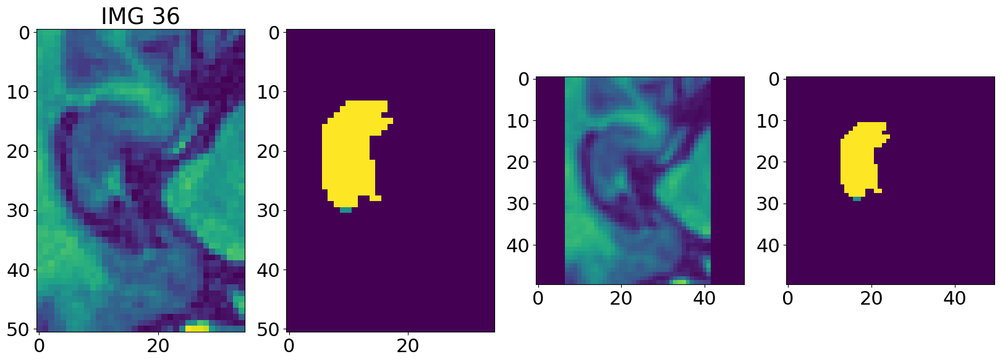

hippocampus_058
Padding value: 0.0
Normalizing intensities via 99 percentile
37 (50, 50, 36)


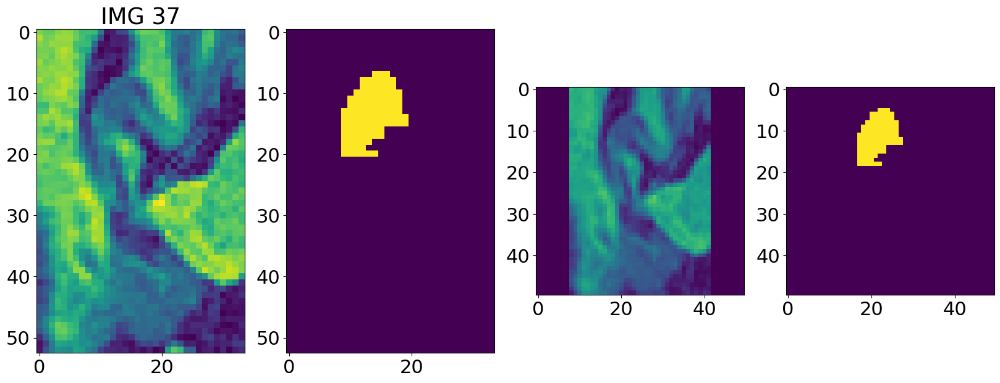

hippocampus_060
Padding value: 0.0
Normalizing intensities via 99 percentile
38 (50, 50, 31)


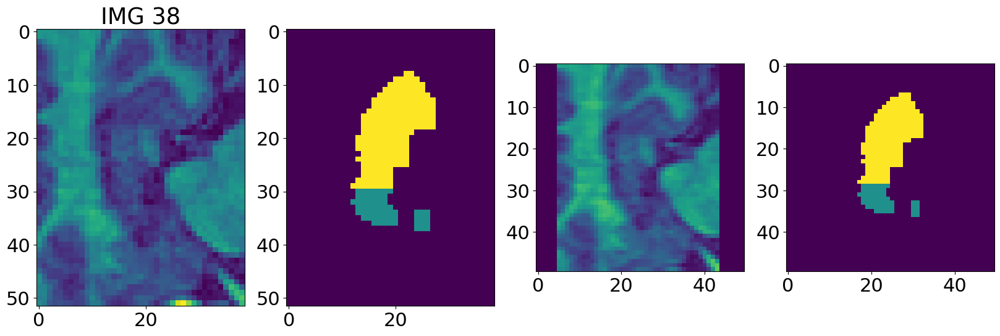

hippocampus_067
Padding value: 0.0
Normalizing intensities via 99 percentile
41 (50, 50, 41)


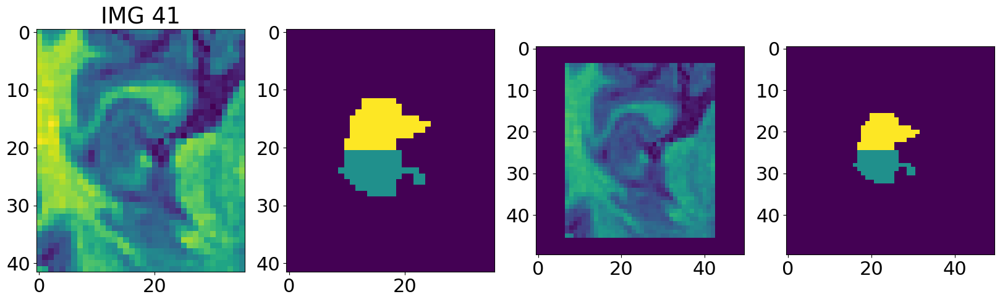

hippocampus_068
Padding value: 0.0
Normalizing intensities via 99 percentile
42 (50, 50, 43)


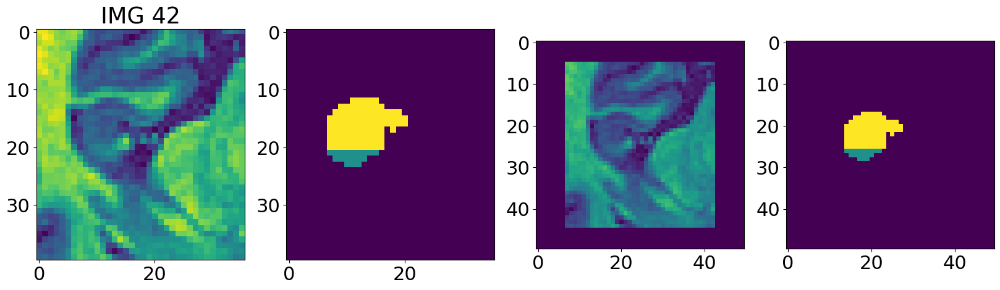

hippocampus_070
Padding value: 0.0
Normalizing intensities via 99 percentile
43 (50, 50, 38)


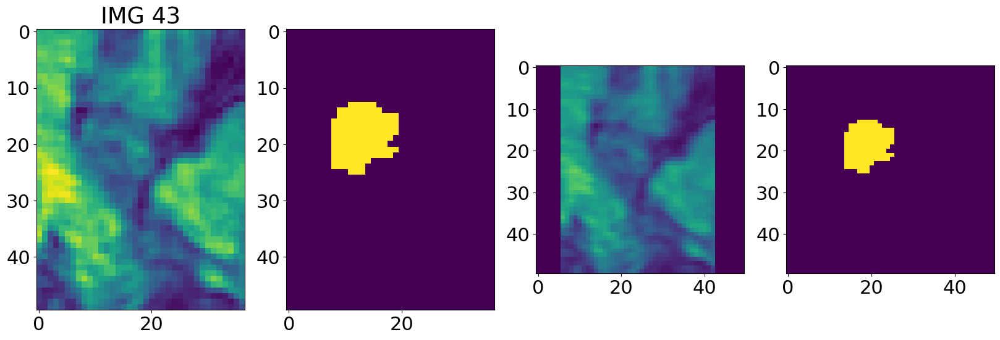

hippocampus_074
Padding value: 0.0
Normalizing intensities via 99 percentile
44 (50, 50, 42)


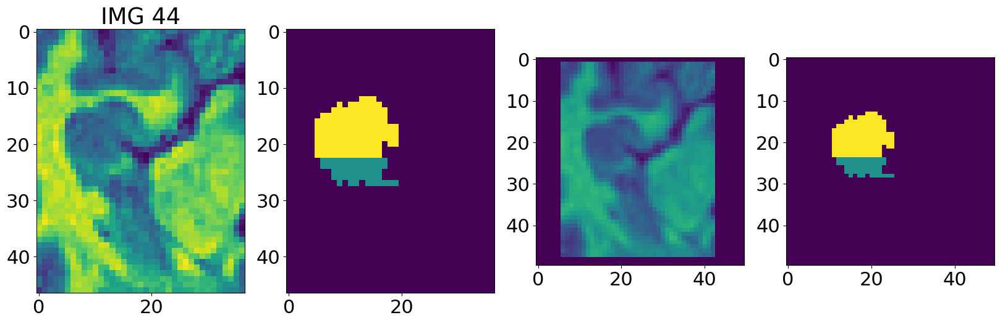

hippocampus_075
Padding value: 0.0
Normalizing intensities via 99 percentile
45 (50, 50, 41)


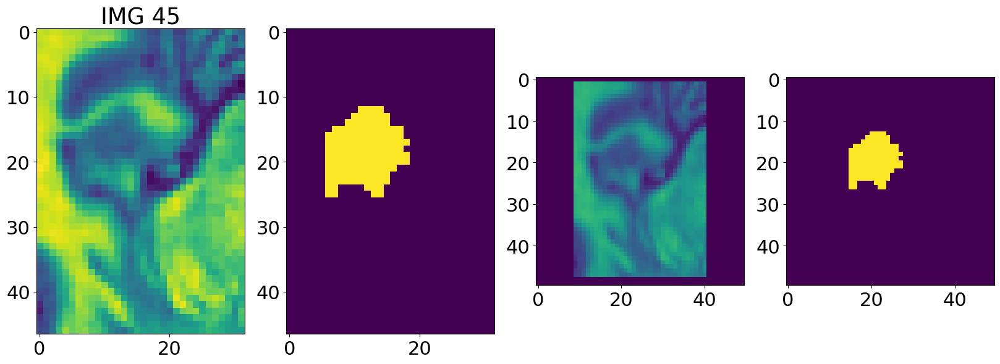

hippocampus_077
Padding value: 0.0
Normalizing intensities via 99 percentile
46 (50, 50, 45)


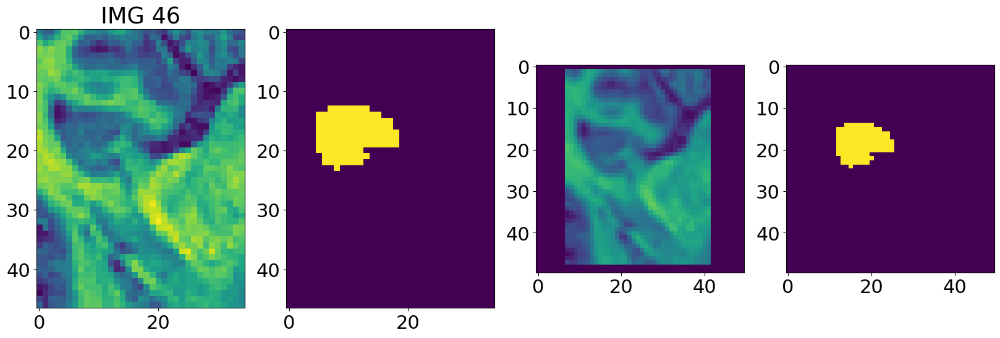

hippocampus_083
Padding value: 0.0
Normalizing intensities via 99 percentile
47 (50, 50, 37)


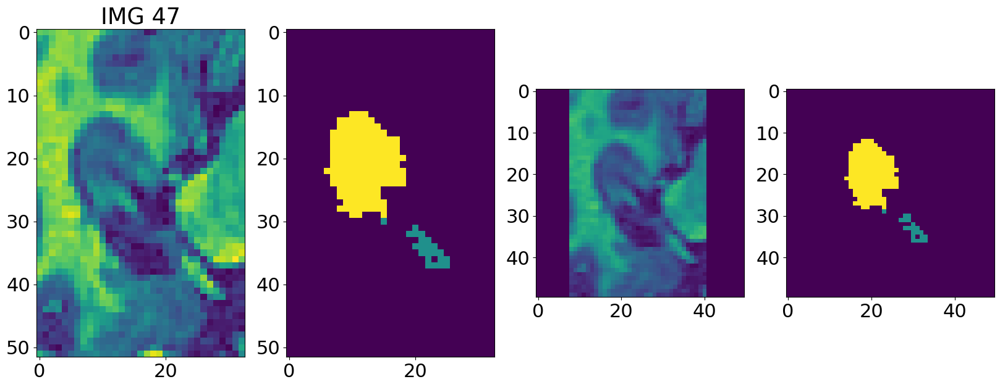

hippocampus_084
Padding value: 0.0
Normalizing intensities via 99 percentile
48 (50, 50, 37)


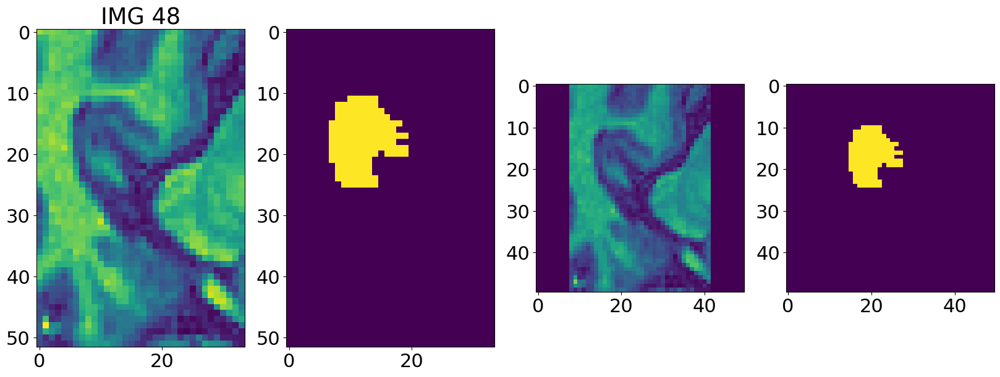

hippocampus_087
Padding value: 0.0
Normalizing intensities via 99 percentile
49 (50, 50, 32)


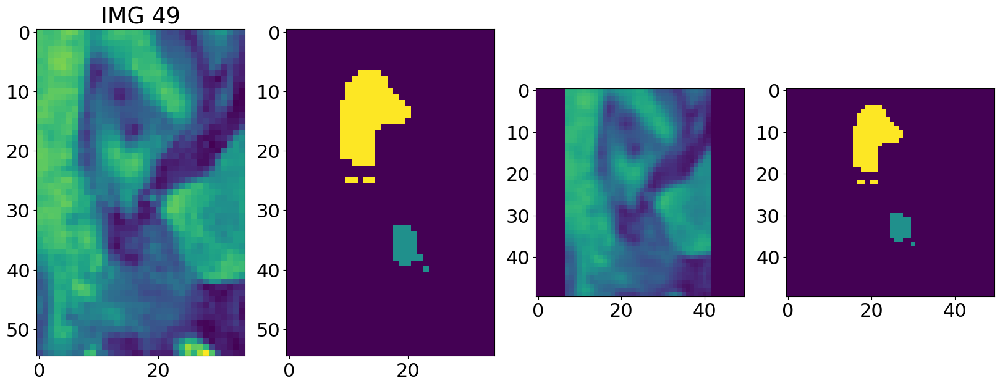

hippocampus_089
Padding value: 0.0
Normalizing intensities via 99 percentile
51 (50, 50, 38)


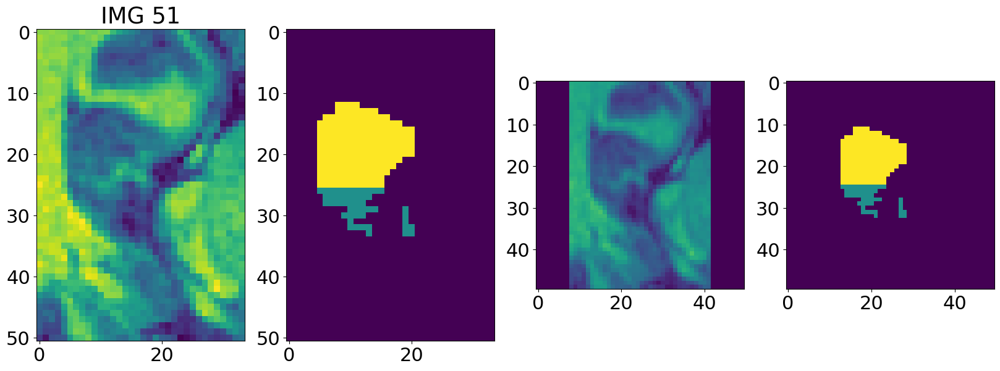

hippocampus_090
Padding value: 0.0
Normalizing intensities via 99 percentile
52 (50, 50, 40)


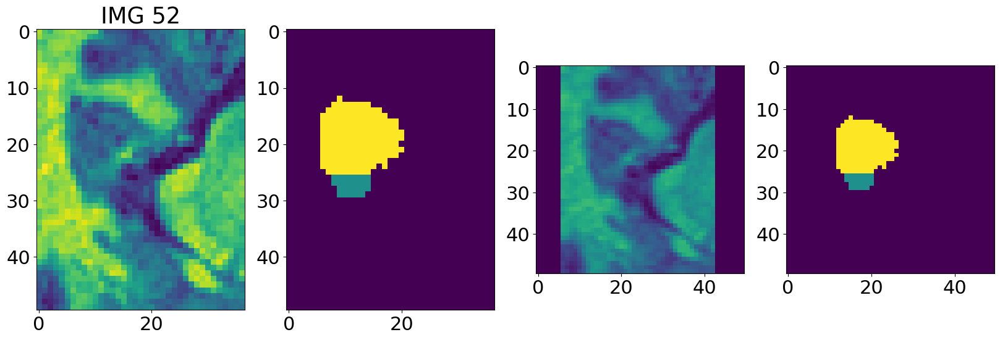

hippocampus_091
Padding value: 0.0
Normalizing intensities via 99 percentile
53 (50, 50, 29)


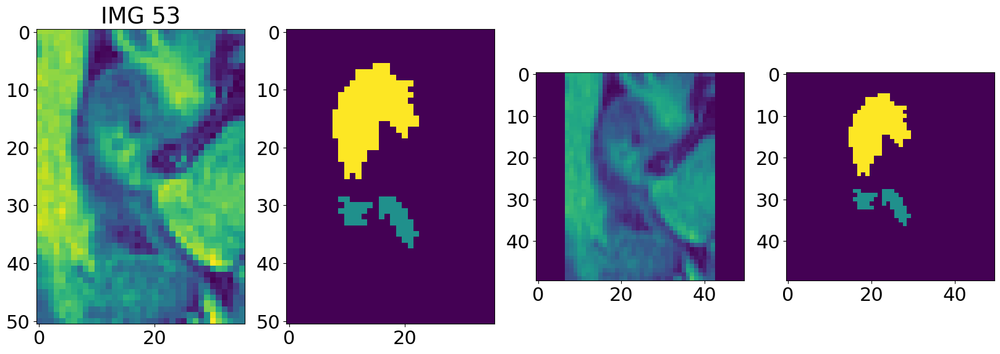

hippocampus_092
Padding value: 0.0
Normalizing intensities via 99 percentile
54 (50, 50, 28)


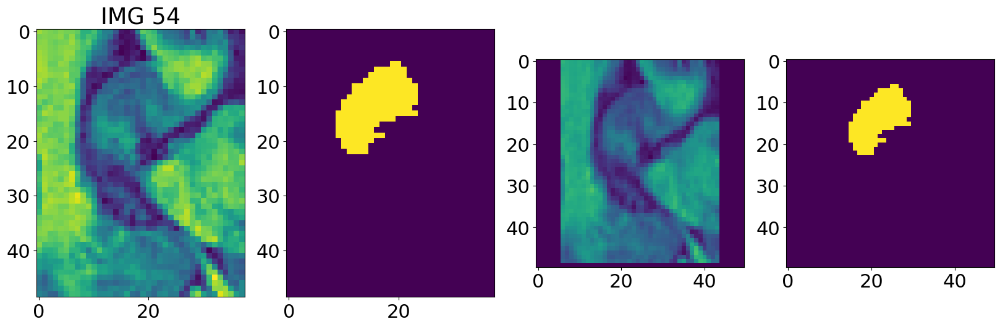

hippocampus_096
Padding value: 0.0
Normalizing intensities via 99 percentile
58 (50, 50, 39)


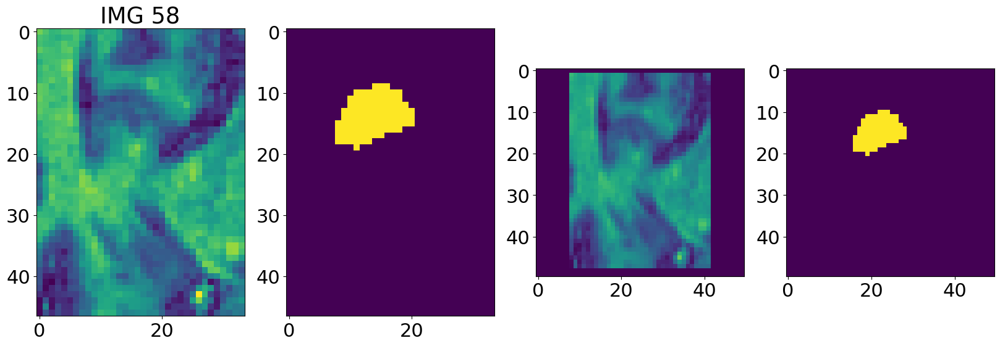

hippocampus_098
Padding value: 0.0
Normalizing intensities via 99 percentile
60 (50, 50, 34)


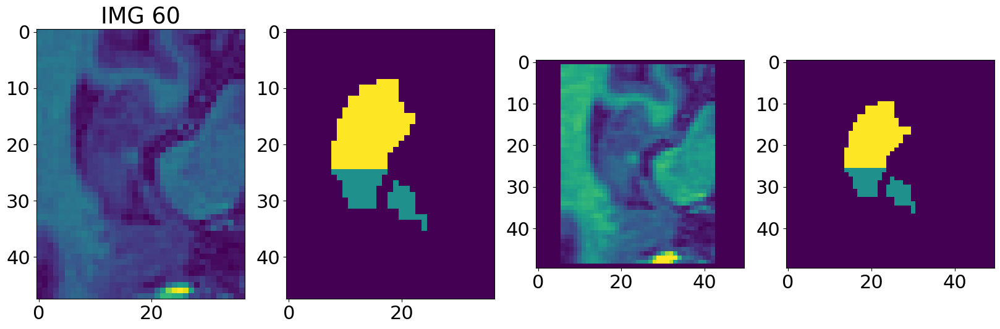

hippocampus_099
Padding value: 0.0
Normalizing intensities via 99 percentile
61 (50, 50, 27)


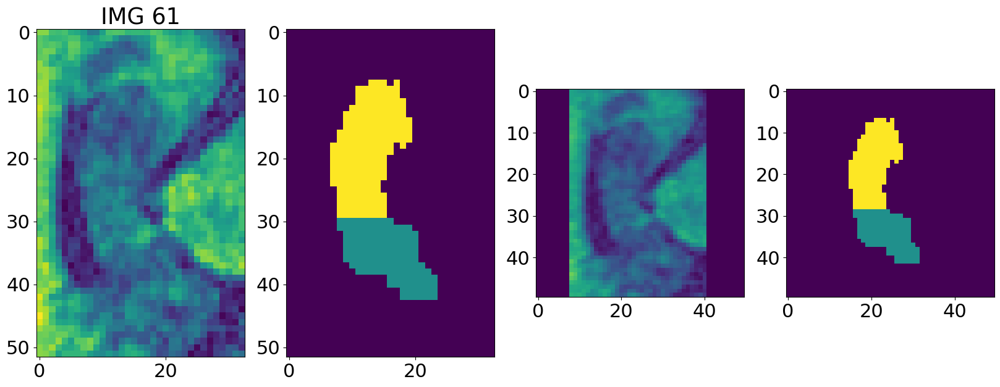

hippocampus_101
Padding value: 0.0
Normalizing intensities via 99 percentile
62 (50, 50, 32)


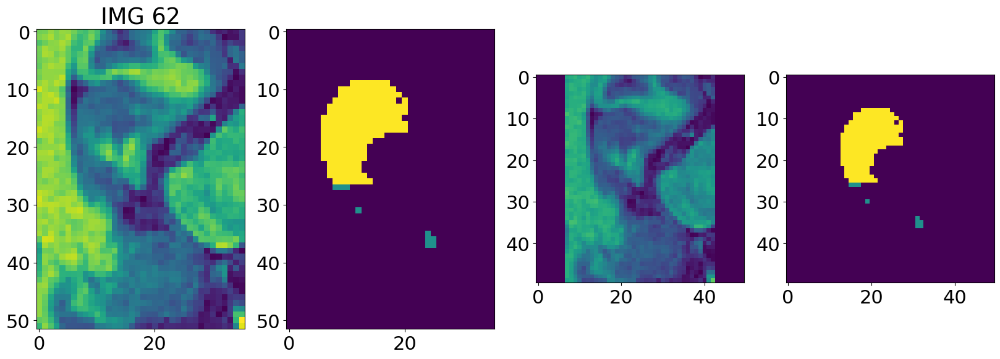

hippocampus_102
Padding value: 0.0
Normalizing intensities via 99 percentile
63 (50, 50, 32)


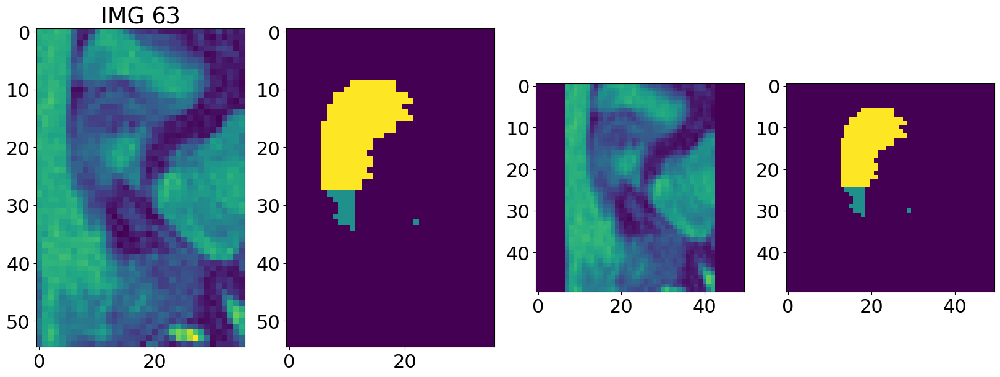

hippocampus_104
Padding value: 0.0
Normalizing intensities via 99 percentile
64 (50, 50, 39)


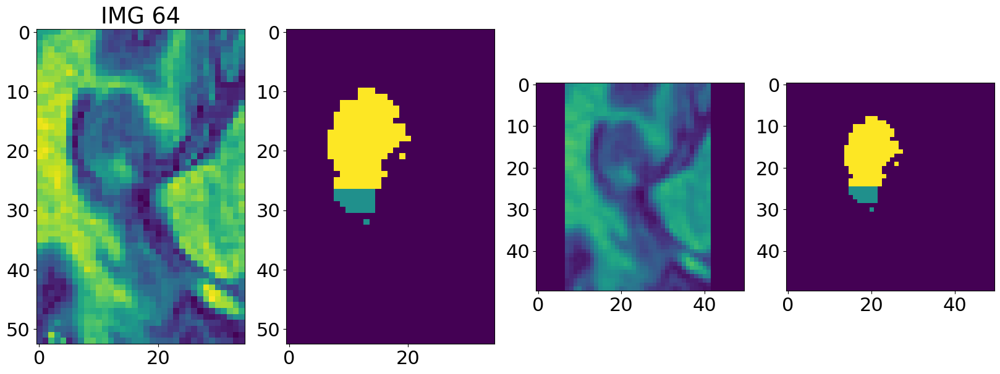

hippocampus_105
Padding value: 0.0
Normalizing intensities via 99 percentile
65 (50, 50, 37)


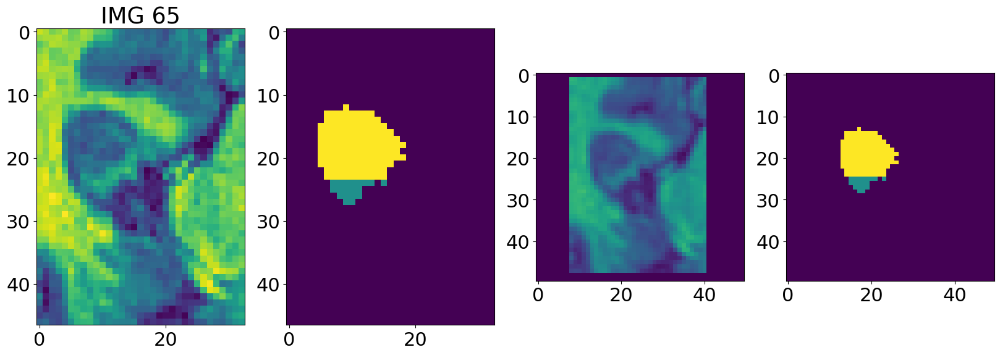

hippocampus_106
Padding value: 0.0
Normalizing intensities via 99 percentile
66 (50, 50, 38)


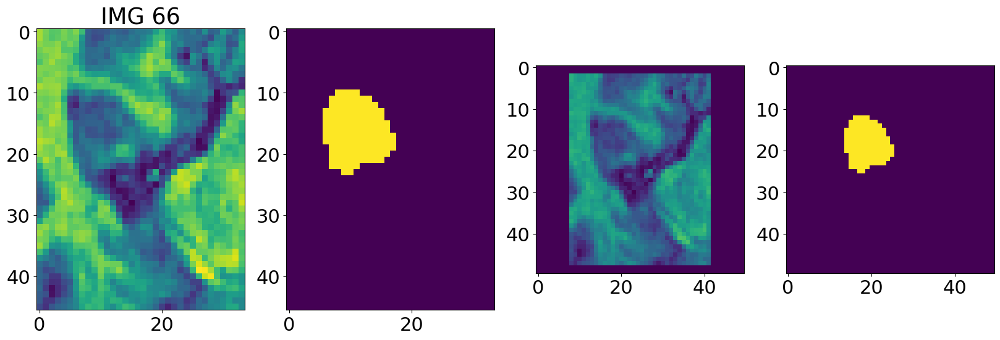

hippocampus_107
Padding value: 0.0
Normalizing intensities via 99 percentile
67 (50, 50, 34)


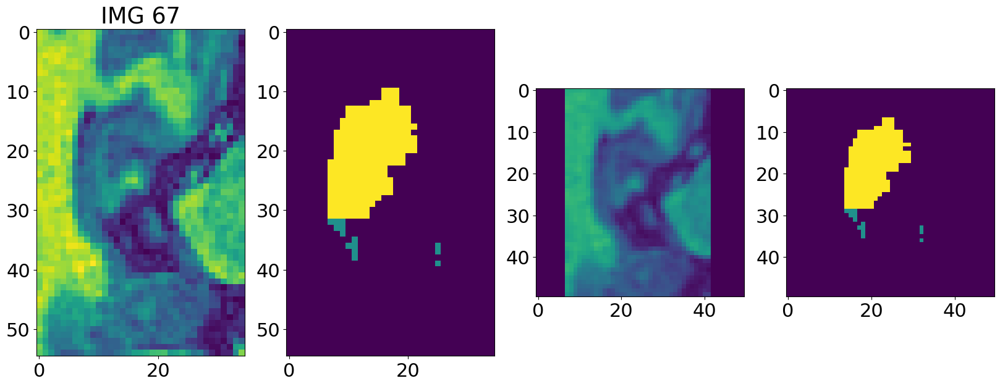

hippocampus_108
Padding value: 0.0
Normalizing intensities via 99 percentile
68 (50, 50, 37)


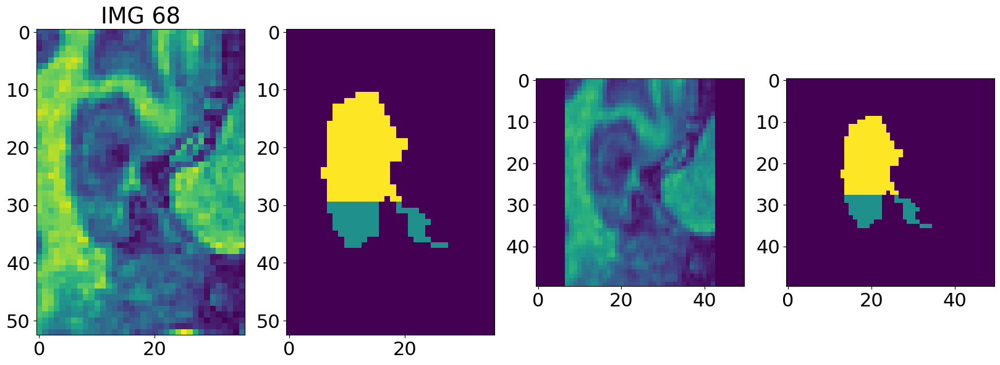

hippocampus_109
Padding value: 0.0
Normalizing intensities via 99 percentile
69 (50, 50, 36)


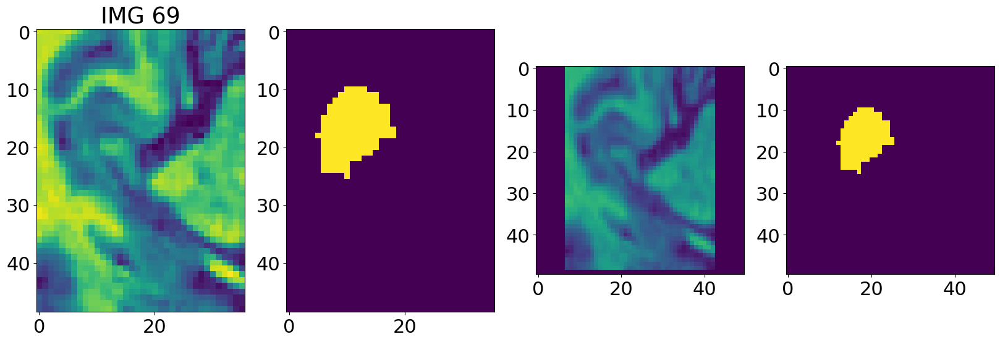

hippocampus_114
Padding value: 0.0
Normalizing intensities via 99 percentile
70 (50, 50, 39)


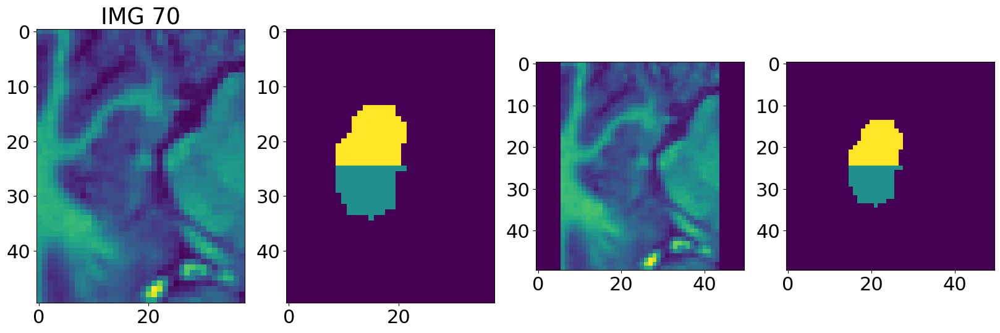

hippocampus_124
Padding value: 0.0
Normalizing intensities via 99 percentile
72 (50, 50, 41)


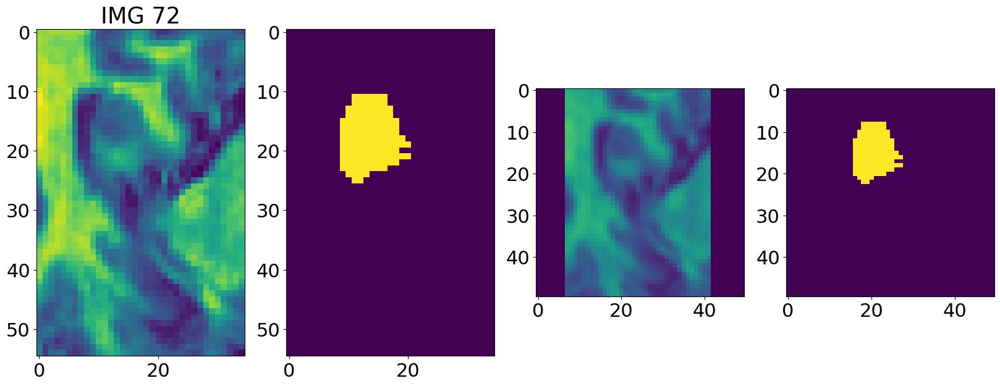

hippocampus_125
Padding value: 0.0
Normalizing intensities via 99 percentile
73 (50, 50, 39)


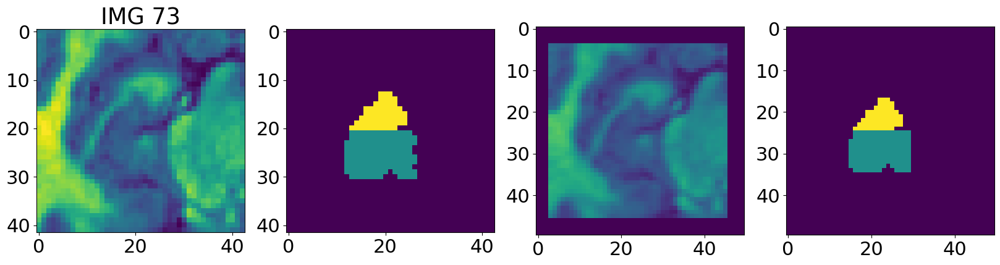

hippocampus_126
Padding value: 0.0
Normalizing intensities via 99 percentile
74 (50, 50, 43)


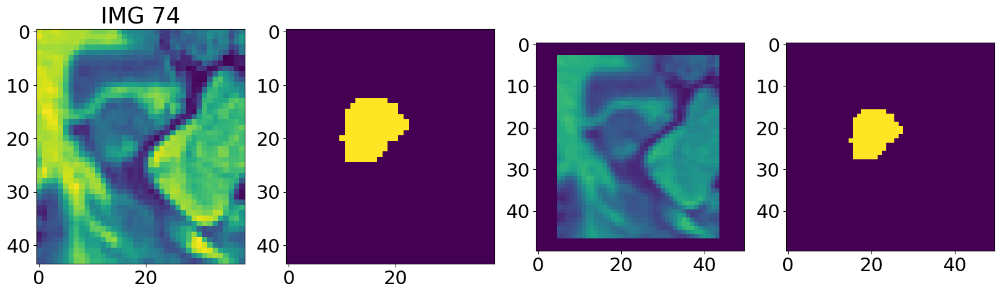

hippocampus_127
Padding value: 0.0
Normalizing intensities via 99 percentile
75 (50, 50, 31)


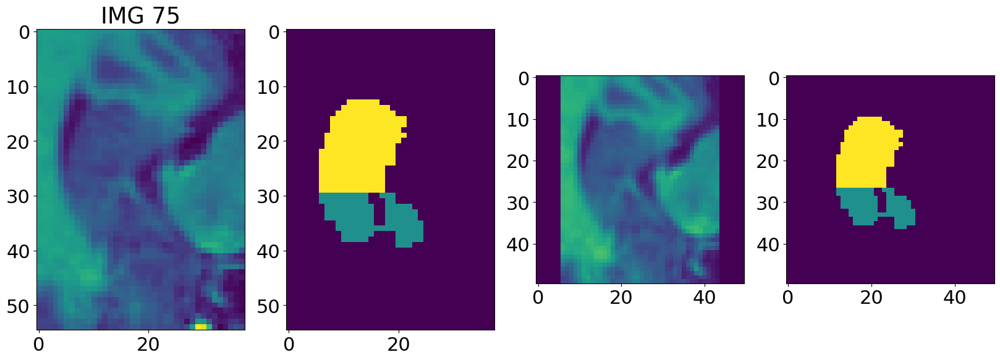

hippocampus_130
Padding value: 0.0
Normalizing intensities via 99 percentile
76 (50, 50, 40)


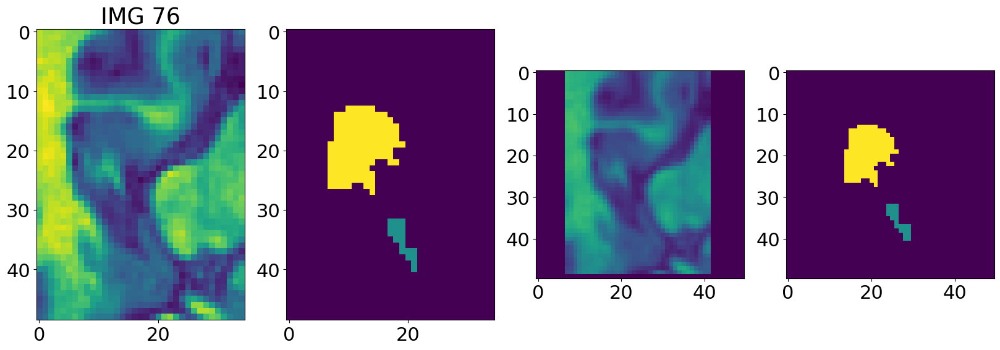

hippocampus_132
Padding value: 0.0
Normalizing intensities via 99 percentile
77 (50, 50, 40)


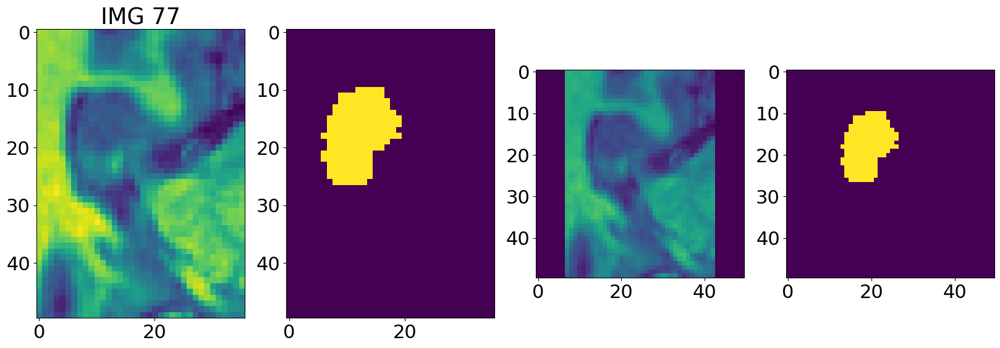

hippocampus_133
Padding value: 0.0
Normalizing intensities via 99 percentile
78 (50, 50, 42)


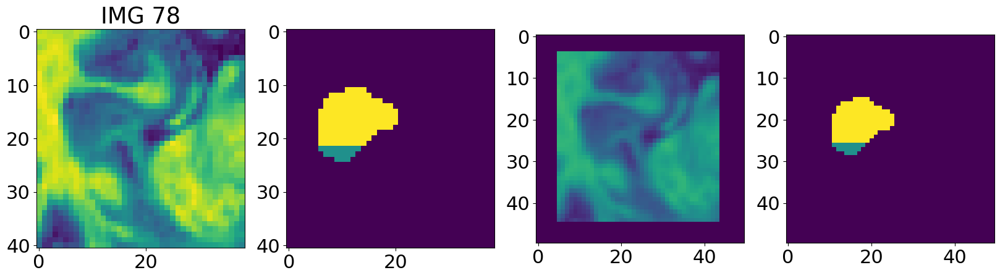

hippocampus_135
Padding value: 0.0
Normalizing intensities via 99 percentile
79 (50, 50, 38)


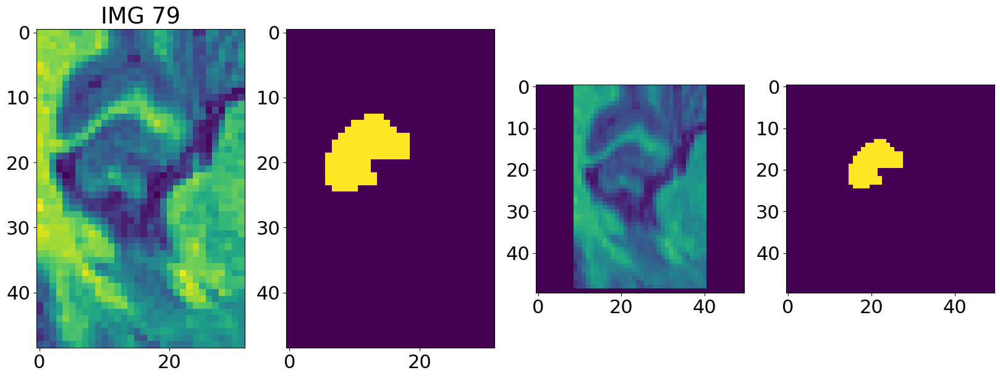

hippocampus_136
Padding value: 0.0
Normalizing intensities via 99 percentile
80 (50, 50, 41)


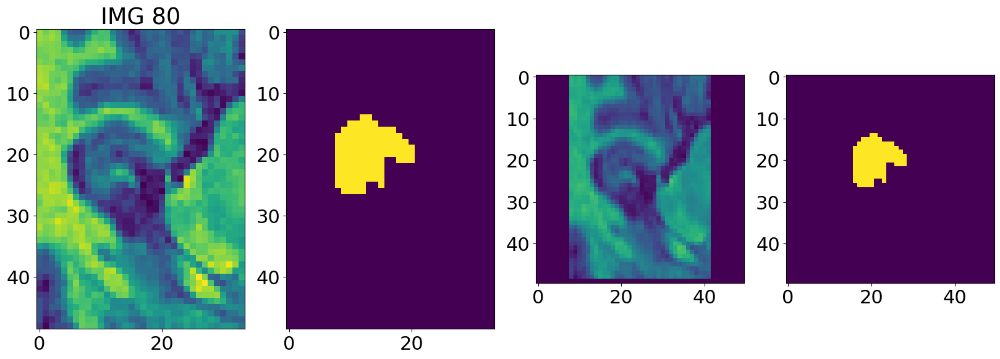

hippocampus_138
Padding value: 0.0
Normalizing intensities via 99 percentile
81 (50, 50, 42)


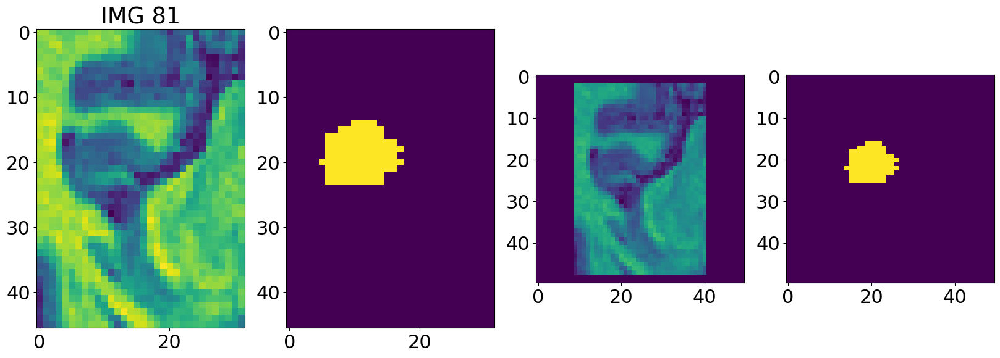

hippocampus_141
Padding value: 0.0
Normalizing intensities via 99 percentile
82 (50, 50, 42)


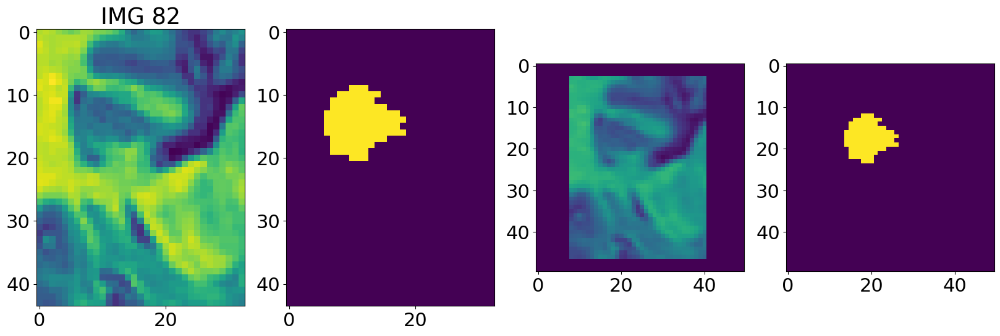

hippocampus_142
Padding value: 0.0
Normalizing intensities via 99 percentile
83 (50, 50, 41)


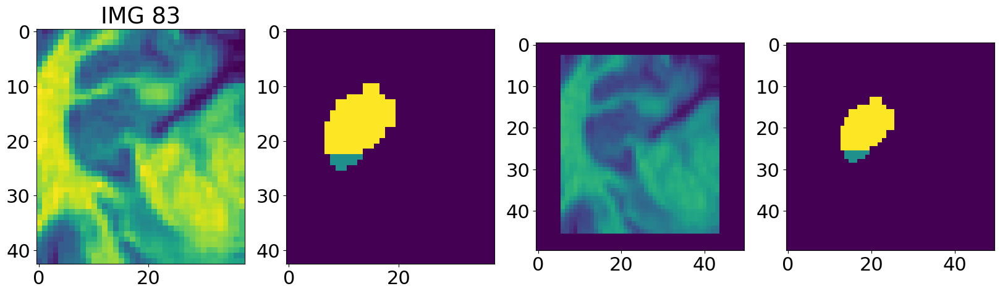

hippocampus_143
Padding value: 0.0
Normalizing intensities via 99 percentile
84 (50, 50, 41)


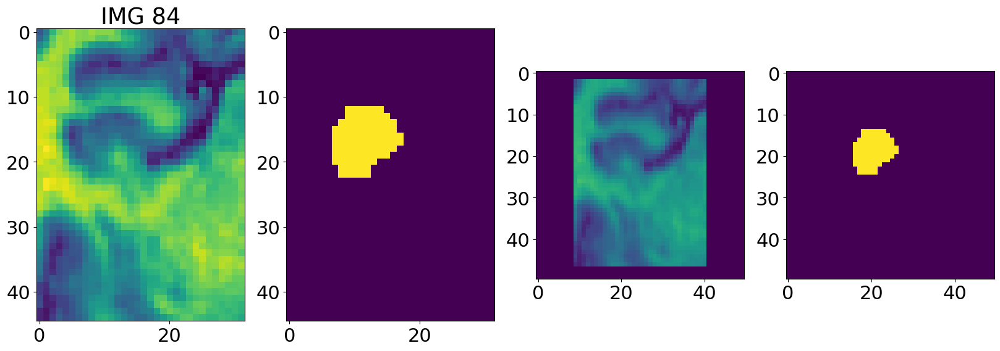

hippocampus_144
Padding value: 0.0
Normalizing intensities via 99 percentile
85 (50, 50, 43)


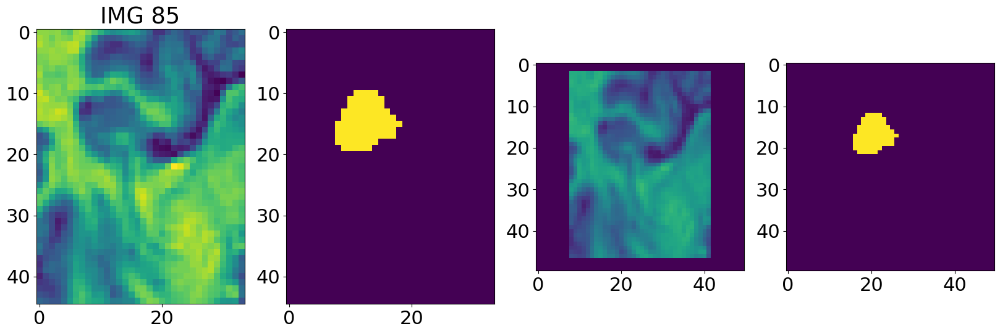

hippocampus_148
Padding value: 0.0
Normalizing intensities via 99 percentile
88 (50, 50, 32)


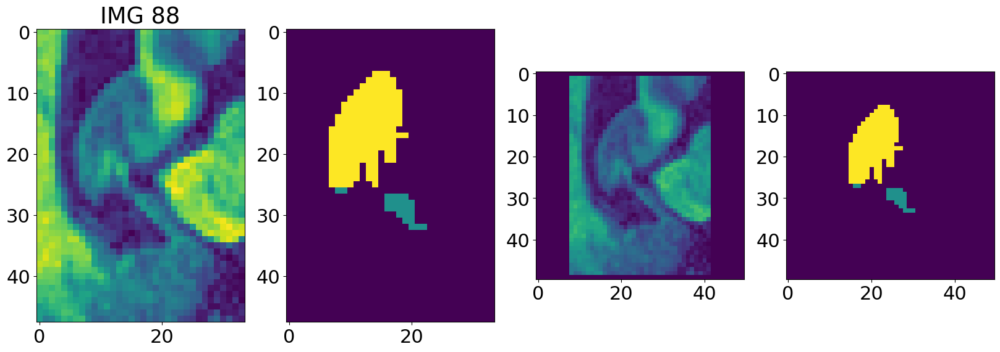

hippocampus_149
Padding value: 0.0
Normalizing intensities via 99 percentile
89 (50, 50, 32)


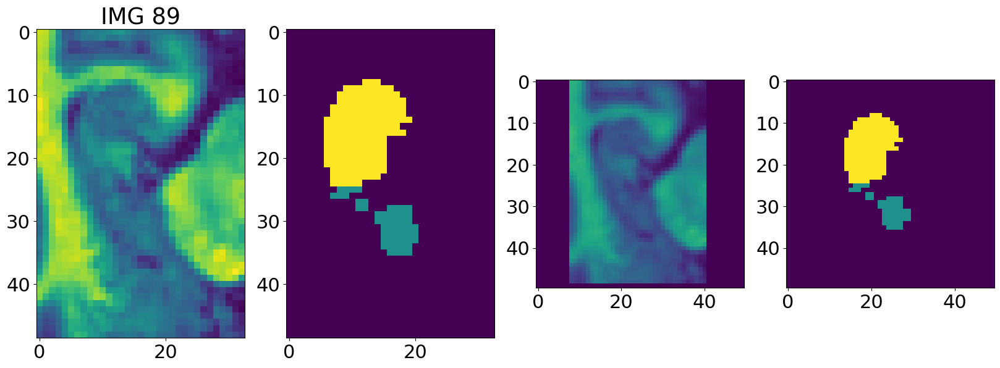

hippocampus_150
Padding value: 0.0
Normalizing intensities via 99 percentile
90 (50, 50, 34)


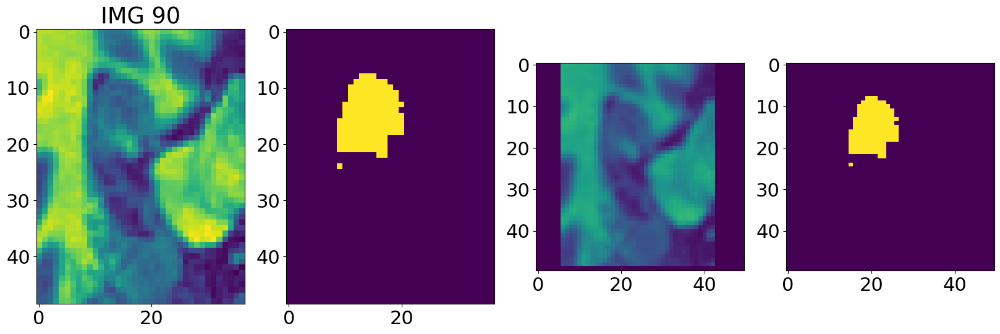

hippocampus_152
Padding value: 0.0
Normalizing intensities via 99 percentile
91 (50, 50, 37)


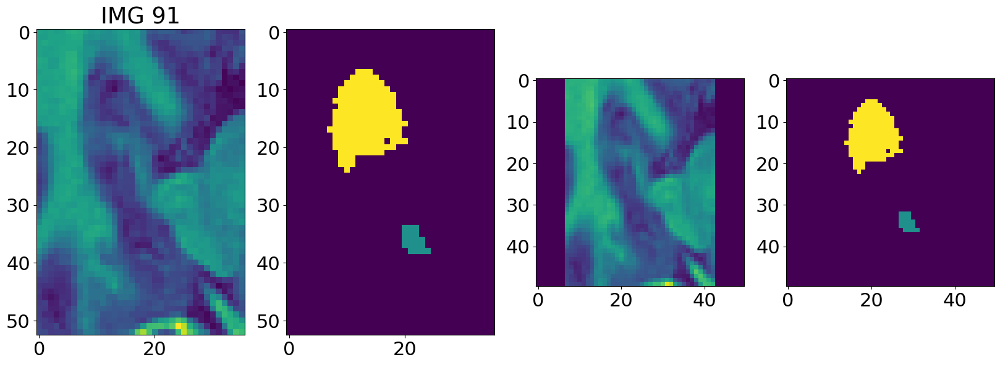

hippocampus_154
Padding value: 0.0
Normalizing intensities via 99 percentile
92 (50, 50, 42)


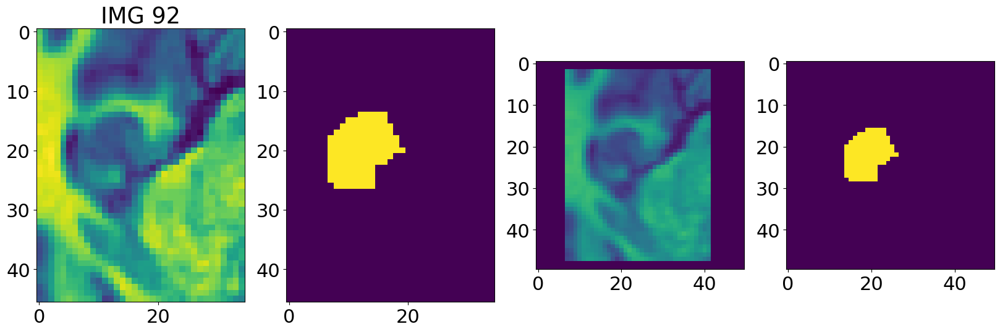

hippocampus_155
Padding value: 0.0
Normalizing intensities via 99 percentile
93 (50, 50, 37)


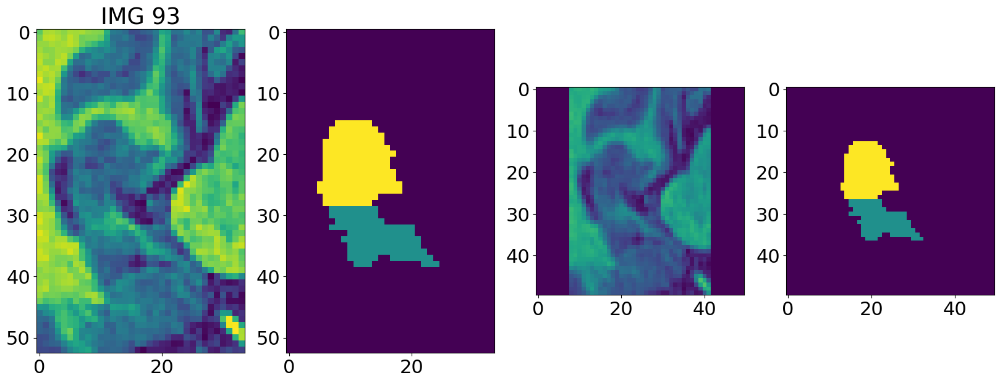

hippocampus_156
Padding value: 0.0
Normalizing intensities via 99 percentile
94 (50, 50, 36)


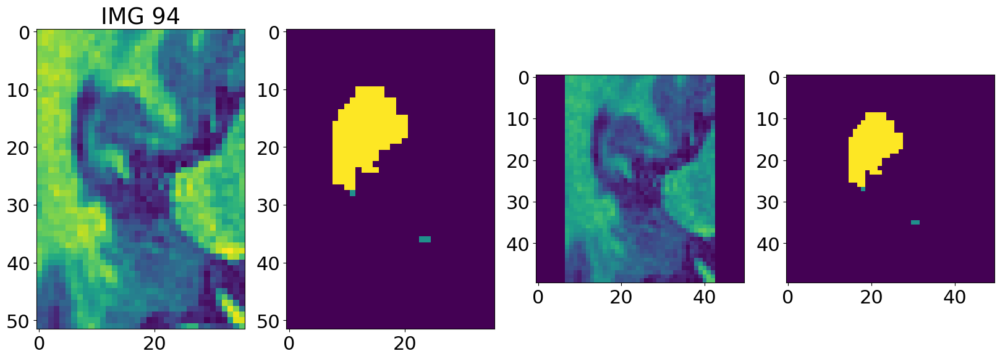

hippocampus_157
Padding value: 0.0
Normalizing intensities via 99 percentile
95 (50, 50, 35)


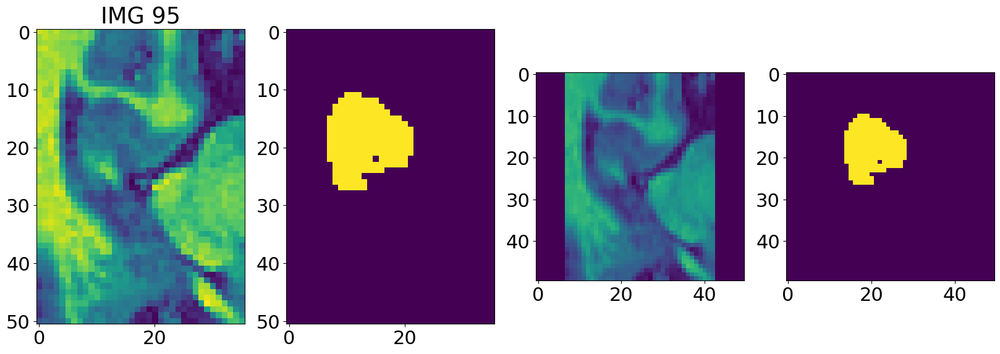

hippocampus_158
Padding value: 0.0
Normalizing intensities via 99 percentile
96 (50, 50, 36)


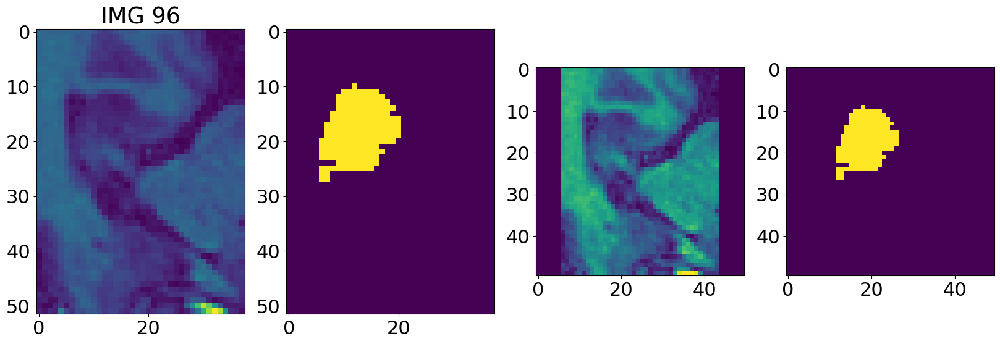

hippocampus_160
Padding value: 0.0
Normalizing intensities via 99 percentile
97 (50, 50, 26)


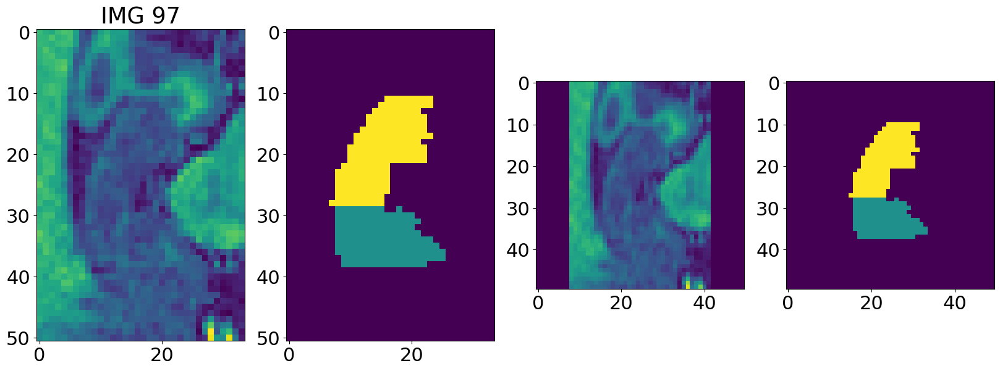

hippocampus_161
Padding value: 0.0
Normalizing intensities via 99 percentile
98 (50, 50, 36)


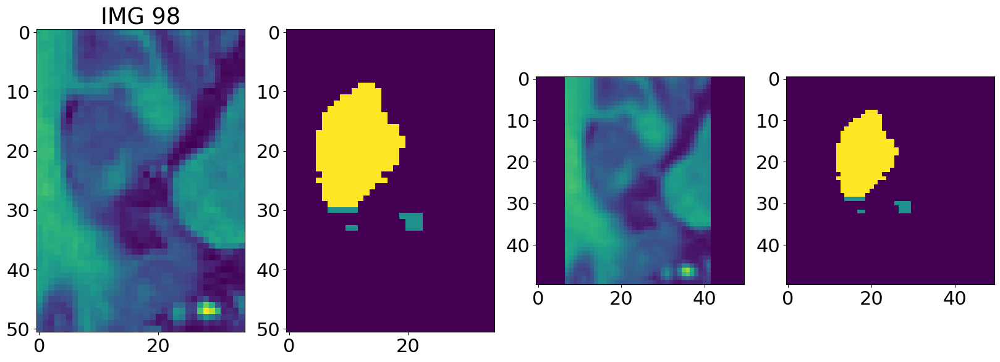

hippocampus_162
Padding value: 0.0
Normalizing intensities via 99 percentile
99 (50, 50, 37)


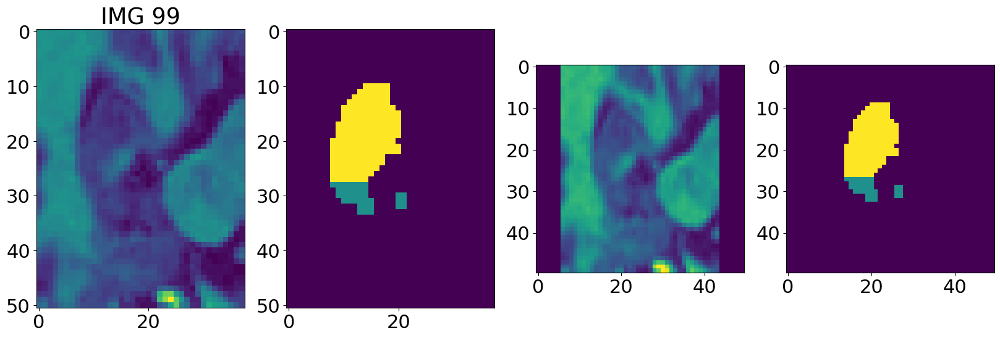

hippocampus_163
Padding value: 0.0
Normalizing intensities via 99 percentile
100 (50, 50, 44)


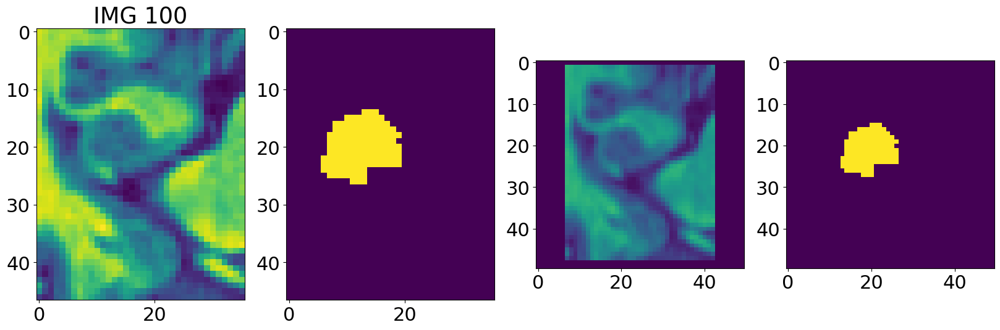

hippocampus_164
Padding value: 0.0
Normalizing intensities via 99 percentile
101 (50, 50, 47)


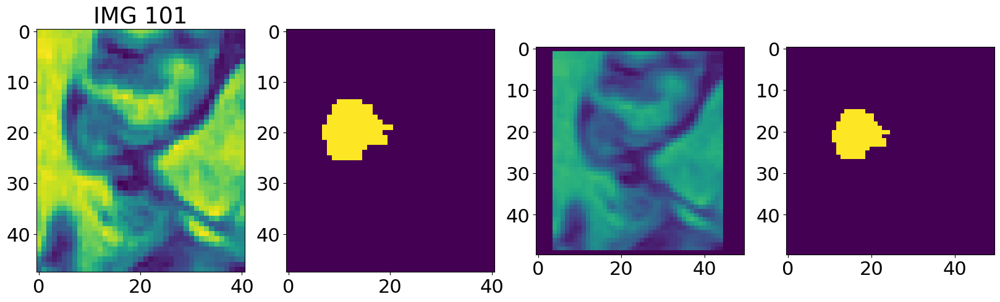

hippocampus_165
Padding value: 0.0
Normalizing intensities via 99 percentile
102 (50, 50, 29)


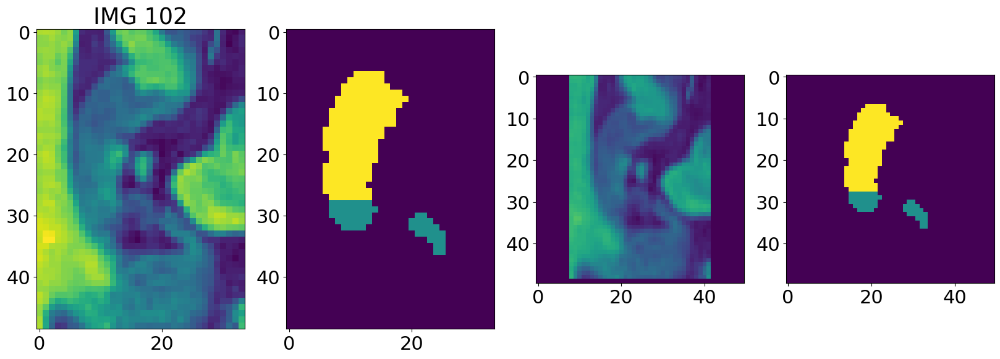

hippocampus_166
Padding value: 0.0
Normalizing intensities via 99 percentile
103 (50, 50, 31)


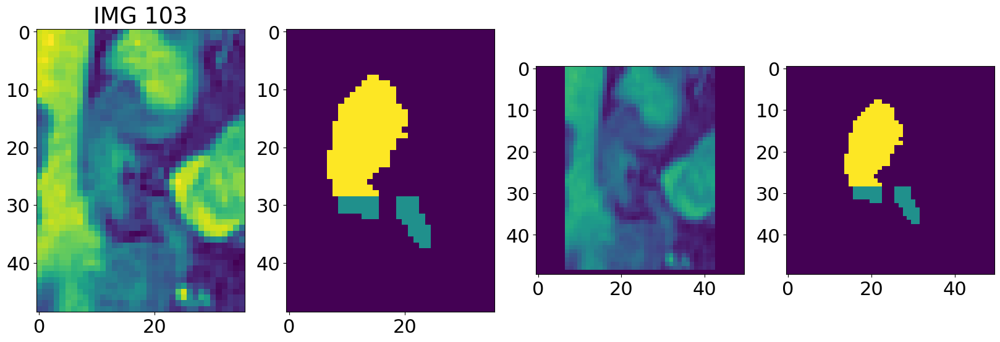

hippocampus_169
Padding value: 0.0
Normalizing intensities via 99 percentile
104 (50, 50, 39)


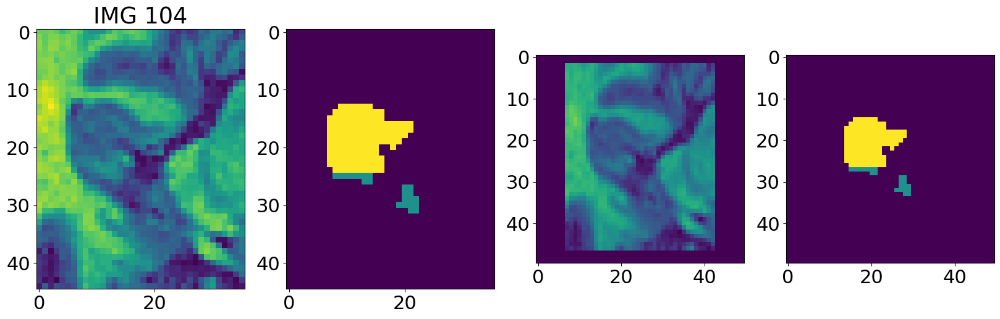

hippocampus_170
Padding value: 0.0
Normalizing intensities via 99 percentile
105 (50, 50, 40)


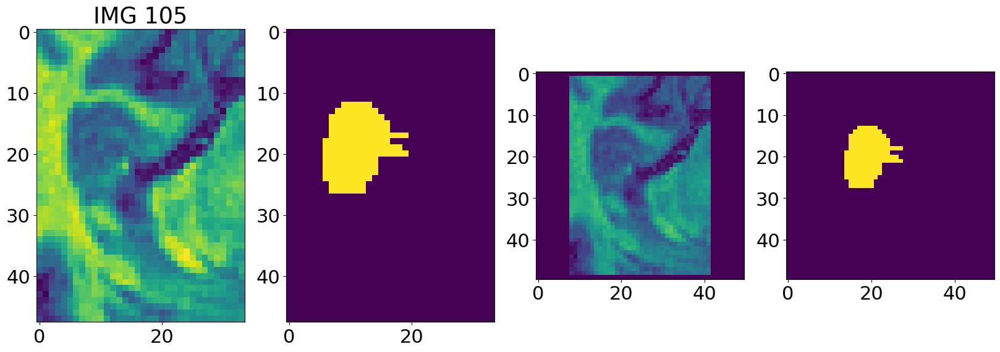

hippocampus_171
Padding value: 0.0
Normalizing intensities via 99 percentile
106 (50, 50, 28)


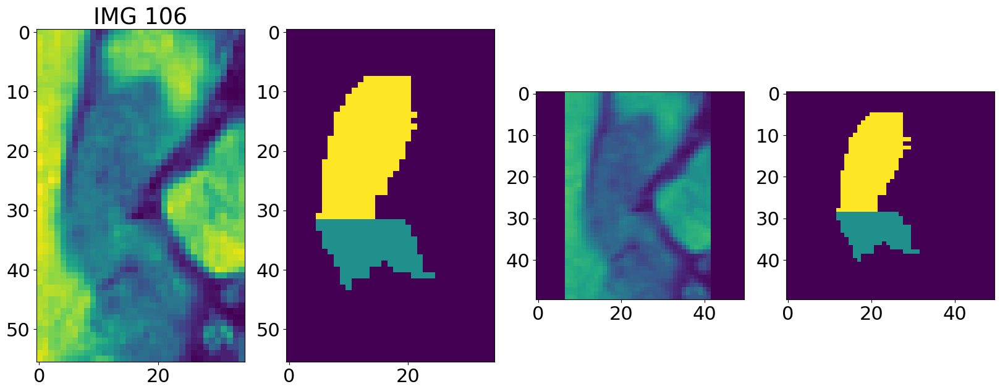

hippocampus_174
Padding value: 0.0
Normalizing intensities via 99 percentile
109 (50, 50, 34)


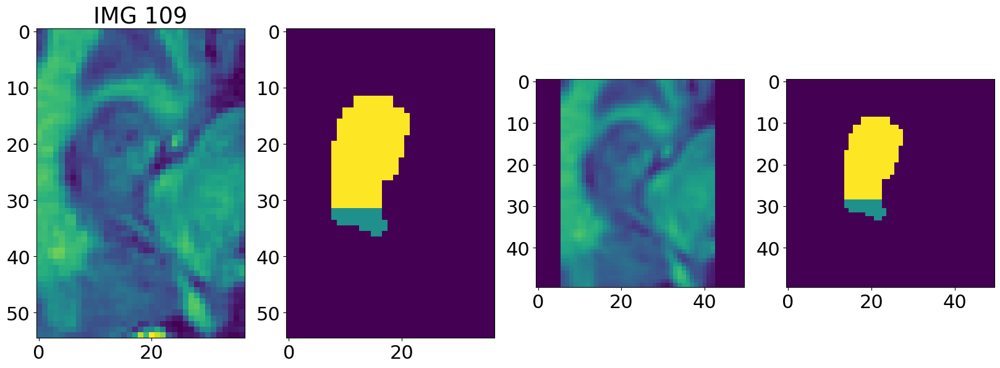

hippocampus_175
Padding value: 0.0
Normalizing intensities via 99 percentile
110 (50, 50, 35)


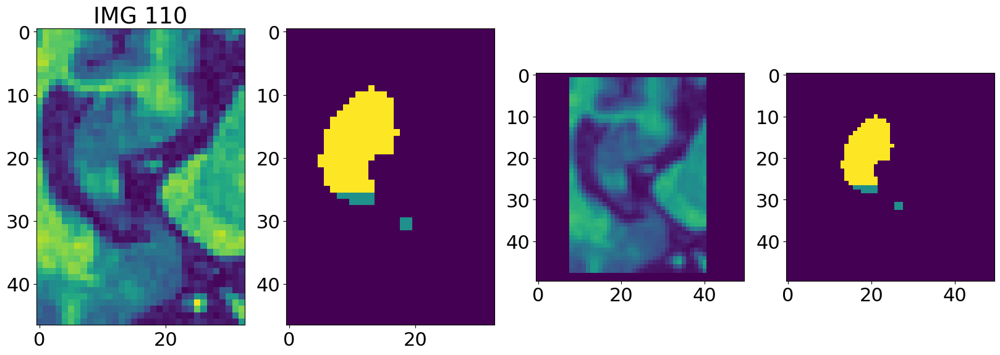

hippocampus_176
Padding value: 0.0
Normalizing intensities via 99 percentile
111 (50, 50, 36)


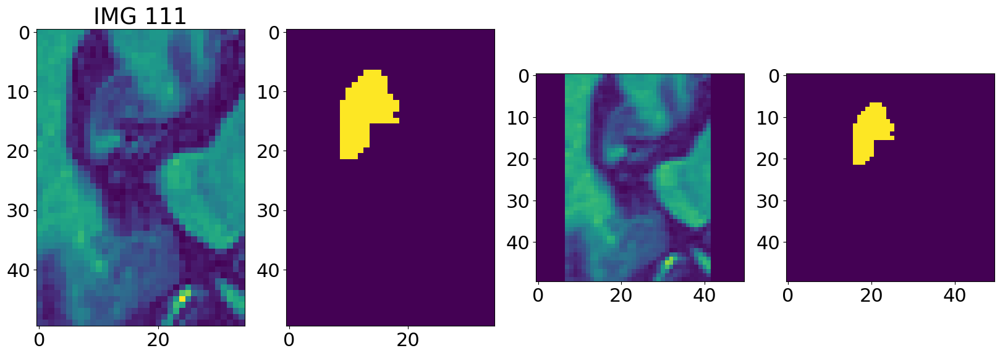

hippocampus_177
Padding value: 0.0
Normalizing intensities via 99 percentile
112 (50, 50, 40)


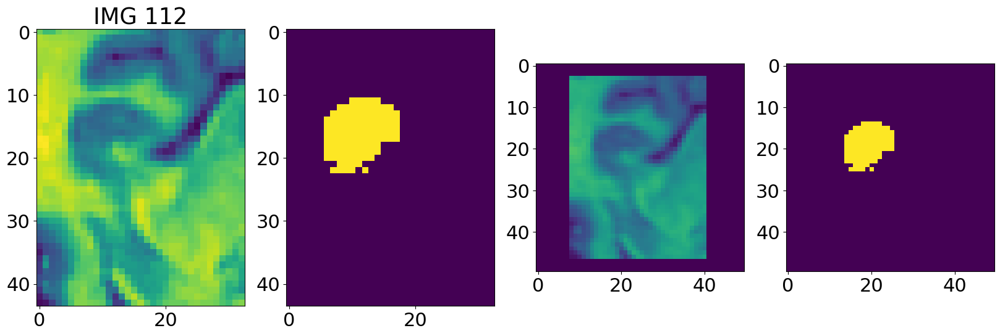

hippocampus_178
Padding value: 0.0
Normalizing intensities via 99 percentile
113 (50, 50, 41)


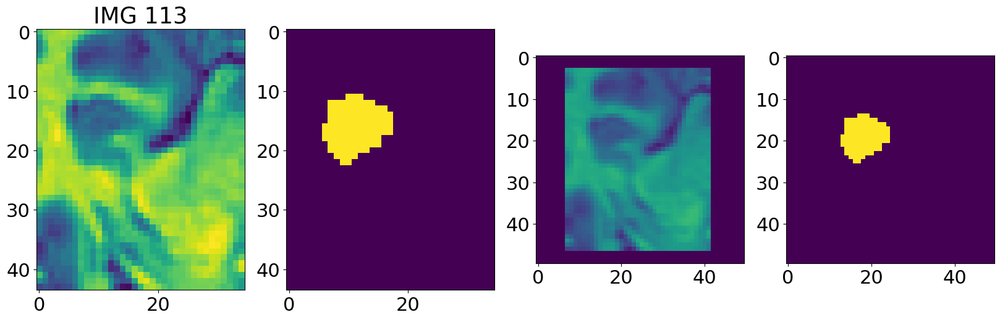

hippocampus_181
Padding value: 0.0
Normalizing intensities via 99 percentile
115 (50, 50, 40)


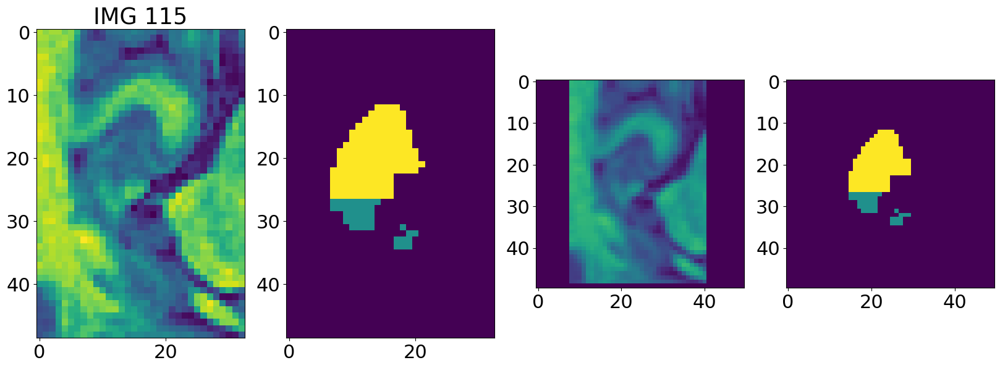

hippocampus_184
Padding value: 0.0
Normalizing intensities via 99 percentile
116 (50, 50, 33)


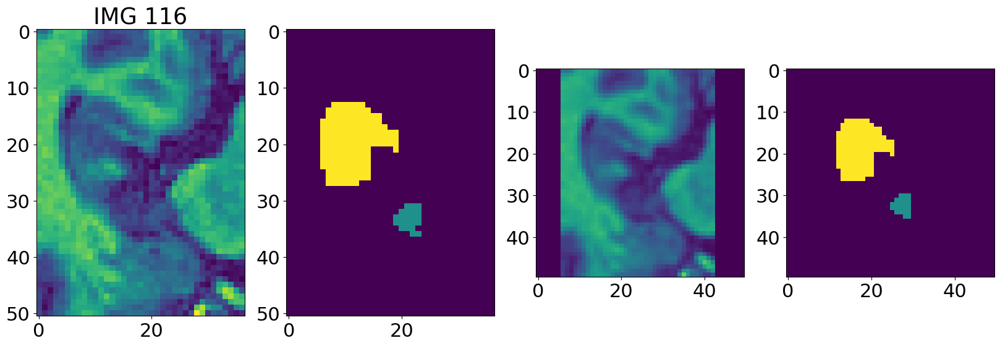

hippocampus_185
Padding value: 0.0
Normalizing intensities via 99 percentile
117 (50, 50, 33)


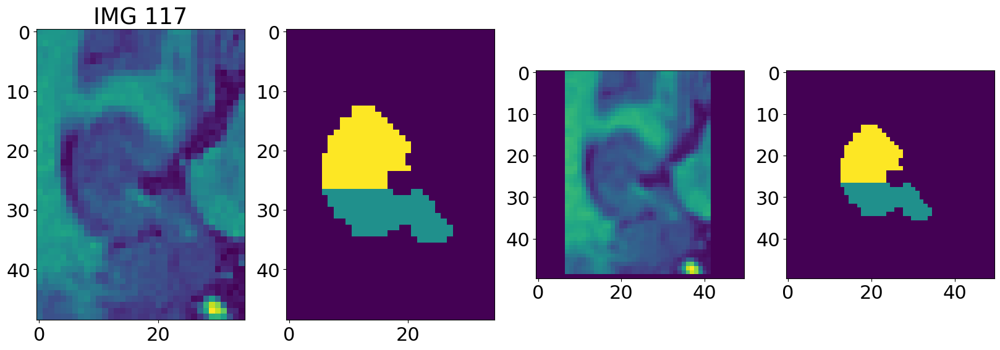

hippocampus_188
Padding value: 0.0
Normalizing intensities via 99 percentile
118 (50, 50, 36)


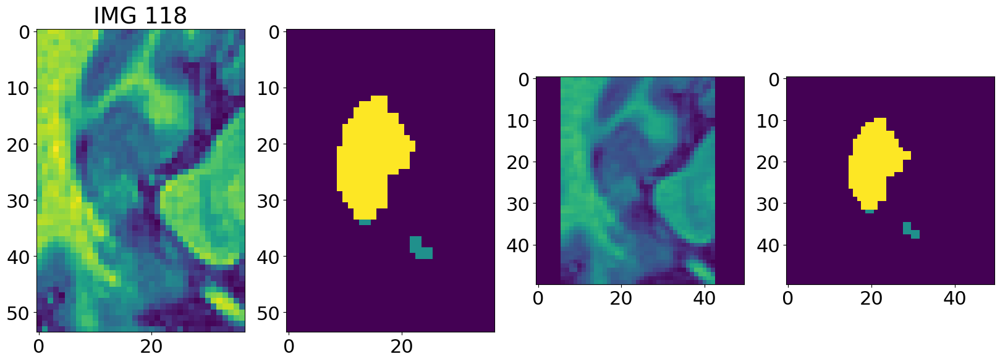

hippocampus_189
Padding value: 0.0
Normalizing intensities via 99 percentile
119 (50, 50, 30)


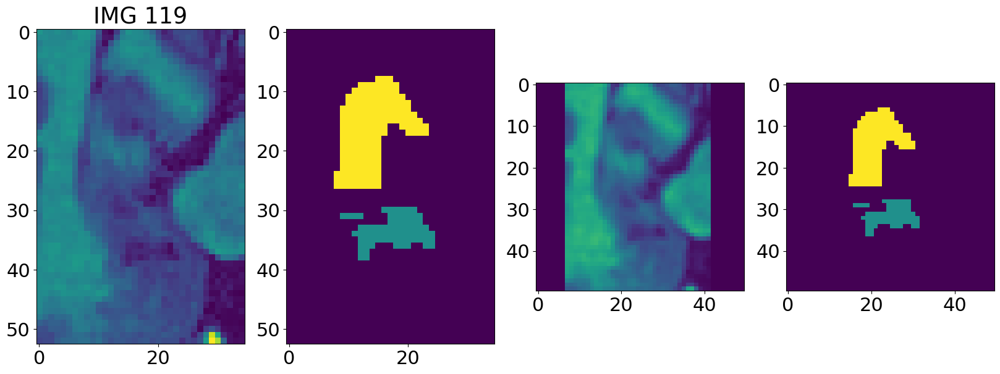

hippocampus_190
Padding value: 0.0
Normalizing intensities via 99 percentile
120 (50, 50, 30)


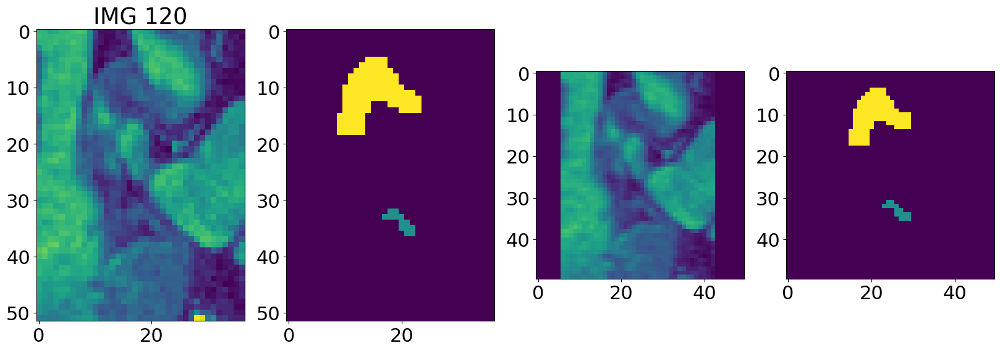

hippocampus_193
Padding value: 0.0
Normalizing intensities via 99 percentile
121 (50, 50, 29)


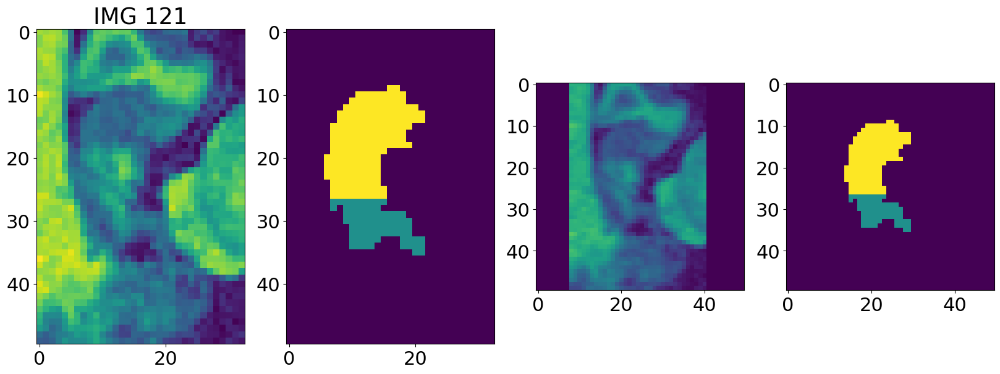

hippocampus_194
Padding value: 0.0
Normalizing intensities via 99 percentile
122 (50, 50, 30)


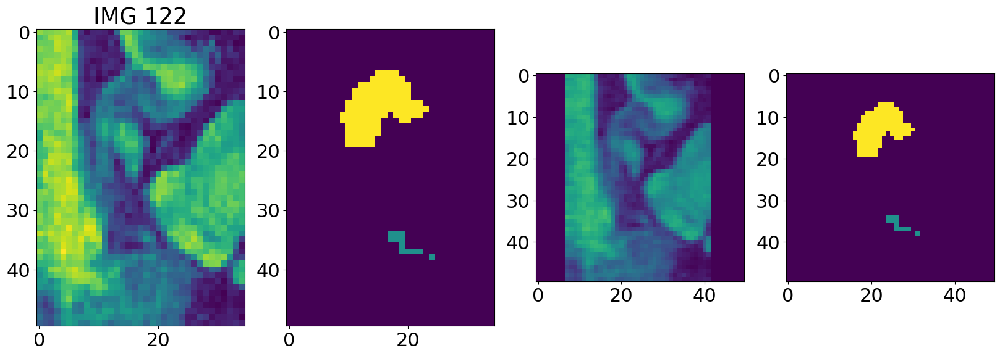

hippocampus_195
Padding value: 0.0
Normalizing intensities via 99 percentile
123 (50, 50, 28)


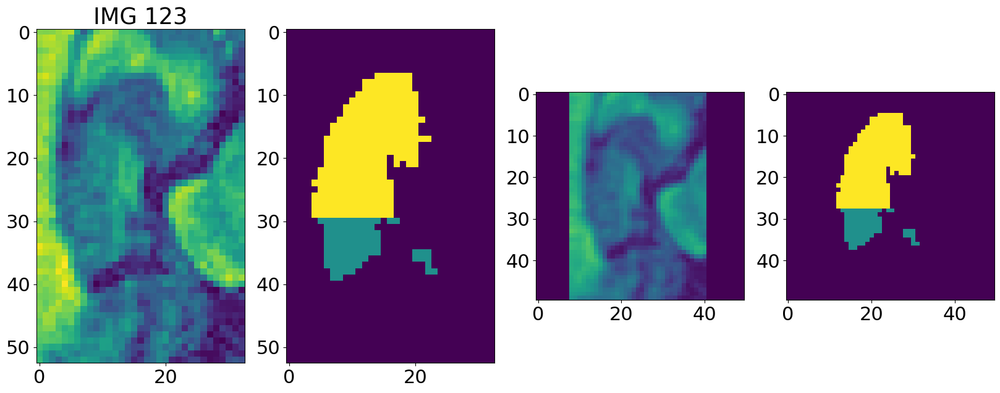

hippocampus_197
Padding value: 0.0
Normalizing intensities via 99 percentile
124 (50, 50, 31)


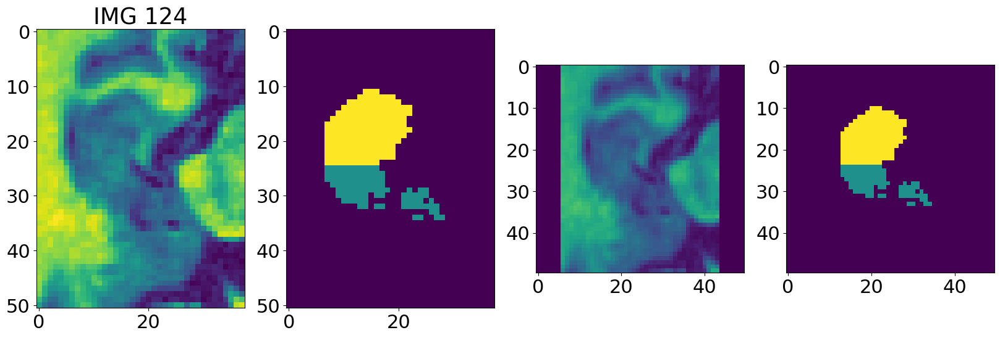

hippocampus_203
Padding value: 0.0
Normalizing intensities via 99 percentile
126 (50, 50, 38)


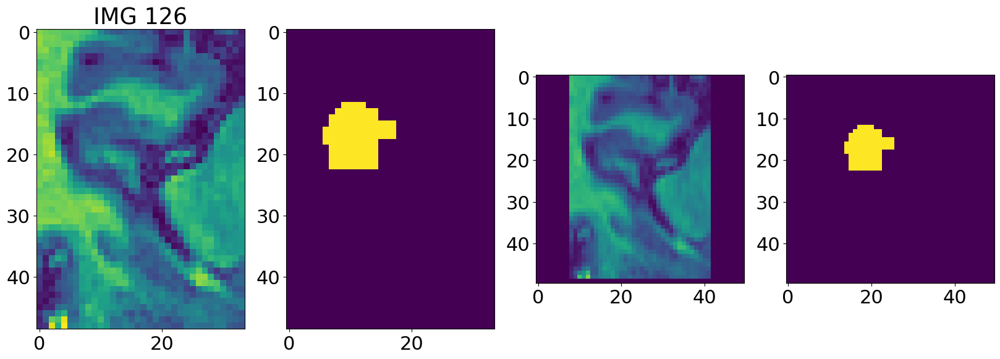

hippocampus_204
Padding value: 0.0
Normalizing intensities via 99 percentile
127 (50, 50, 39)


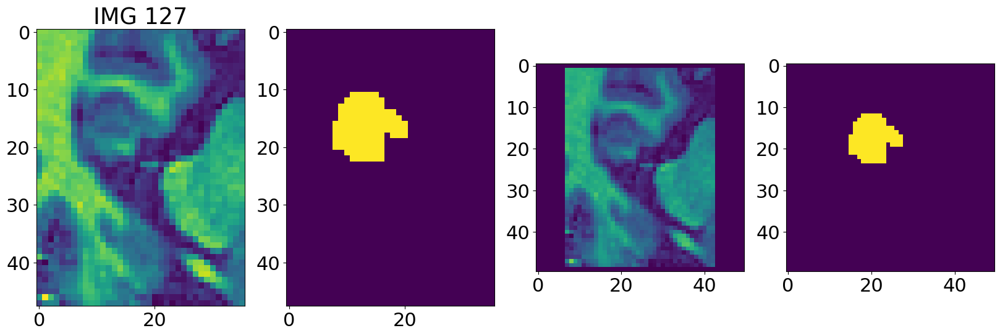

hippocampus_205
Padding value: 0.0
Normalizing intensities via 99 percentile
128 (50, 50, 32)


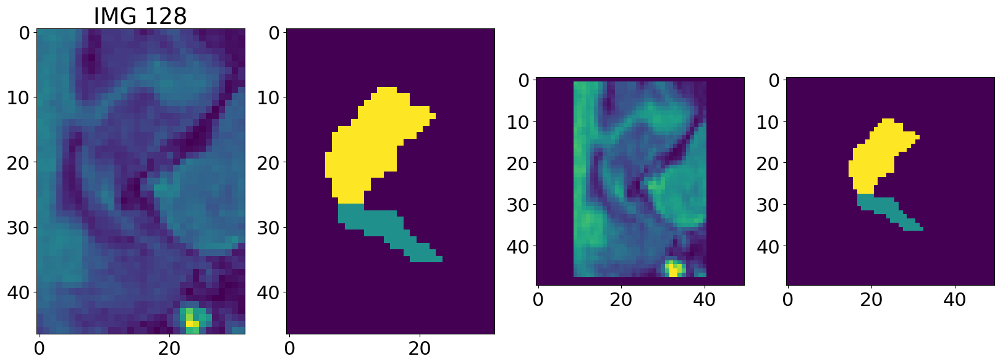

hippocampus_210
Padding value: 0.0
Normalizing intensities via 99 percentile
130 (50, 50, 40)


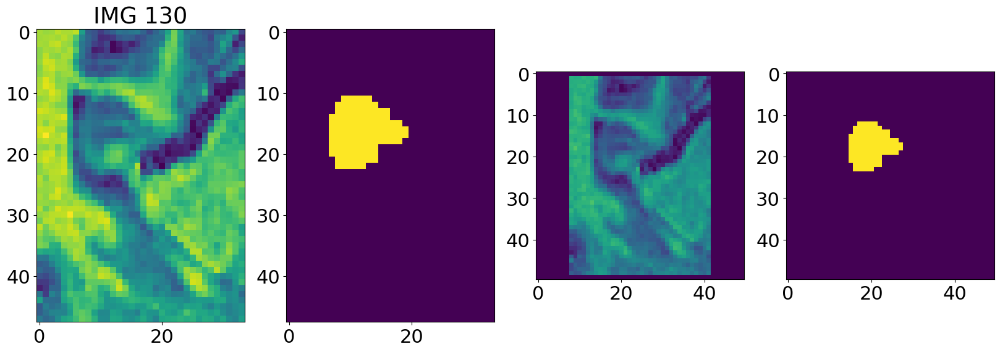

hippocampus_212
Padding value: 0.0
Normalizing intensities via 99 percentile
131 (50, 50, 34)


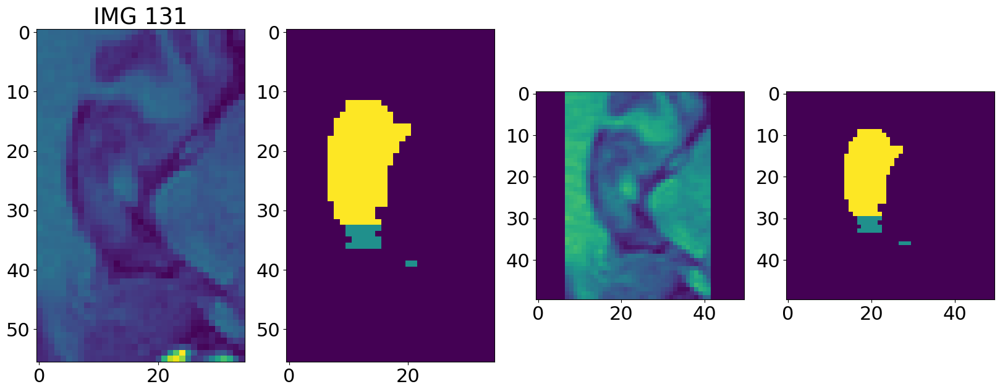

hippocampus_215
Padding value: 0.0
Normalizing intensities via 99 percentile
132 (50, 50, 33)


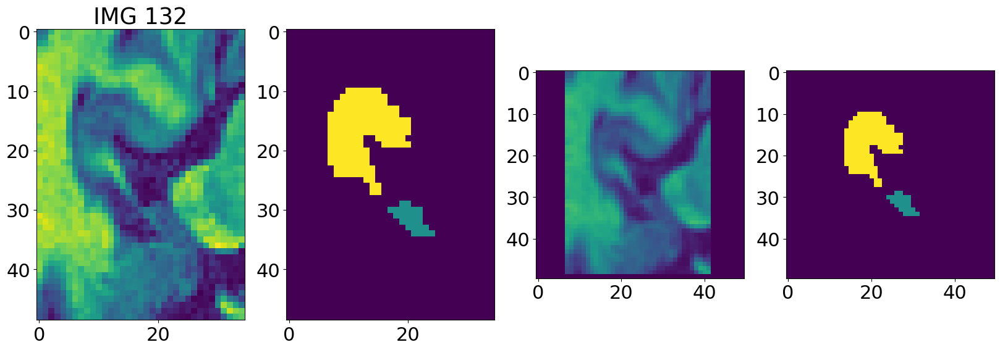

hippocampus_216
Padding value: 0.0
Normalizing intensities via 99 percentile
133 (50, 50, 36)


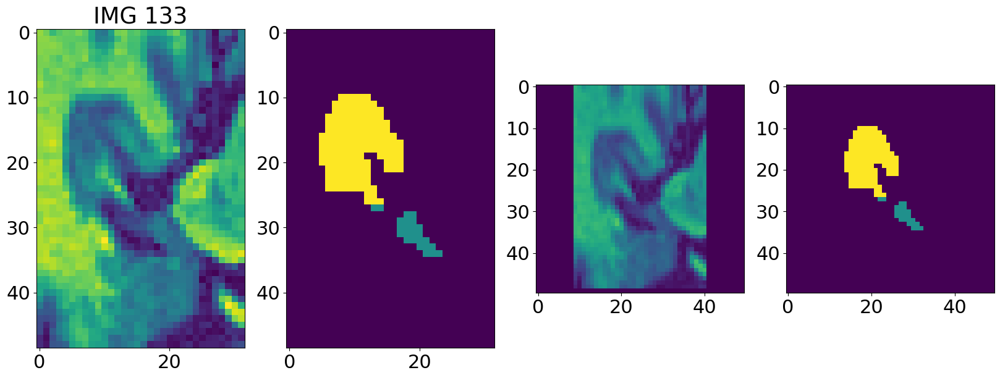

hippocampus_217
Padding value: 0.0
Normalizing intensities via 99 percentile
134 (50, 50, 27)


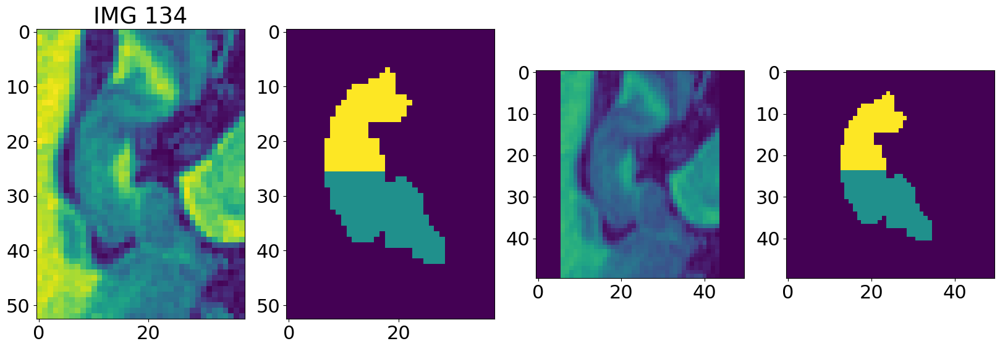

hippocampus_219
Padding value: 0.0
Normalizing intensities via 99 percentile
135 (50, 50, 39)


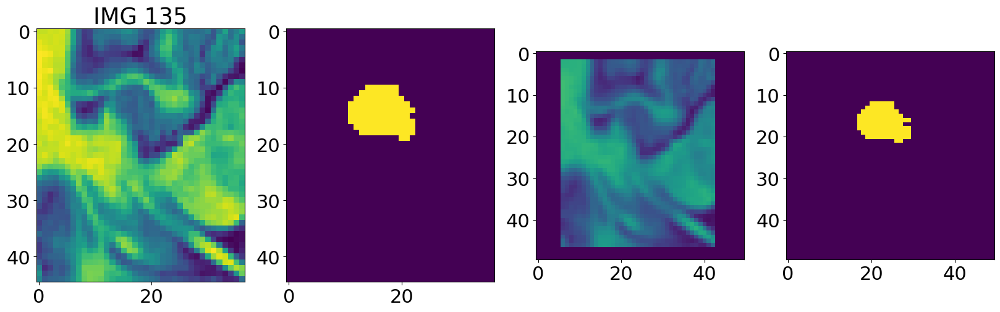

hippocampus_220
Padding value: 0.0
Normalizing intensities via 99 percentile
136 (50, 50, 40)


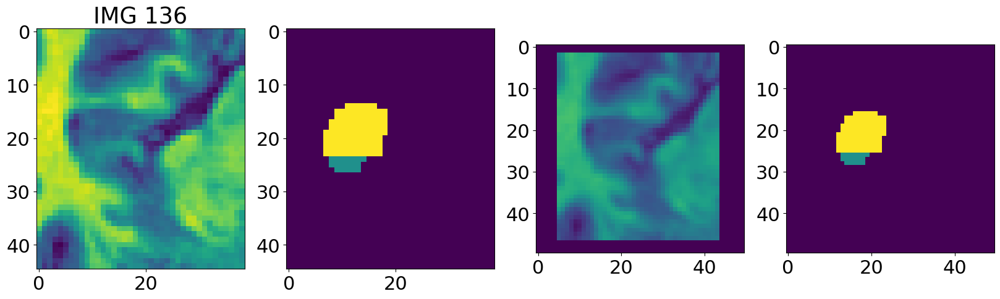

hippocampus_221
Padding value: 0.0
Normalizing intensities via 99 percentile
137 (50, 50, 34)


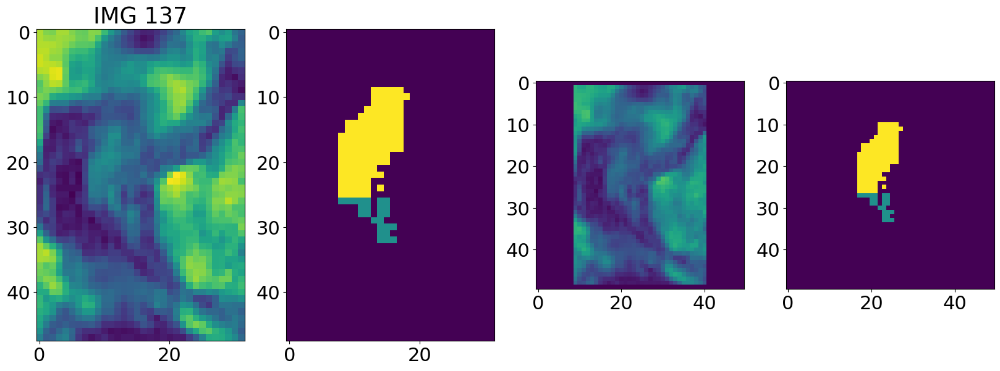

hippocampus_222
Padding value: 0.0
Normalizing intensities via 99 percentile
138 (50, 50, 36)


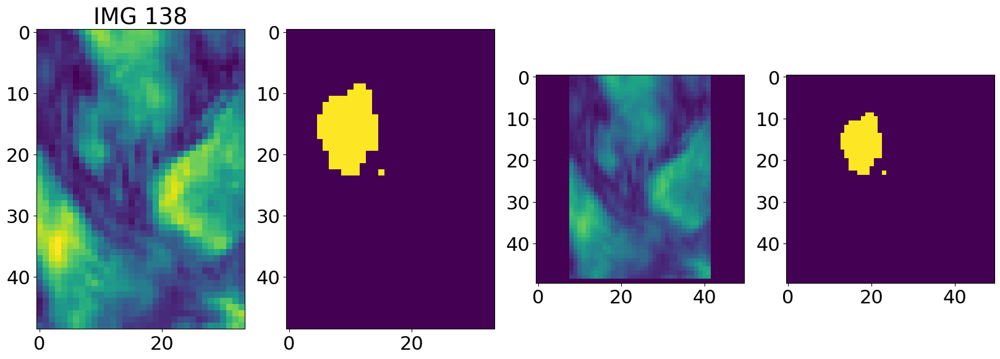

hippocampus_225
Padding value: 0.0
Normalizing intensities via 99 percentile
141 (50, 50, 26)


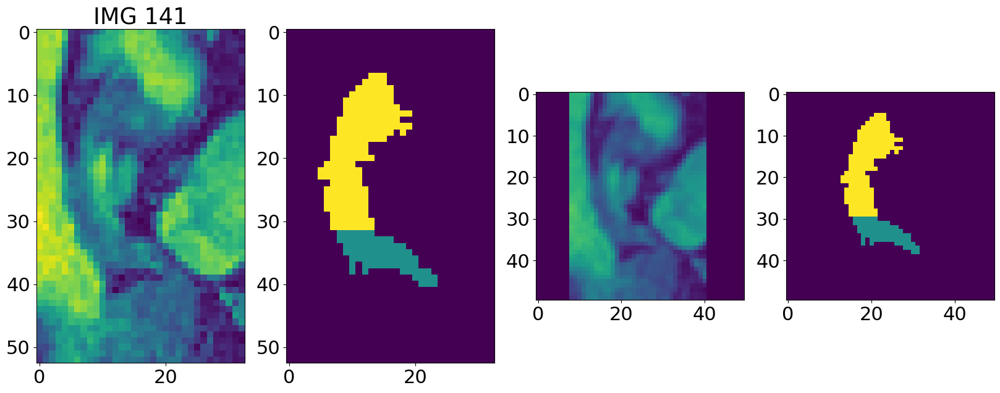

hippocampus_226
Padding value: 0.0
Normalizing intensities via 99 percentile
142 (50, 50, 28)


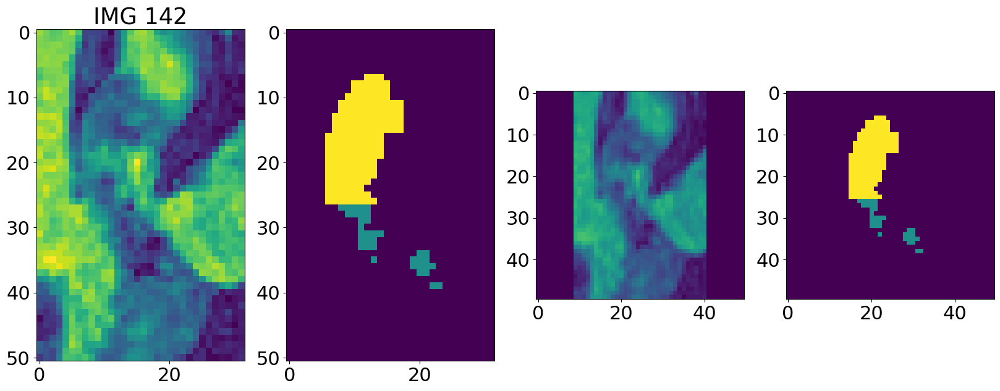

hippocampus_228
Padding value: 0.0
Normalizing intensities via 99 percentile
144 (50, 50, 36)


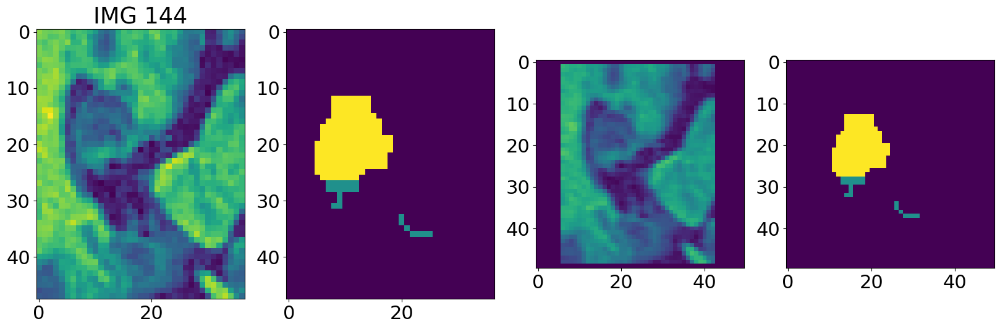

hippocampus_229
Padding value: 0.0
Normalizing intensities via 99 percentile
145 (50, 50, 35)


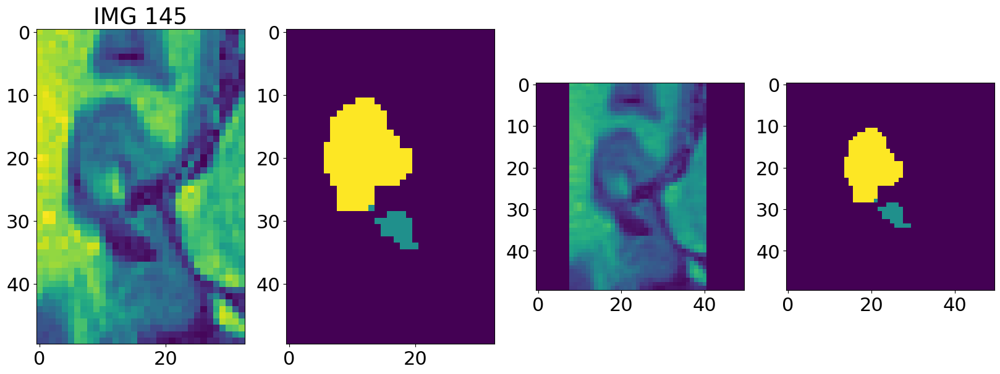

hippocampus_230
Padding value: 0.0
Normalizing intensities via 99 percentile
146 (50, 50, 37)


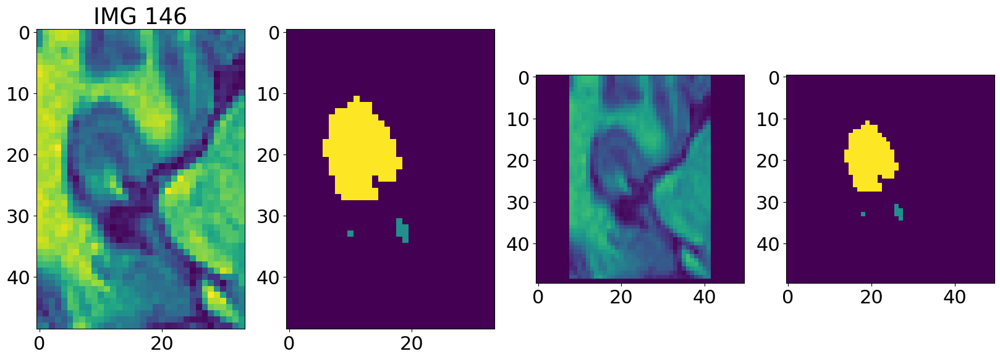

hippocampus_231
Padding value: 0.0
Normalizing intensities via 99 percentile
147 (50, 50, 42)


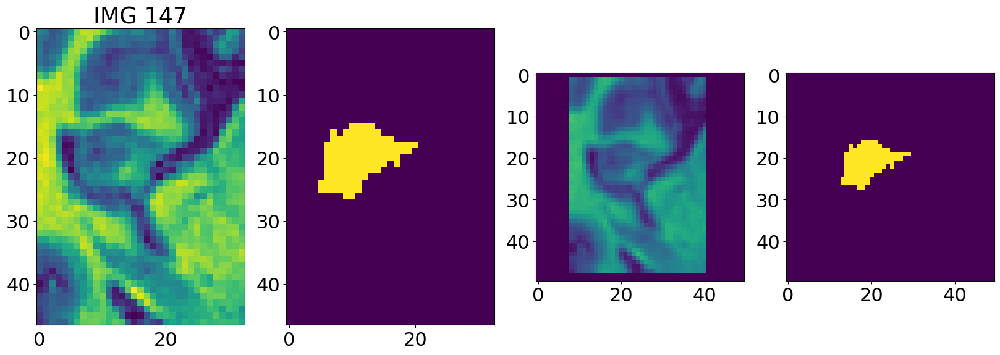

hippocampus_232
Padding value: 0.0
Normalizing intensities via 99 percentile
148 (50, 50, 43)


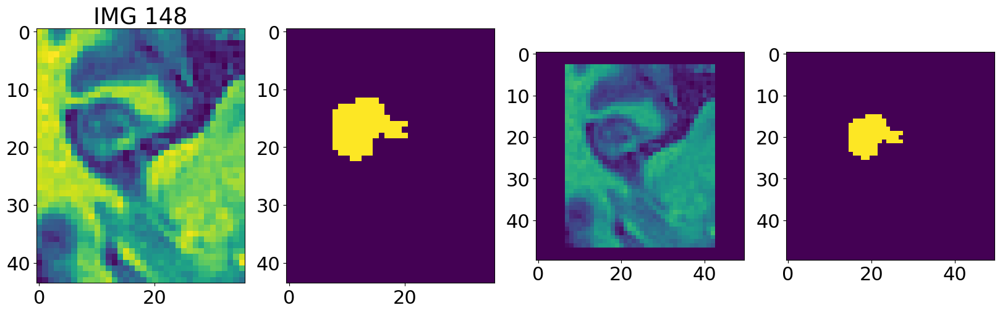

hippocampus_233
Padding value: 0.0
Normalizing intensities via 99 percentile
149 (50, 50, 37)


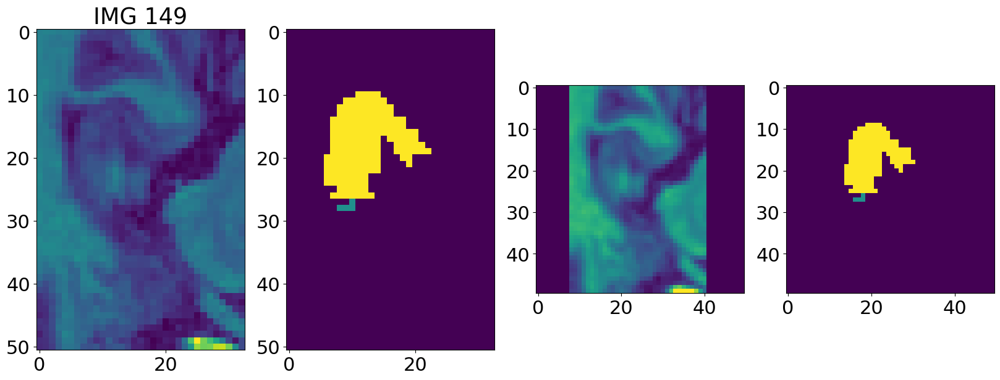

hippocampus_236
Padding value: 0.0
Normalizing intensities via 99 percentile
152 (50, 50, 35)


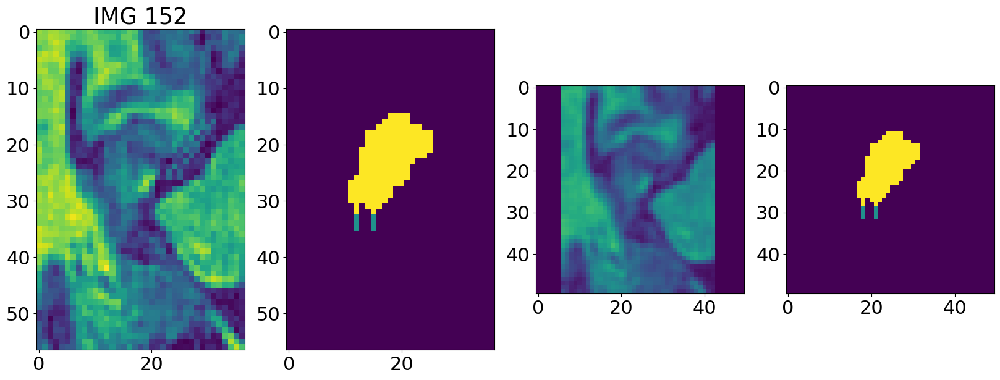

hippocampus_238
Padding value: 0.0
Normalizing intensities via 99 percentile
153 (50, 50, 36)


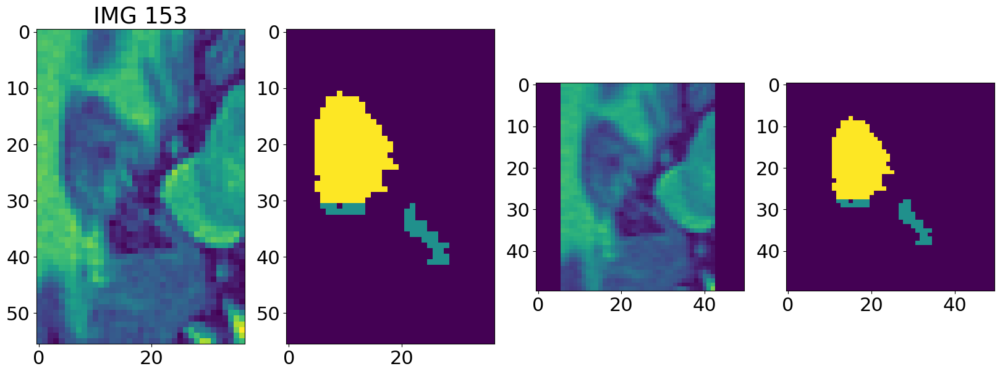

hippocampus_243
Padding value: 0.0
Normalizing intensities via 99 percentile
155 (50, 50, 24)


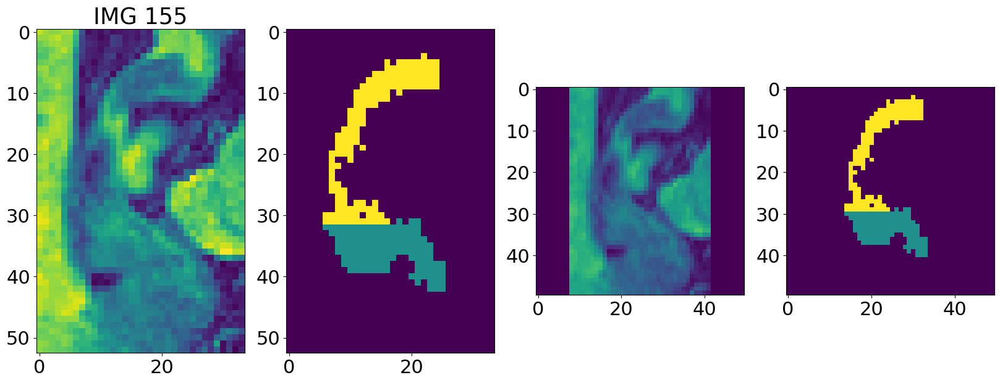

hippocampus_244
Padding value: 0.0
Normalizing intensities via 99 percentile
156 (50, 50, 30)


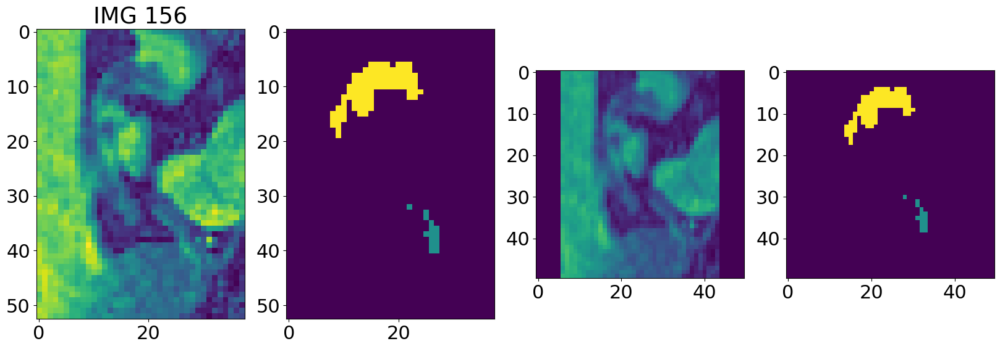

hippocampus_245
Padding value: 0.0
Normalizing intensities via 99 percentile
157 (50, 50, 42)


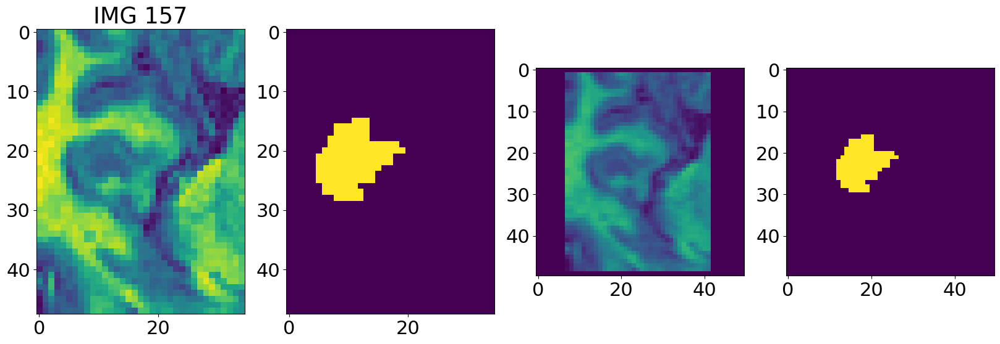

hippocampus_248
Padding value: 0.0
Normalizing intensities via 99 percentile
158 (50, 50, 38)


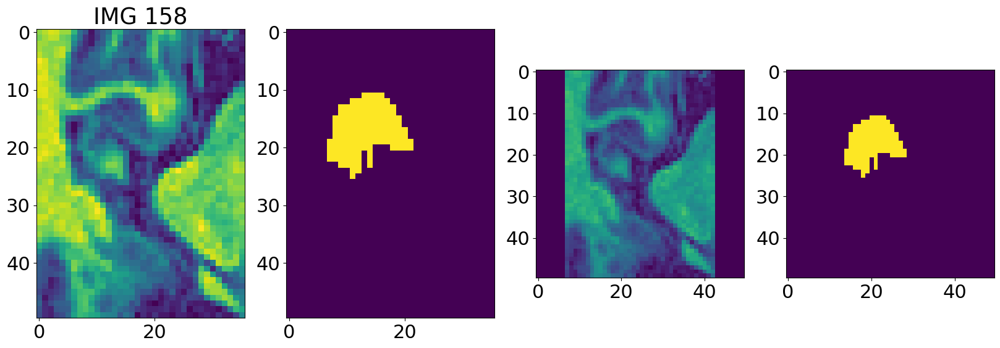

hippocampus_249
Padding value: 0.0
Normalizing intensities via 99 percentile
159 (50, 50, 34)


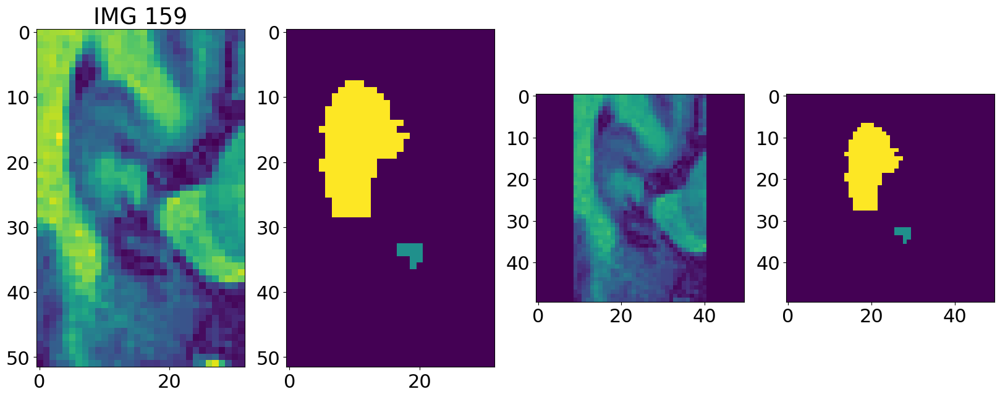

hippocampus_250
Padding value: 0.0
Normalizing intensities via 99 percentile
160 (50, 50, 36)


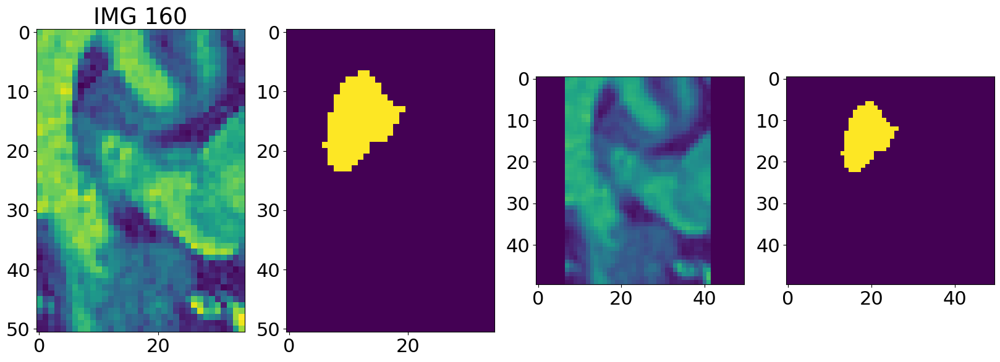

hippocampus_251
Padding value: 0.0
Normalizing intensities via 99 percentile
161 (50, 50, 28)


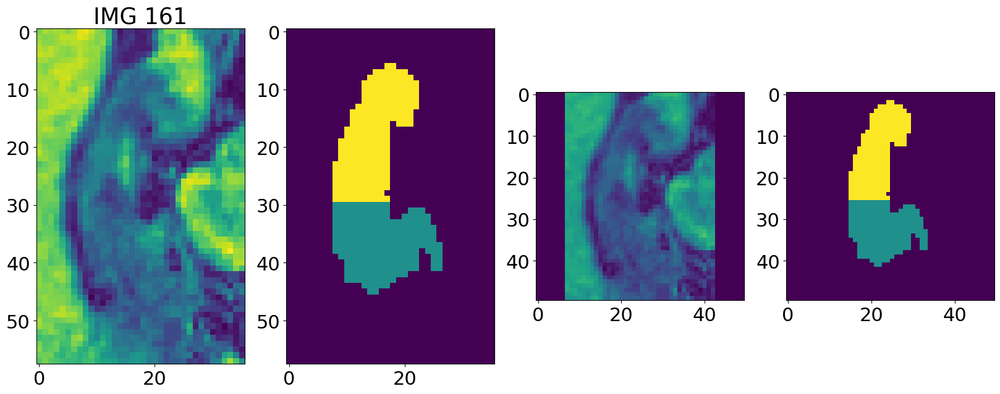

hippocampus_252
Padding value: 0.0
Normalizing intensities via 99 percentile
162 (50, 50, 26)


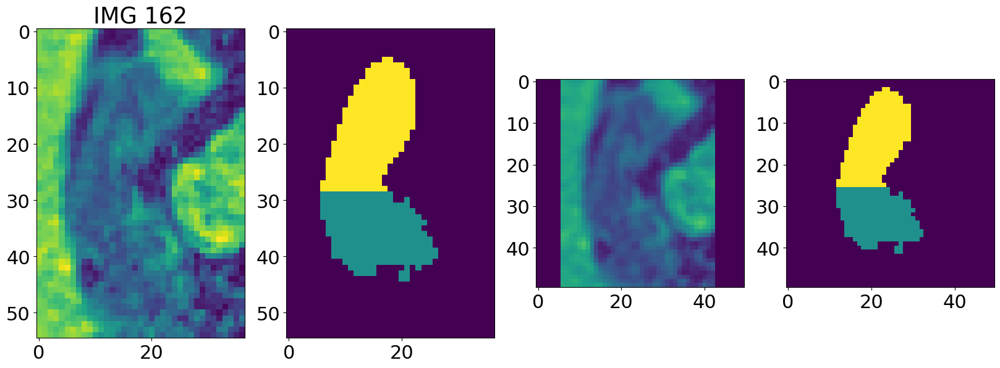

hippocampus_253
Padding value: 0.0
Normalizing intensities via 99 percentile
163 (50, 50, 31)


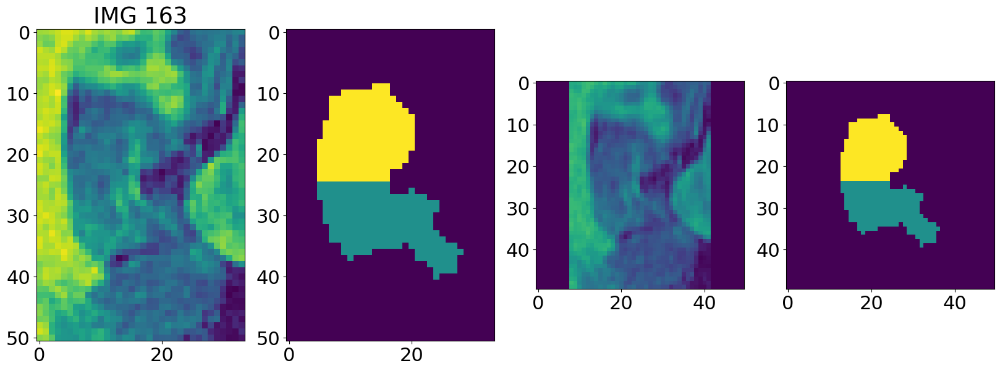

hippocampus_257
Padding value: 0.0
Normalizing intensities via 99 percentile
164 (50, 50, 33)


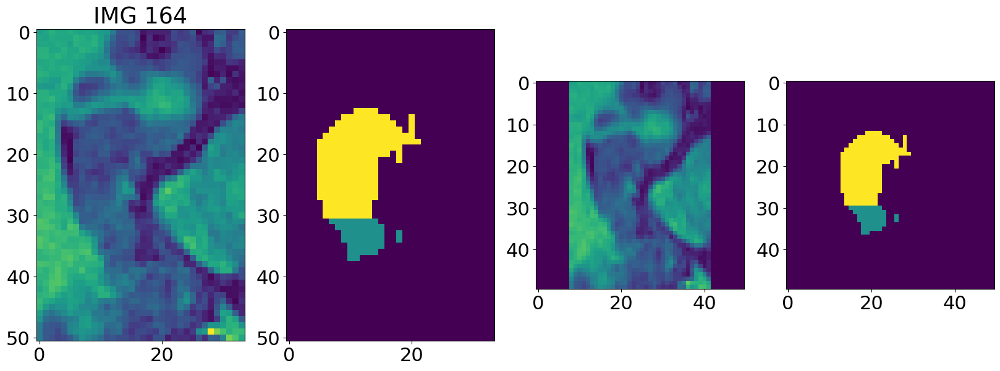

hippocampus_259
Padding value: 0.0
Normalizing intensities via 99 percentile
165 (50, 50, 28)


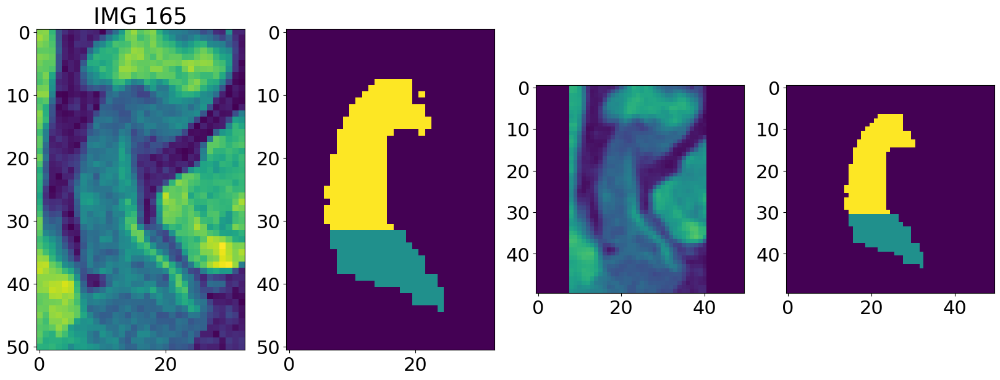

hippocampus_261
Padding value: 0.0
Normalizing intensities via 99 percentile
167 (50, 50, 33)


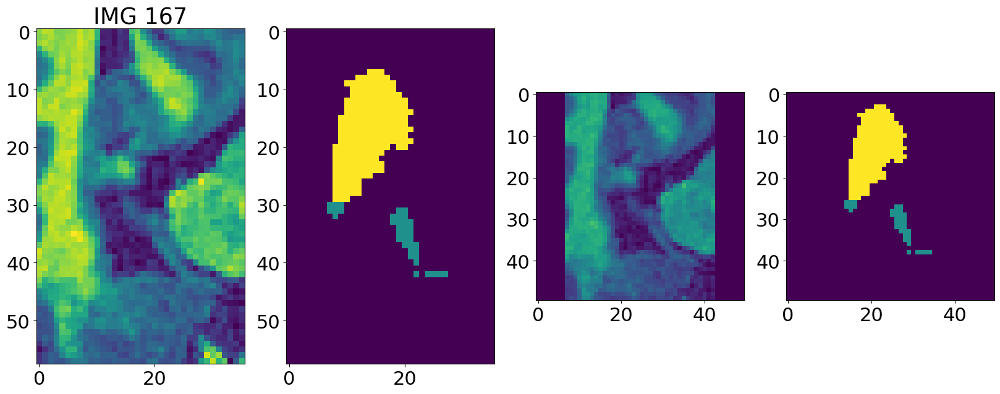

hippocampus_263
Padding value: 0.0
Normalizing intensities via 99 percentile
168 (50, 50, 35)


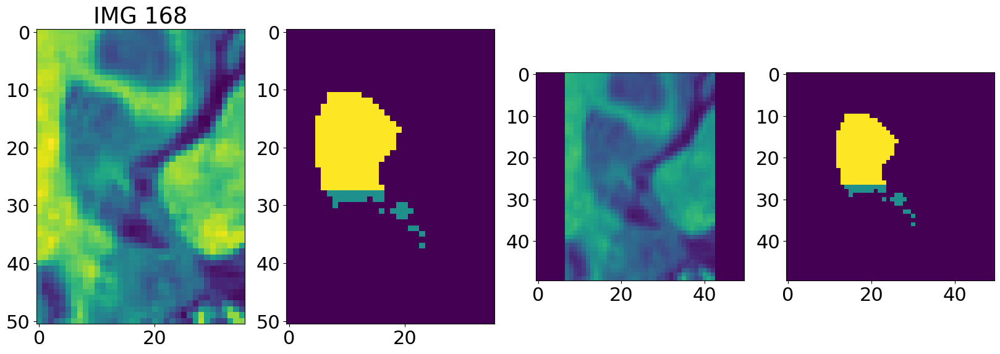

hippocampus_264
Padding value: 0.0
Normalizing intensities via 99 percentile
169 (50, 50, 37)


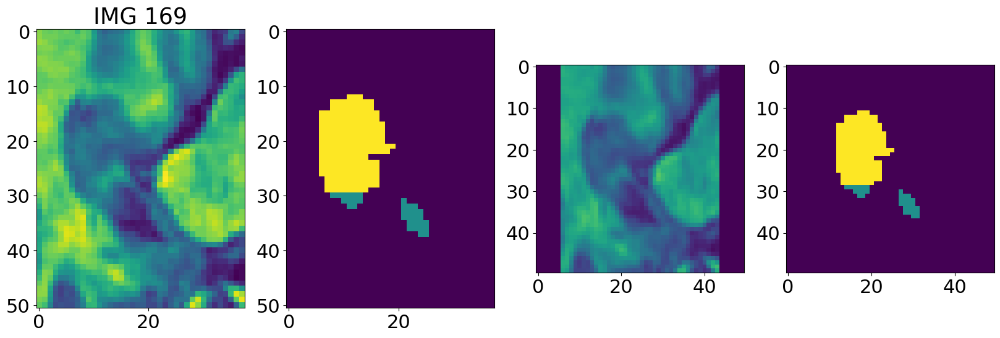

hippocampus_265
Padding value: 0.0
Normalizing intensities via 99 percentile
170 (50, 50, 34)


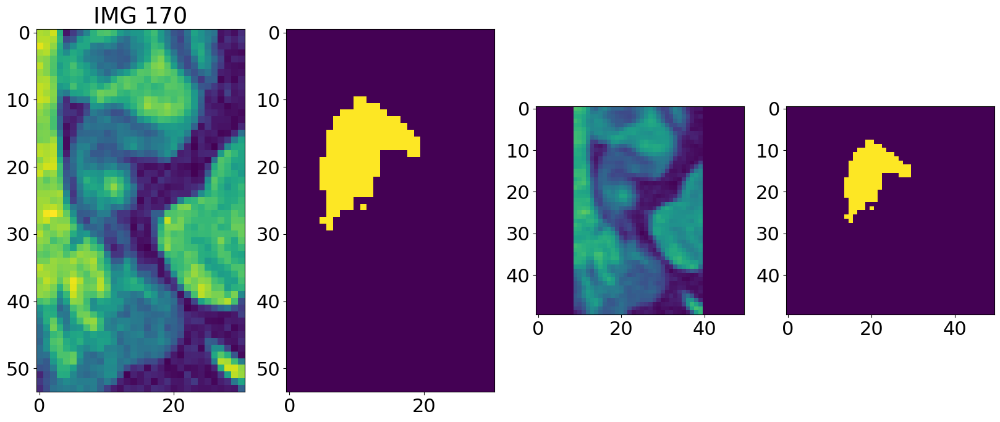

hippocampus_268
Padding value: 0.0
Normalizing intensities via 99 percentile
171 (50, 50, 37)


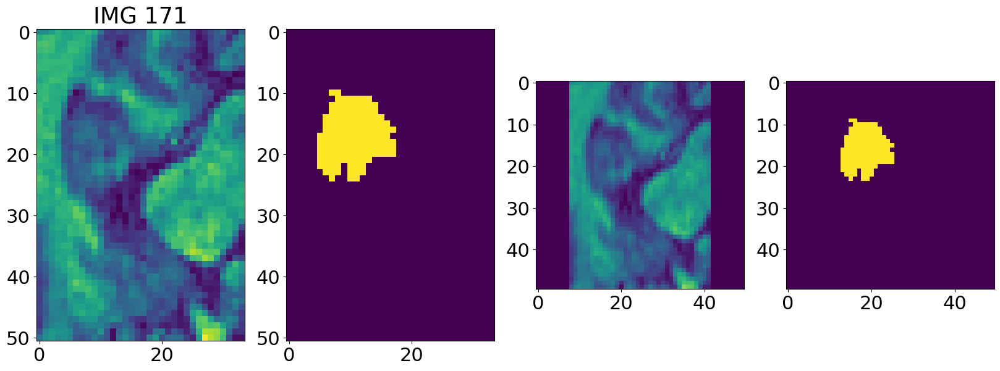

hippocampus_269
Padding value: 0.0
Normalizing intensities via 99 percentile
172 (50, 50, 37)


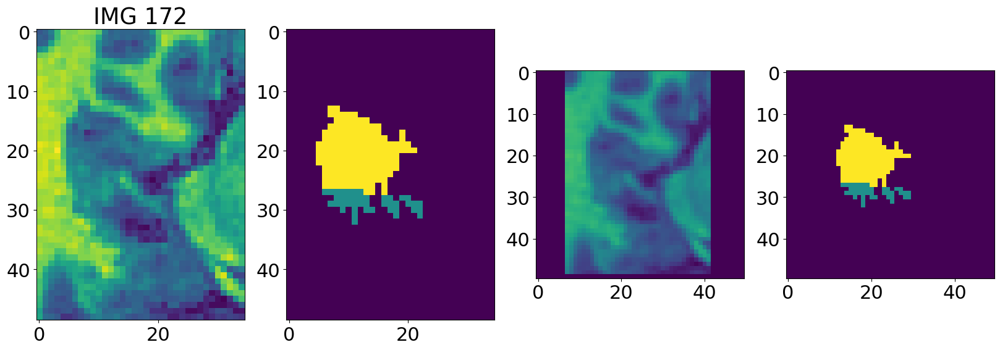

hippocampus_276
Padding value: 0.0
Normalizing intensities via 99 percentile
174 (50, 50, 33)


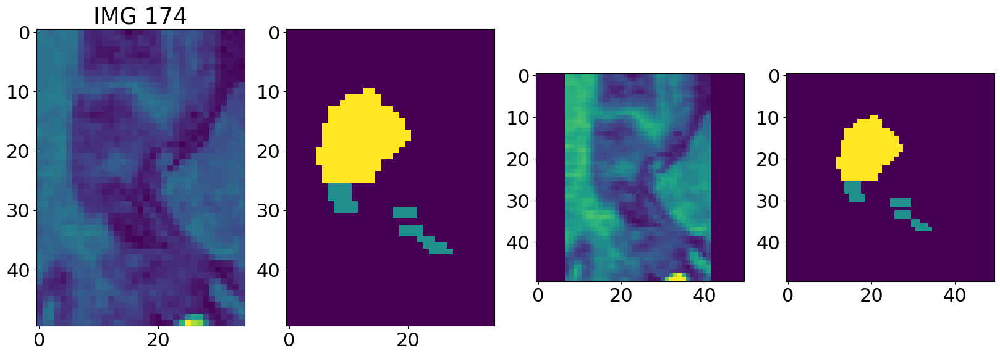

hippocampus_277
Padding value: 0.0
Normalizing intensities via 99 percentile
175 (50, 50, 29)


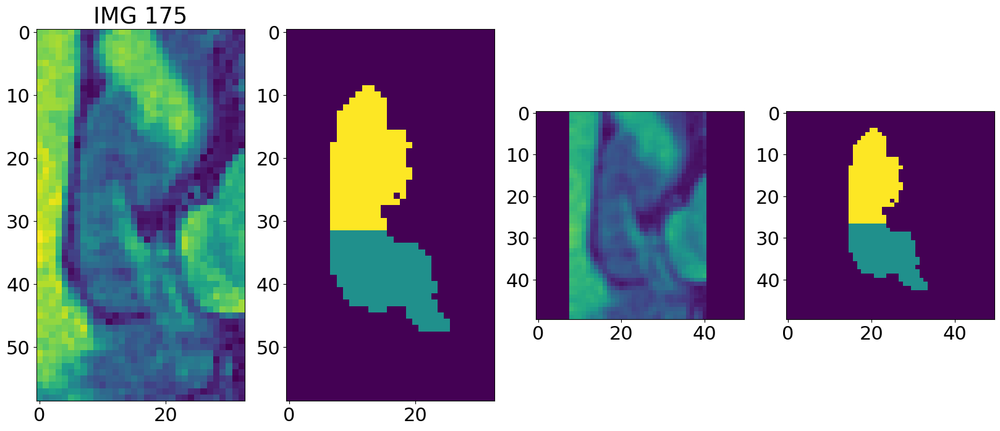

hippocampus_279
Padding value: 0.0
Normalizing intensities via 99 percentile
176 (50, 50, 32)


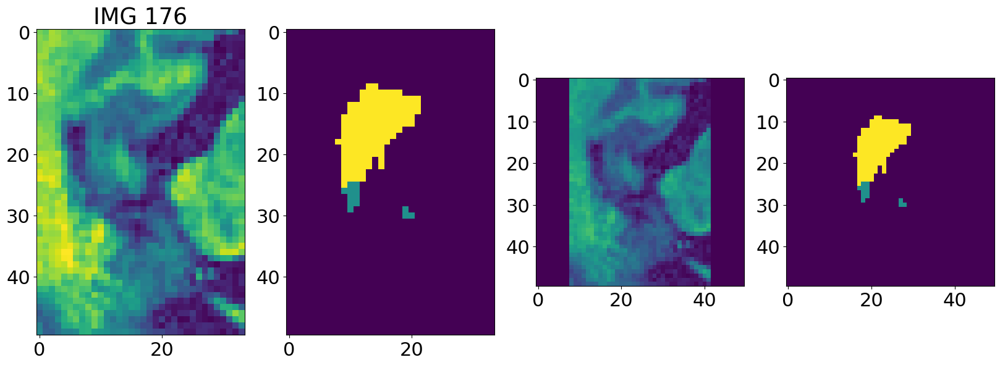

hippocampus_280
Padding value: 0.0
Normalizing intensities via 99 percentile
177 (50, 50, 32)


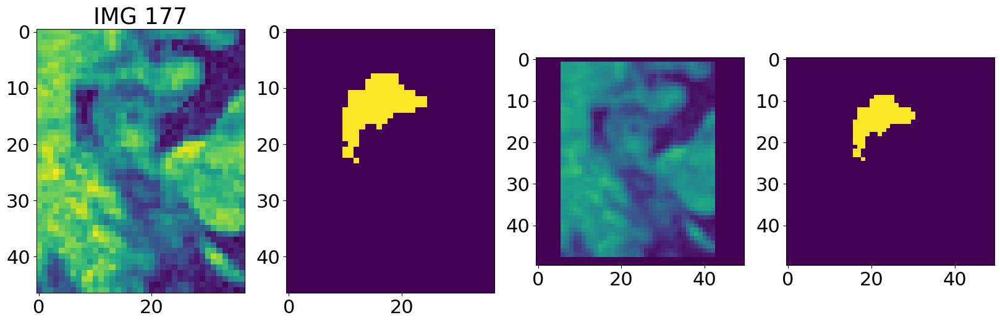

hippocampus_287
Padding value: 0.0
Normalizing intensities via 99 percentile
180 (50, 50, 39)


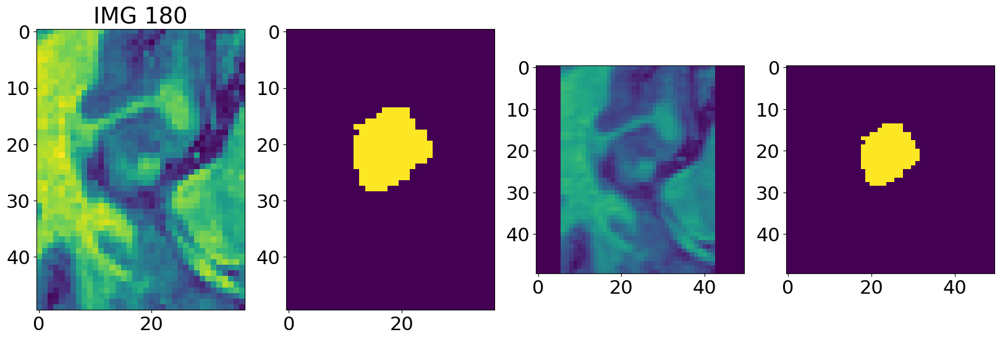

hippocampus_288
Padding value: 0.0
Normalizing intensities via 99 percentile
181 (50, 50, 42)


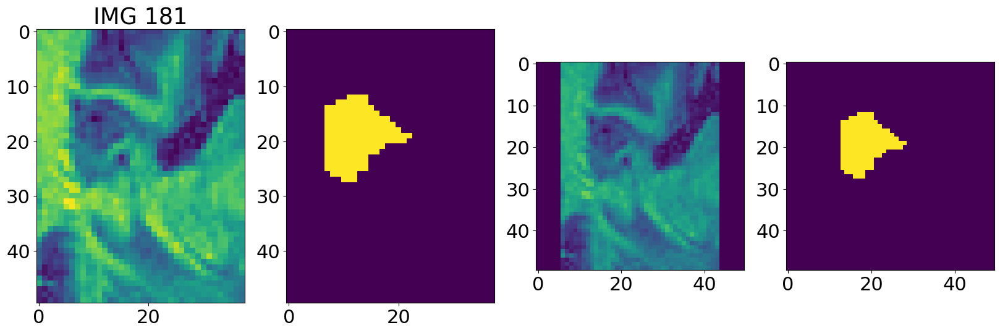

hippocampus_289
Padding value: 0.0
Normalizing intensities via 99 percentile
182 (50, 50, 36)


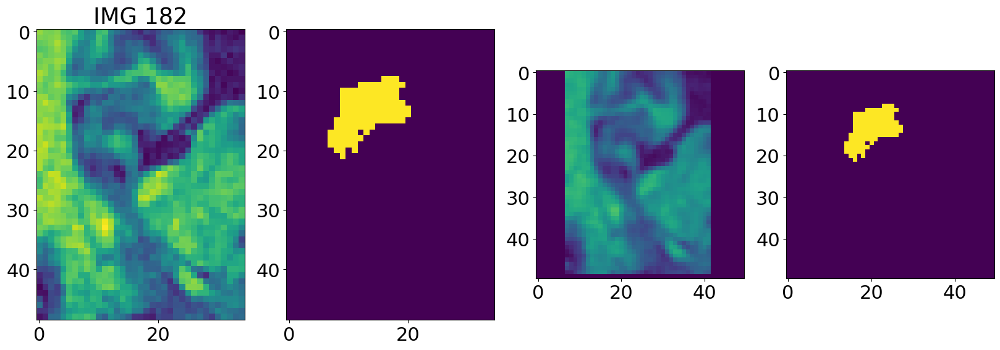

hippocampus_292
Padding value: 0.0
Normalizing intensities via 99 percentile
184 (50, 50, 33)


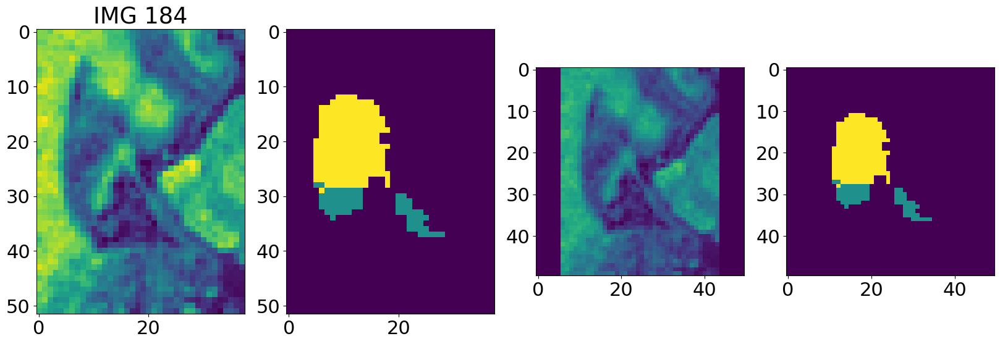

hippocampus_294
Padding value: 0.0
Normalizing intensities via 99 percentile
185 (50, 50, 44)


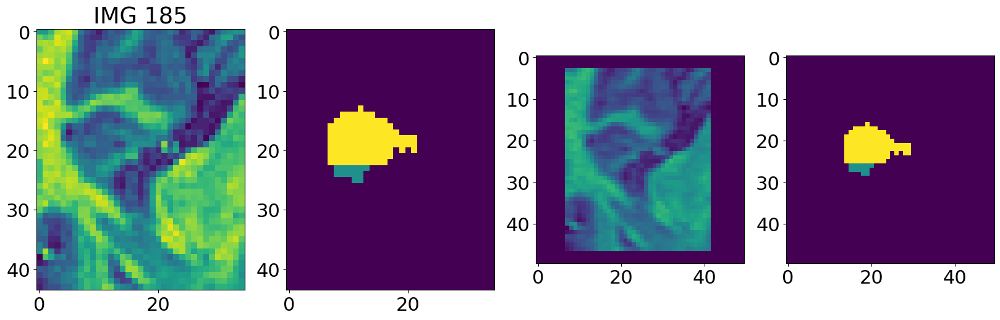

hippocampus_295
Padding value: 0.0
Normalizing intensities via 99 percentile
186 (50, 50, 36)


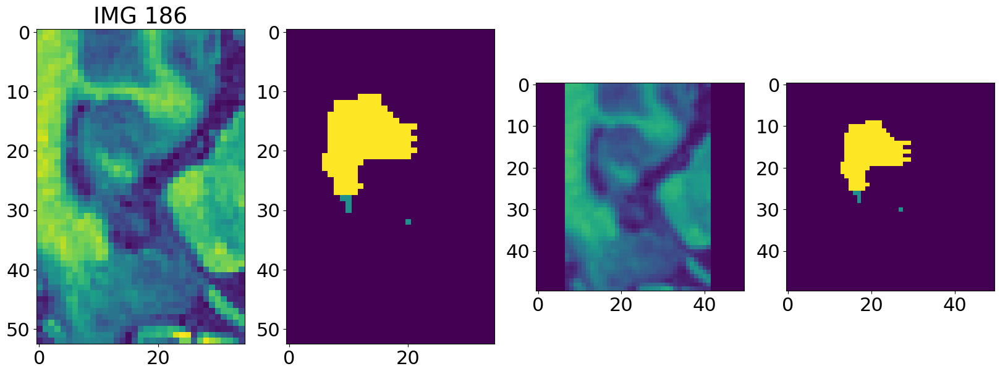

hippocampus_296
Padding value: 0.0
Normalizing intensities via 99 percentile
187 (50, 50, 35)


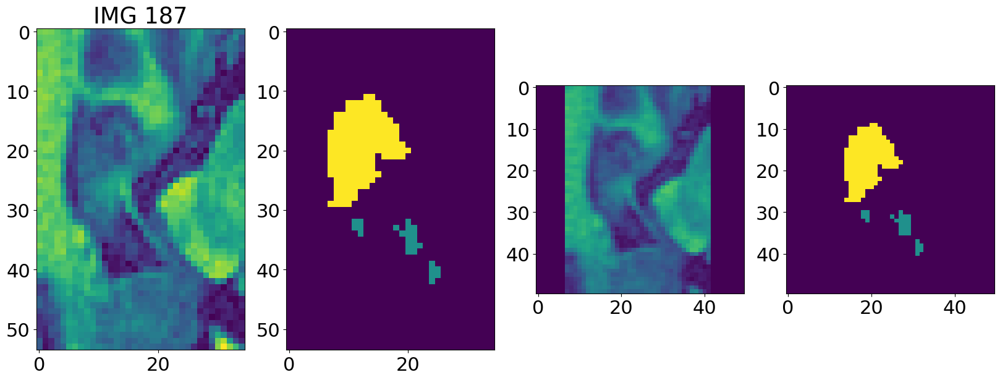

hippocampus_299
Padding value: 0.0
Normalizing intensities via 99 percentile
190 (50, 50, 34)


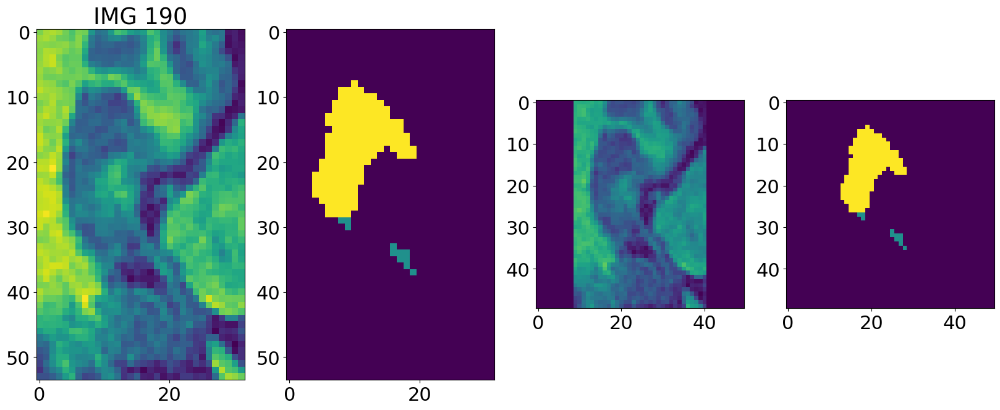

hippocampus_300
Padding value: 0.0
Normalizing intensities via 99 percentile
191 (50, 50, 35)


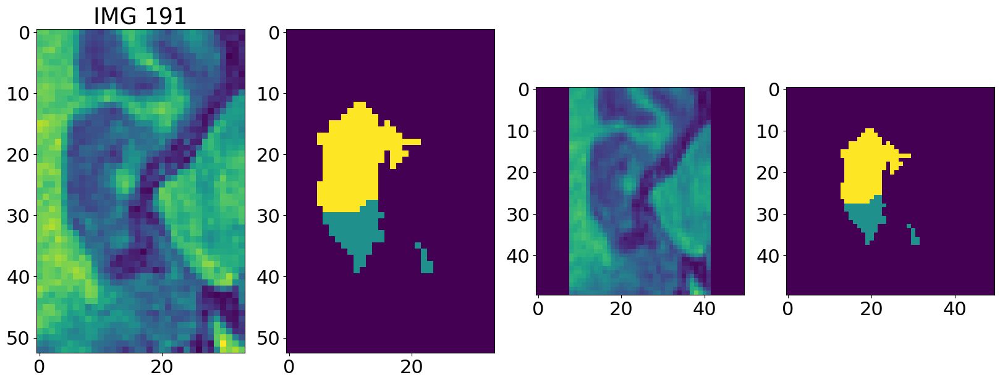

hippocampus_301
Padding value: 0.0
Normalizing intensities via 99 percentile
192 (50, 50, 36)


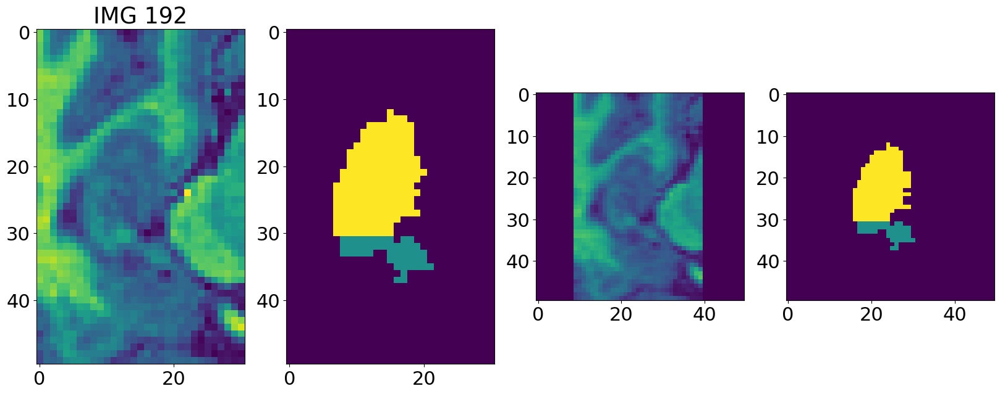

hippocampus_302
Padding value: 0.0
Normalizing intensities via 99 percentile
193 (50, 50, 39)


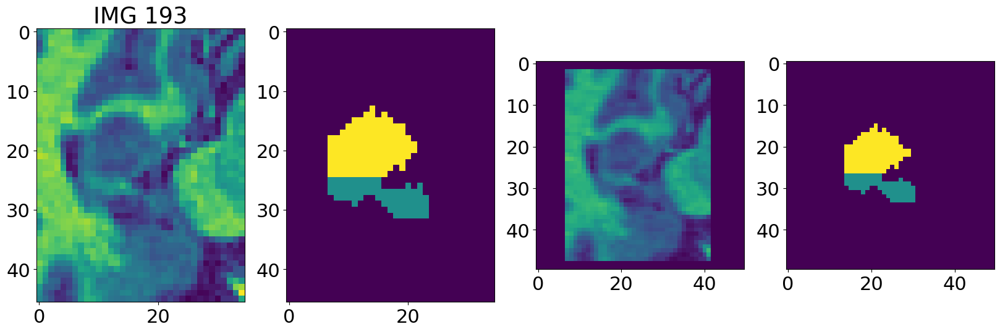

hippocampus_305
Padding value: 0.0
Normalizing intensities via 99 percentile
196 (50, 50, 30)


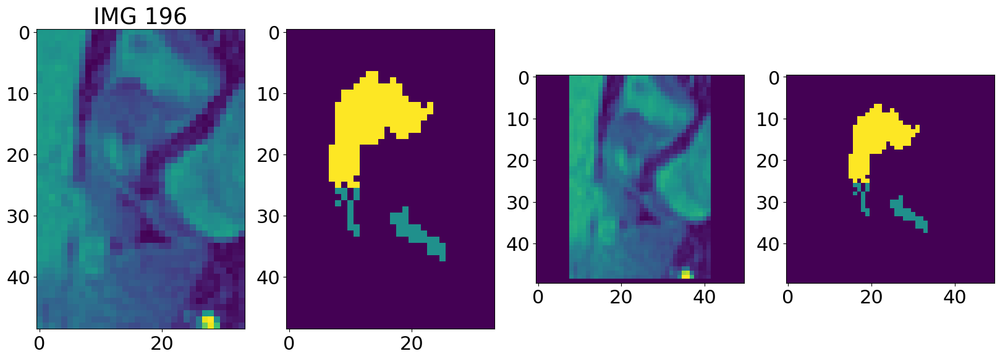

hippocampus_308
Padding value: 0.0
Normalizing intensities via 99 percentile
197 (50, 50, 40)


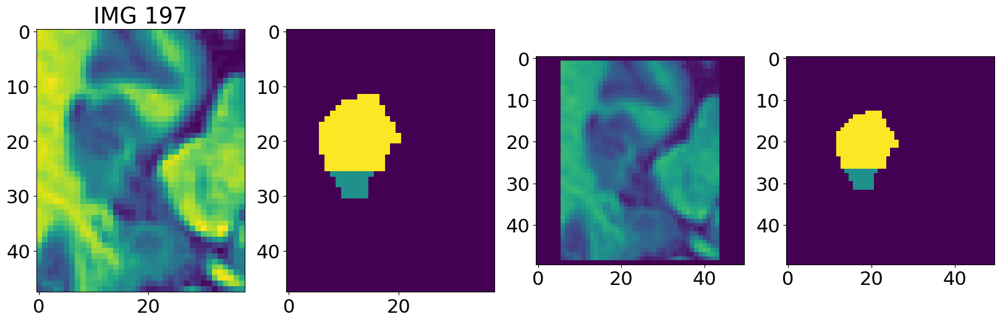

hippocampus_309
Padding value: 0.0
Normalizing intensities via 99 percentile
198 (50, 50, 38)


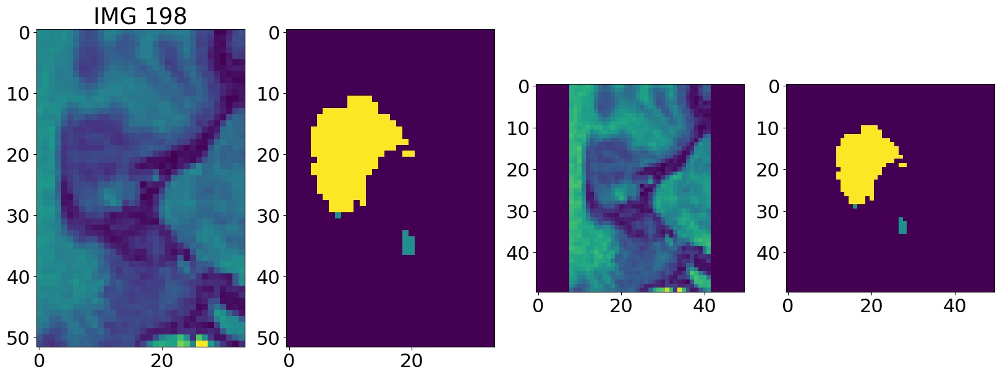

hippocampus_310
Padding value: 0.0
Normalizing intensities via 99 percentile
199 (50, 50, 38)


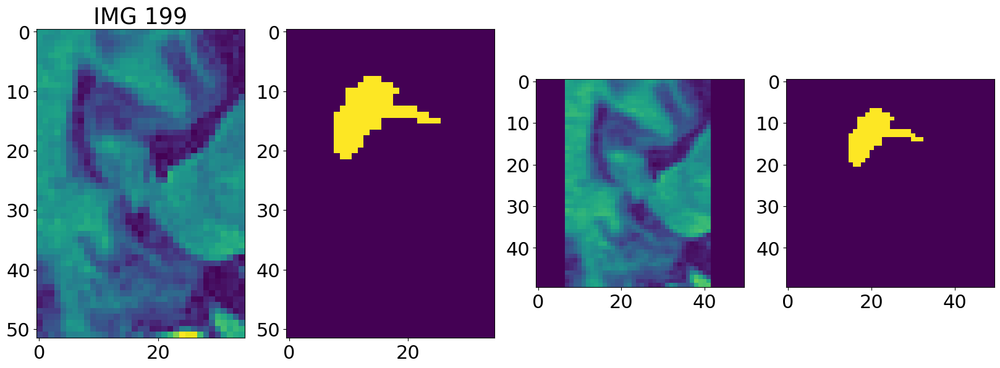

hippocampus_311
Padding value: 0.0
Normalizing intensities via 99 percentile
200 (50, 50, 37)


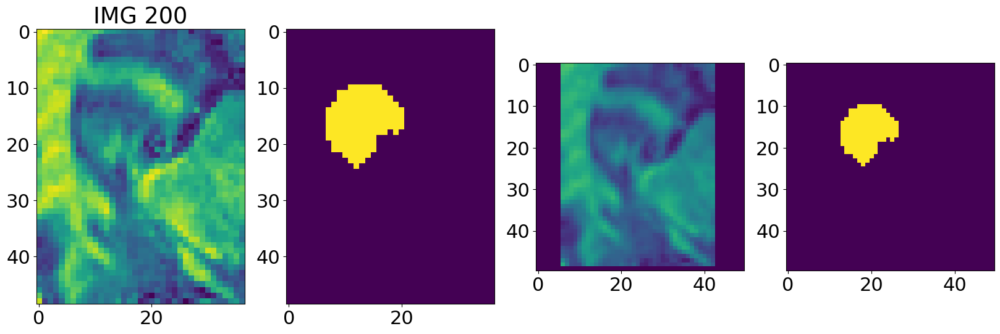

hippocampus_314
Padding value: 0.0
Normalizing intensities via 99 percentile
201 (50, 50, 33)


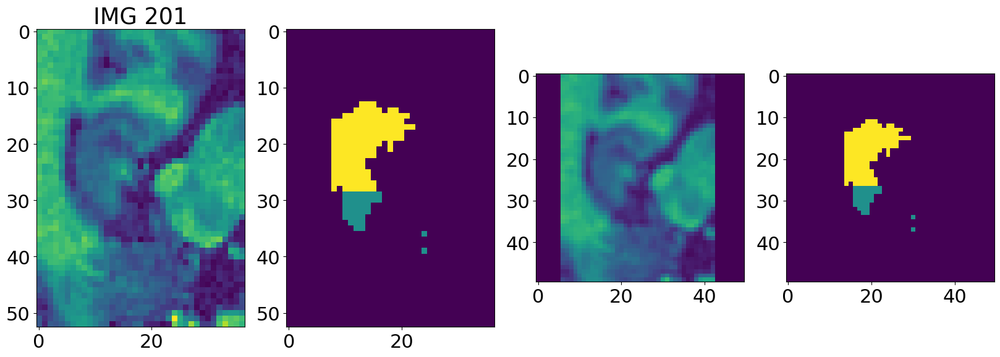

hippocampus_316
Padding value: 0.0
Normalizing intensities via 99 percentile
202 (50, 50, 33)


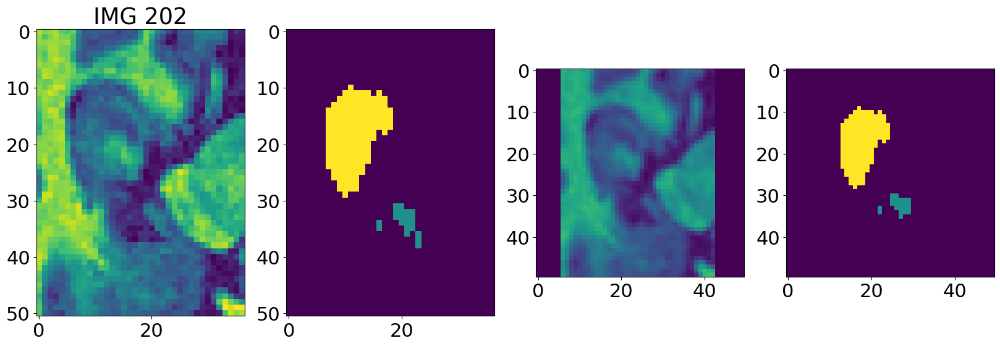

hippocampus_317
Padding value: 0.0
Normalizing intensities via 99 percentile
203 (50, 50, 34)


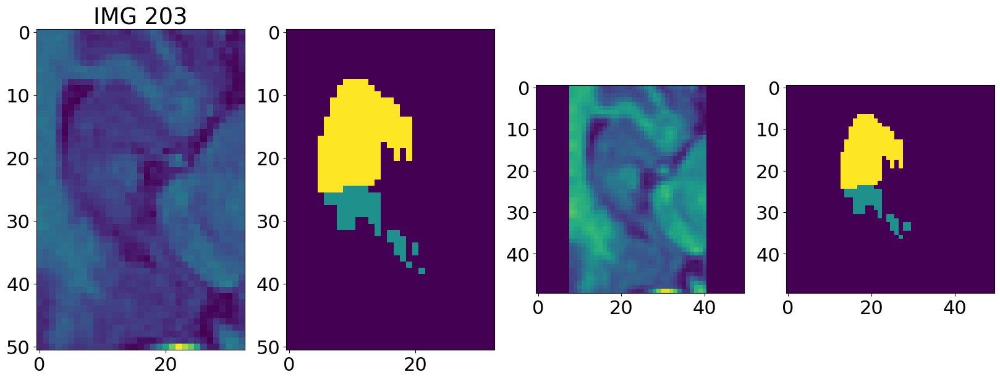

hippocampus_318
Padding value: 0.0
Normalizing intensities via 99 percentile
204 (50, 50, 33)


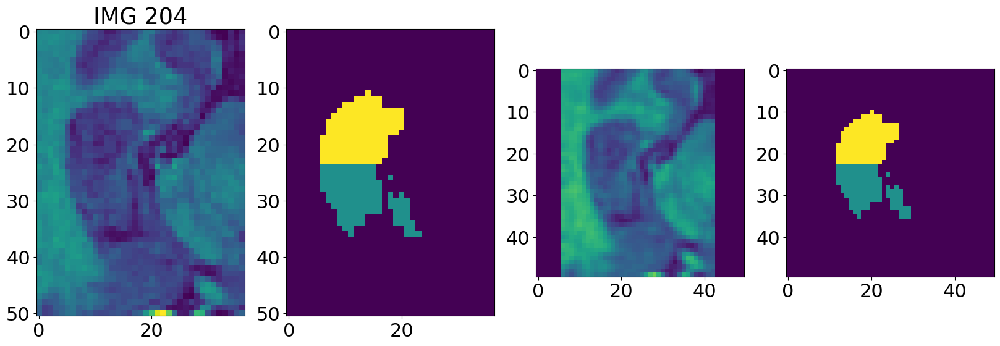

hippocampus_319
Padding value: 0.0
Normalizing intensities via 99 percentile
205 (50, 50, 34)


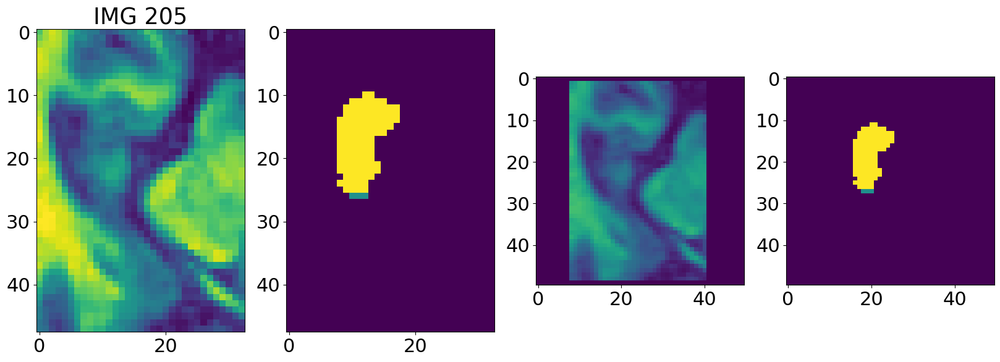

hippocampus_322
Padding value: 0.0
Normalizing intensities via 99 percentile
208 (50, 50, 37)


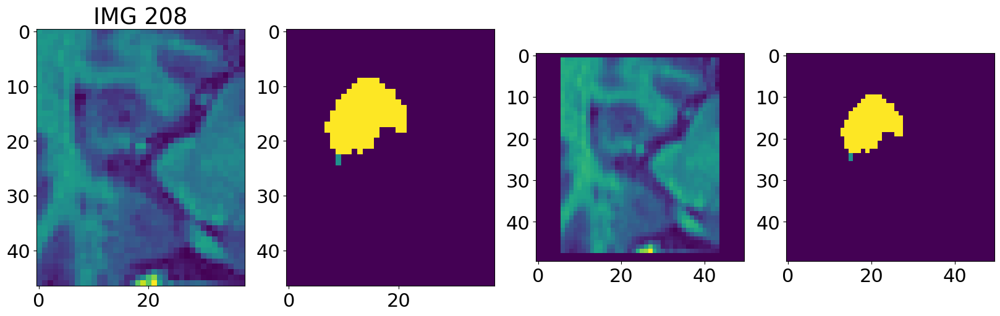

hippocampus_325
Padding value: 0.0
Normalizing intensities via 99 percentile
209 (50, 50, 40)


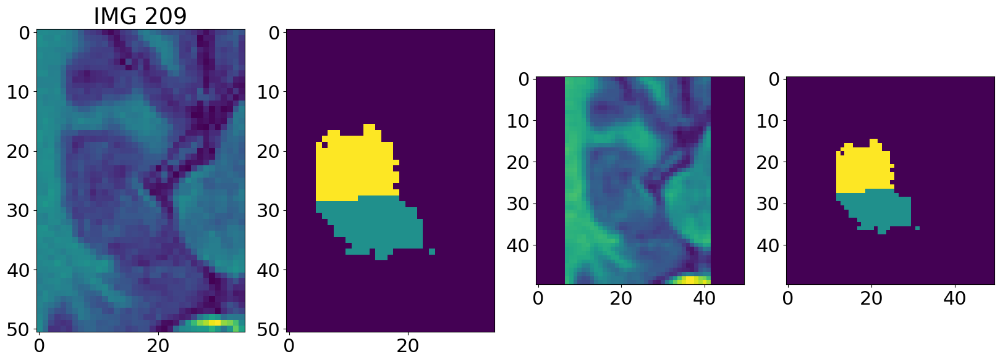

hippocampus_326
Padding value: 0.0
Normalizing intensities via 99 percentile
210 (50, 50, 41)


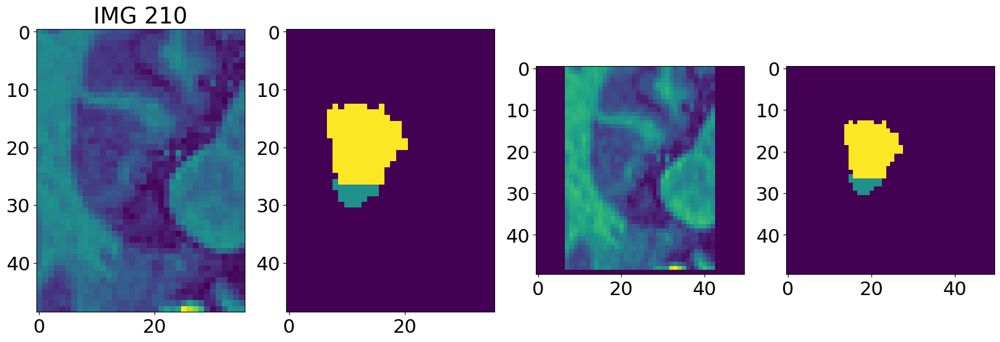

hippocampus_327
Padding value: 0.0
Normalizing intensities via 99 percentile
211 (50, 50, 27)


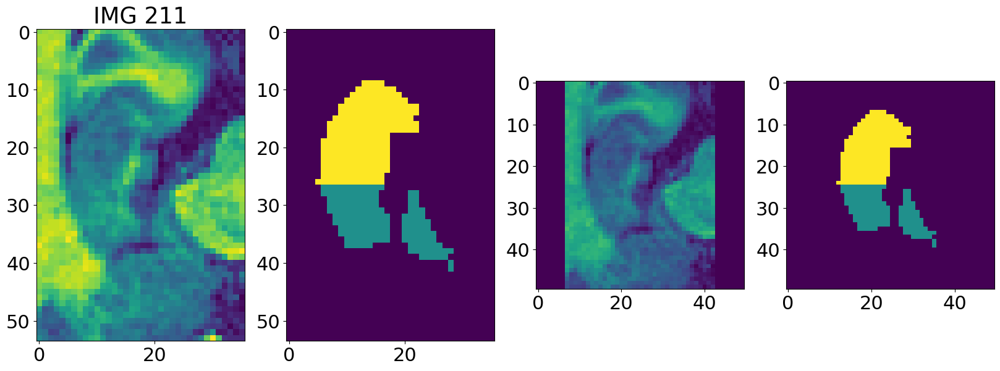

hippocampus_328
Padding value: 0.0
Normalizing intensities via 99 percentile
212 (50, 50, 30)


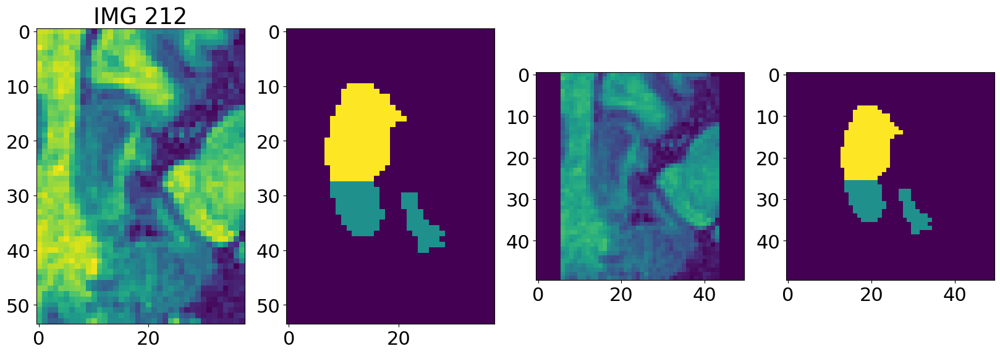

hippocampus_329
Padding value: 0.0
Normalizing intensities via 99 percentile
213 (50, 50, 32)


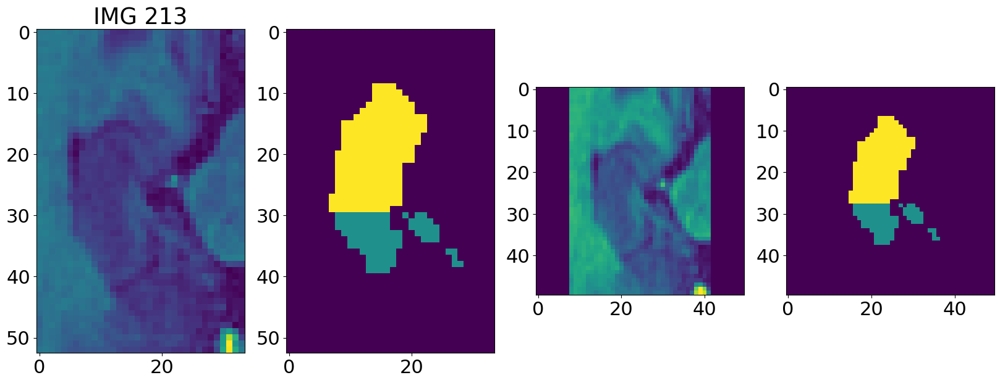

hippocampus_330
Padding value: 0.0
Normalizing intensities via 99 percentile
214 (50, 50, 33)


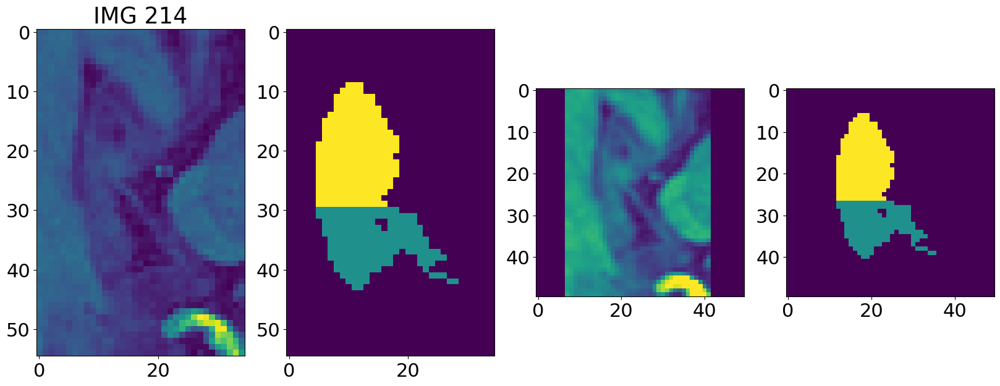

hippocampus_331
Padding value: 0.0
Normalizing intensities via 99 percentile
215 (50, 50, 33)


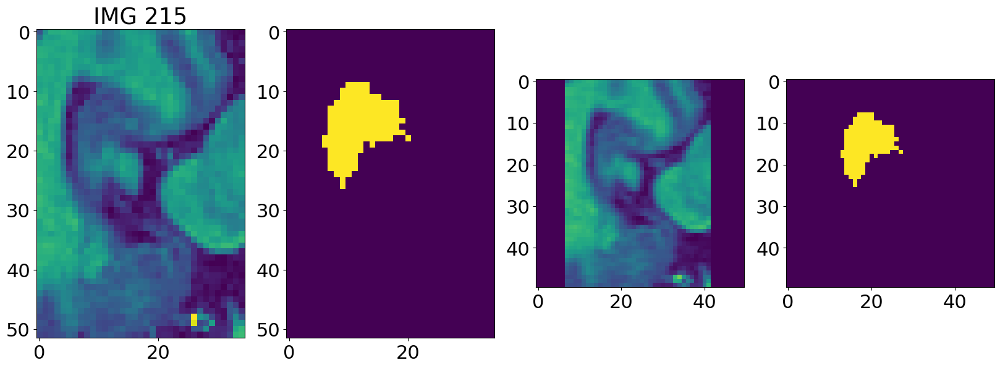

hippocampus_332
Padding value: 0.0
Normalizing intensities via 99 percentile
216 (50, 50, 33)


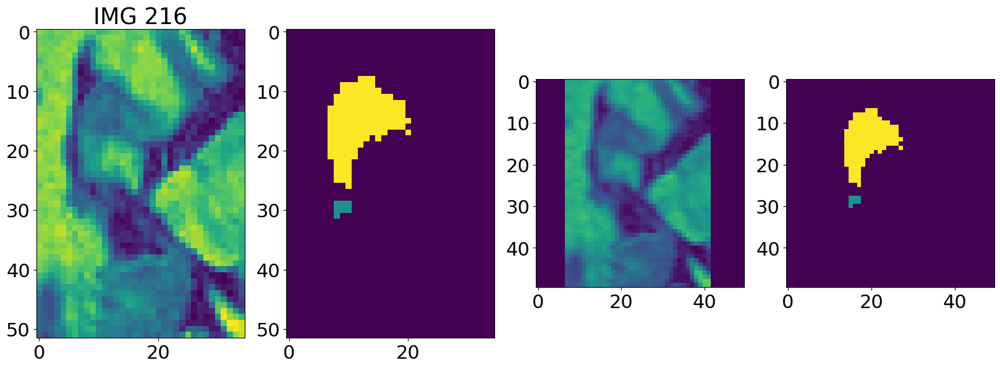

hippocampus_333
Padding value: 0.0
Normalizing intensities via 99 percentile
217 (50, 50, 38)


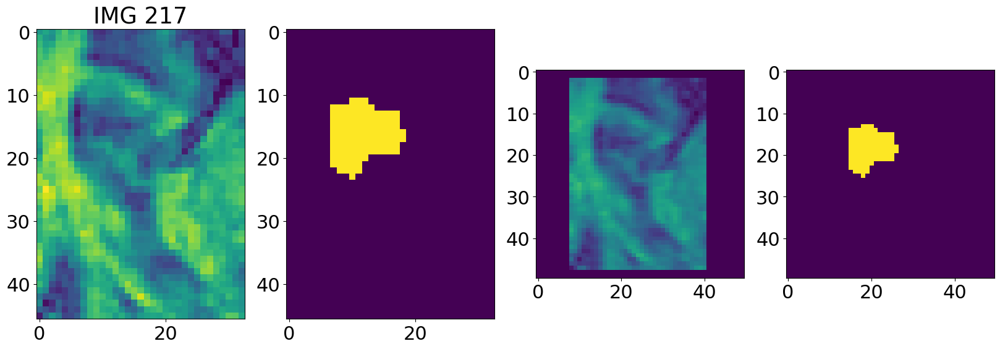

hippocampus_334
Padding value: 0.0
Normalizing intensities via 99 percentile
218 (50, 50, 36)


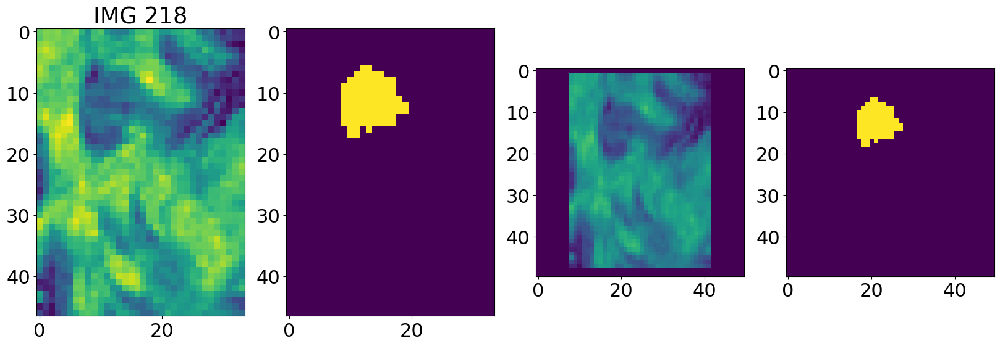

hippocampus_335
Padding value: 0.0
Normalizing intensities via 99 percentile
219 (50, 50, 41)


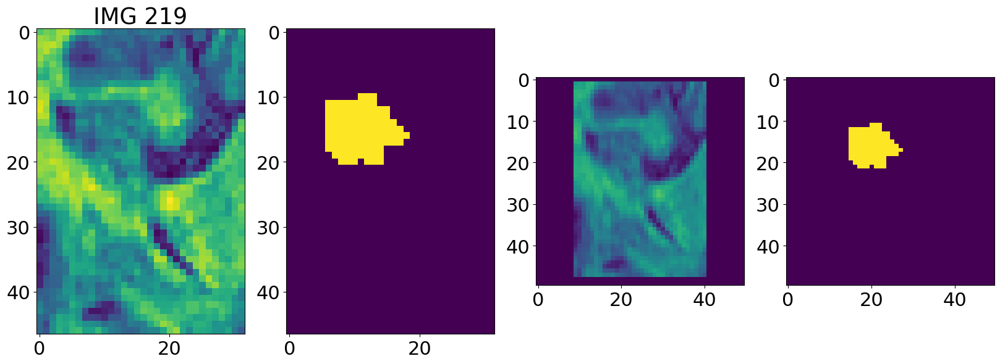

hippocampus_336
Padding value: 0.0
Normalizing intensities via 99 percentile
220 (50, 50, 43)


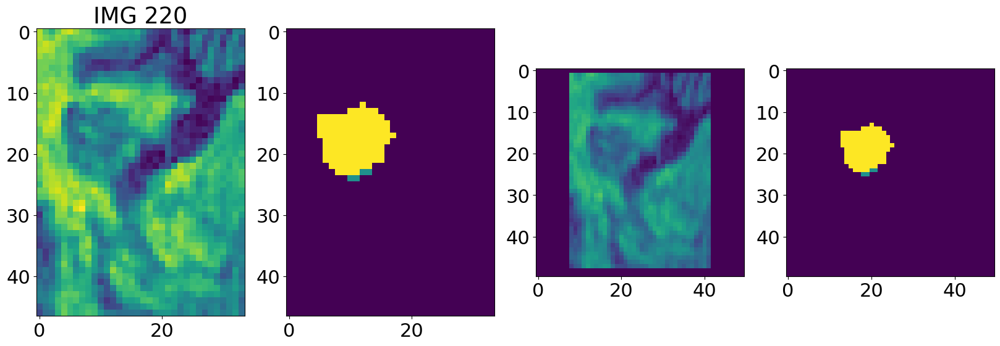

hippocampus_337
Padding value: 0.0
Normalizing intensities via 99 percentile
221 (50, 50, 41)


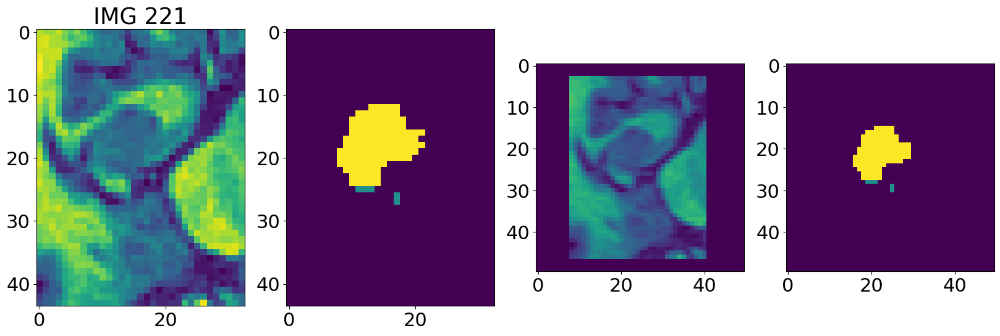

hippocampus_340
Padding value: 0.0
Normalizing intensities via 99 percentile
223 (50, 50, 38)


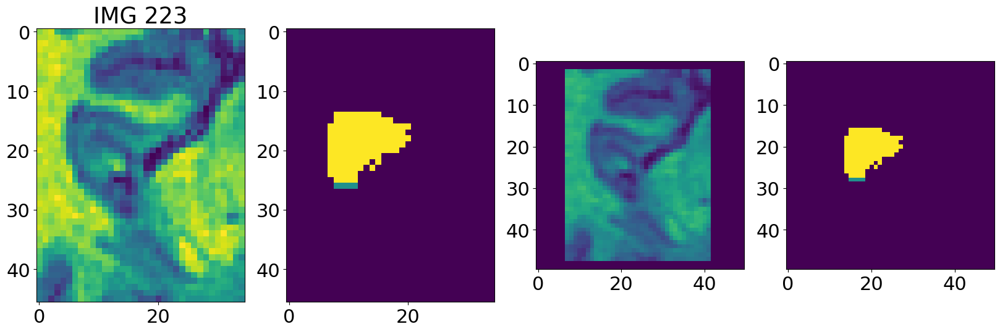

hippocampus_341
Padding value: 0.0
Normalizing intensities via 99 percentile
224 (50, 50, 35)


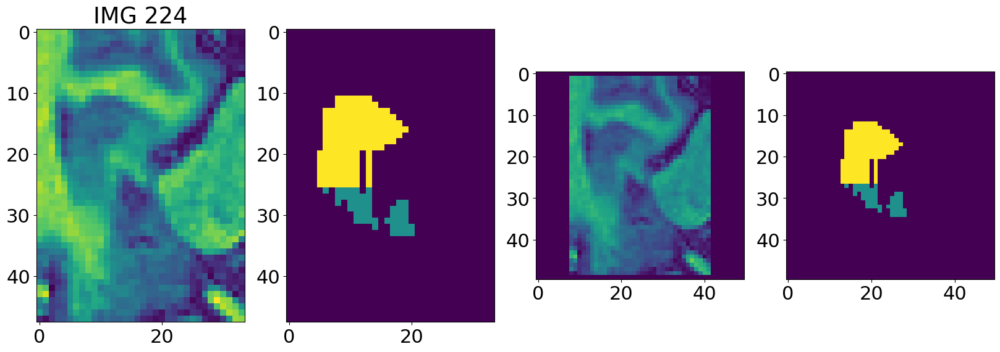

hippocampus_343
Padding value: 0.0
Normalizing intensities via 99 percentile
225 (50, 50, 38)


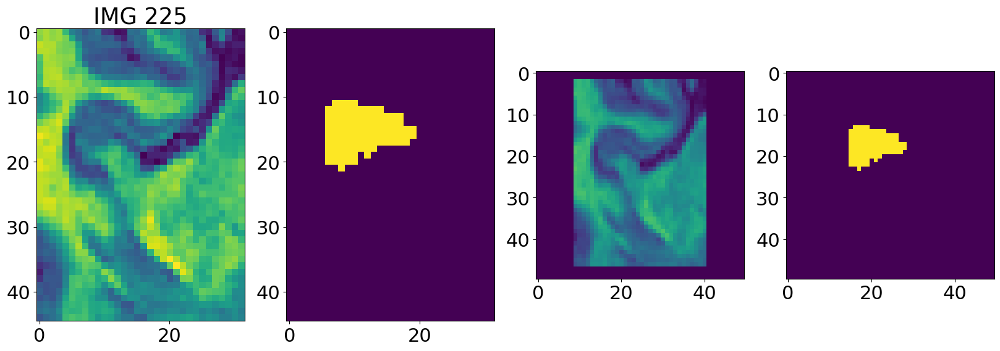

hippocampus_349
Padding value: 0.0
Normalizing intensities via 99 percentile
227 (50, 50, 34)


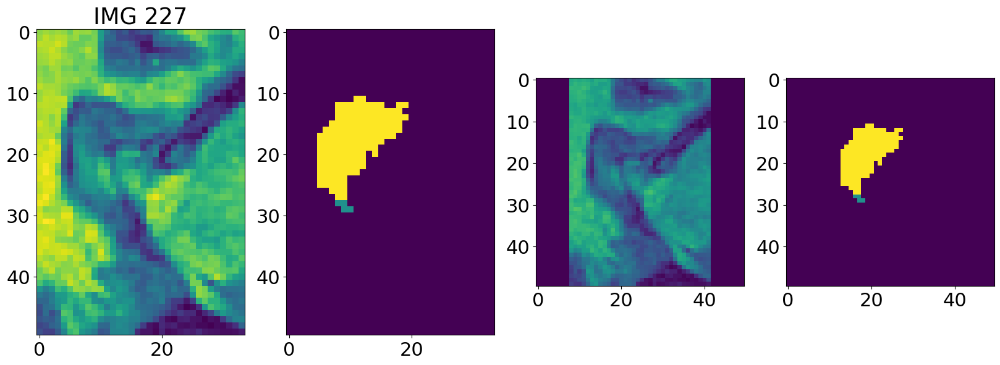

hippocampus_351
Padding value: 0.0
Normalizing intensities via 99 percentile
229 (50, 50, 35)


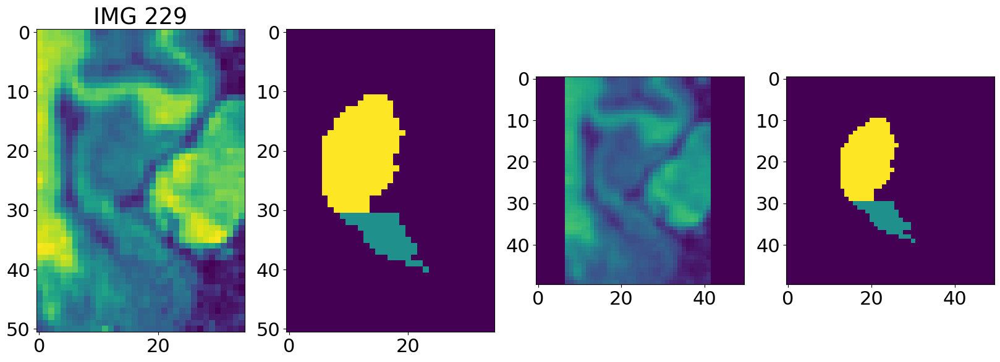

hippocampus_352
Padding value: 0.0
Normalizing intensities via 99 percentile
230 (50, 50, 35)


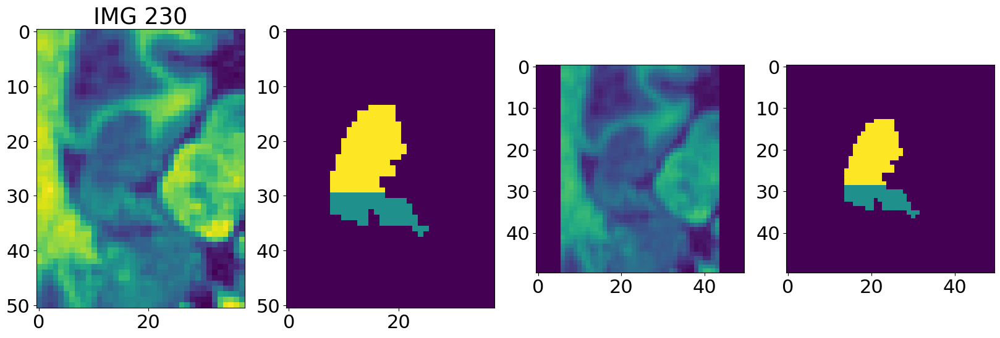

hippocampus_353
Padding value: 0.0
Normalizing intensities via 99 percentile
231 (50, 50, 31)


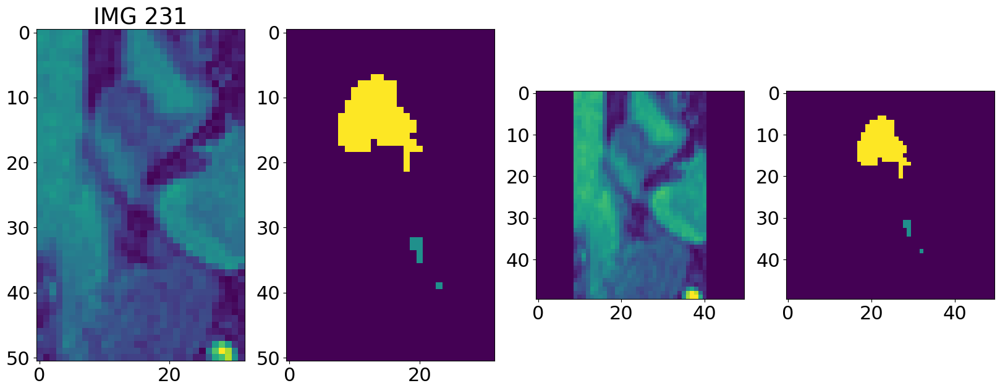

hippocampus_354
Padding value: 0.0
Normalizing intensities via 99 percentile
232 (50, 50, 32)


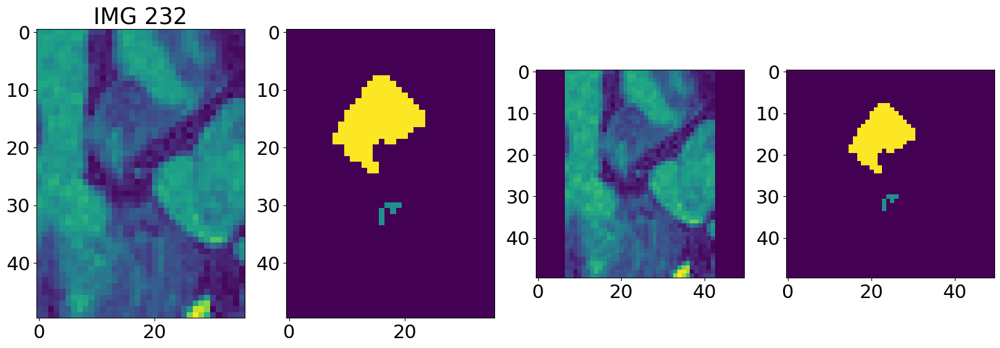

hippocampus_355
Padding value: 0.0
Normalizing intensities via 99 percentile
233 (50, 50, 38)


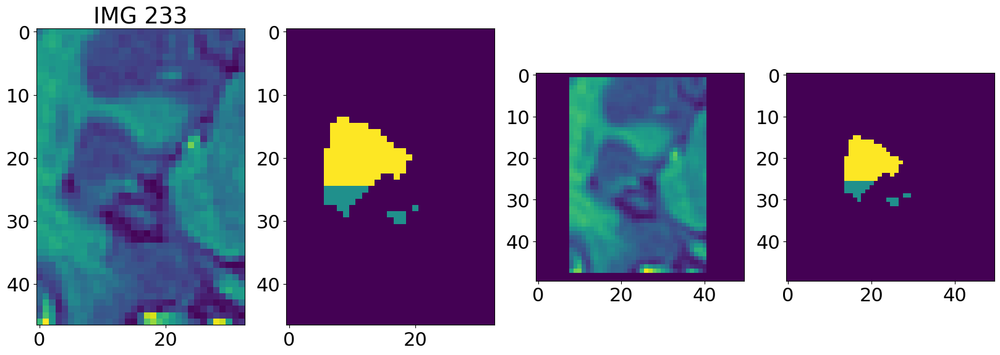

hippocampus_356
Padding value: 0.0
Normalizing intensities via 99 percentile
234 (50, 50, 37)


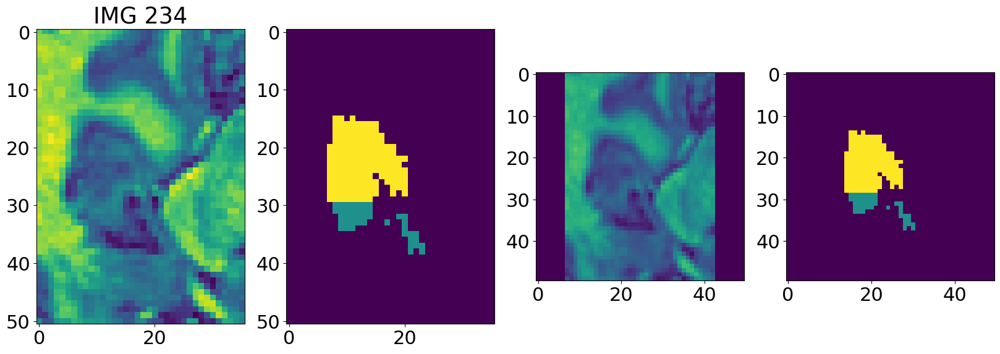

hippocampus_358
Padding value: 0.0
Normalizing intensities via 99 percentile
235 (50, 50, 34)


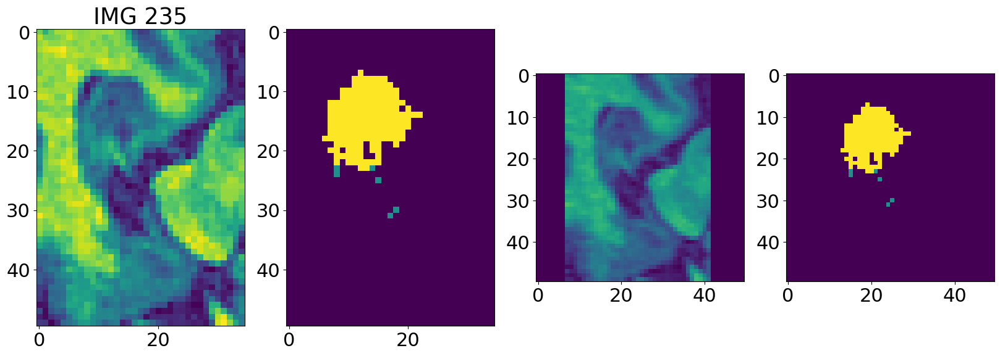

hippocampus_359
Padding value: 0.0
Normalizing intensities via 99 percentile
236 (50, 50, 35)


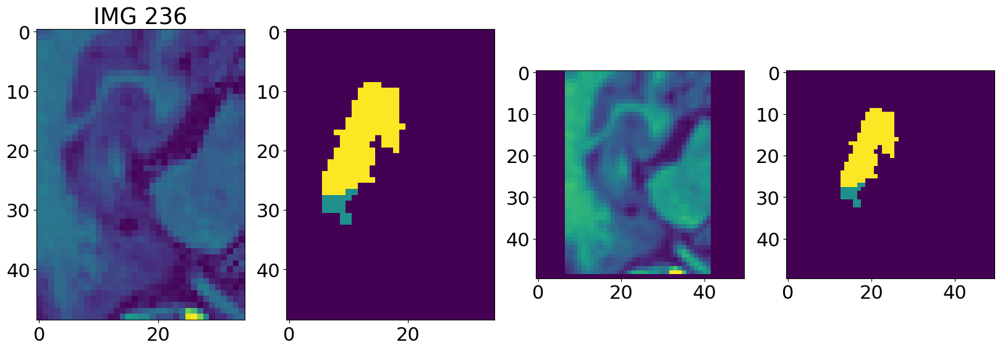

hippocampus_360
Padding value: 0.0
Normalizing intensities via 99 percentile
237 (50, 50, 37)


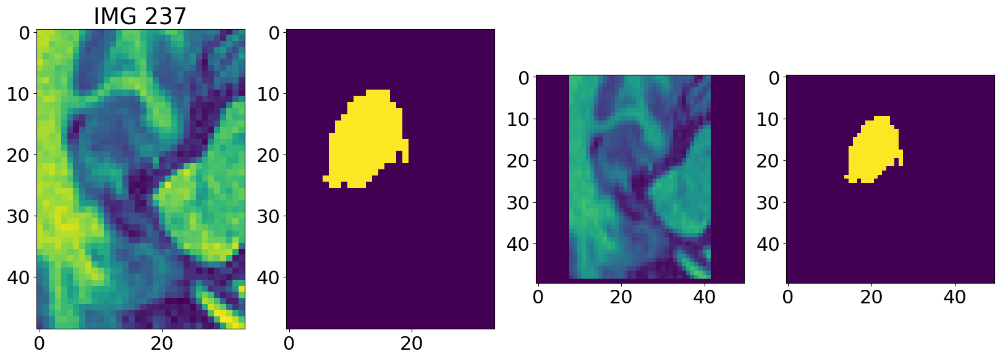

hippocampus_361
Padding value: 0.0
Normalizing intensities via 99 percentile
238 (50, 50, 33)


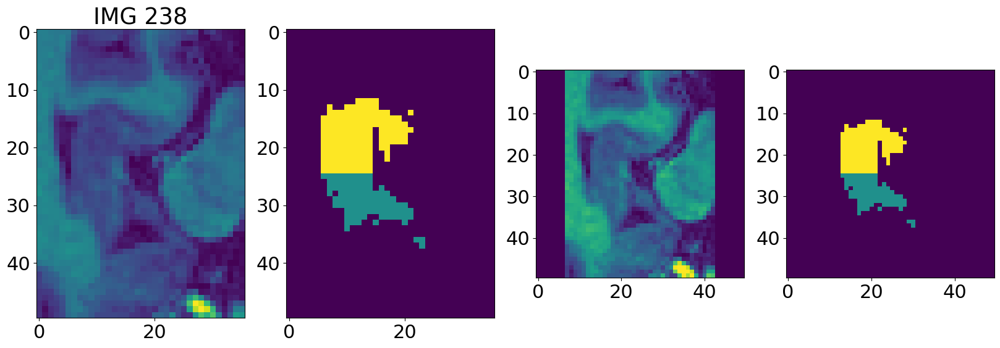

hippocampus_363
Padding value: 0.0
Normalizing intensities via 99 percentile
239 (50, 50, 35)


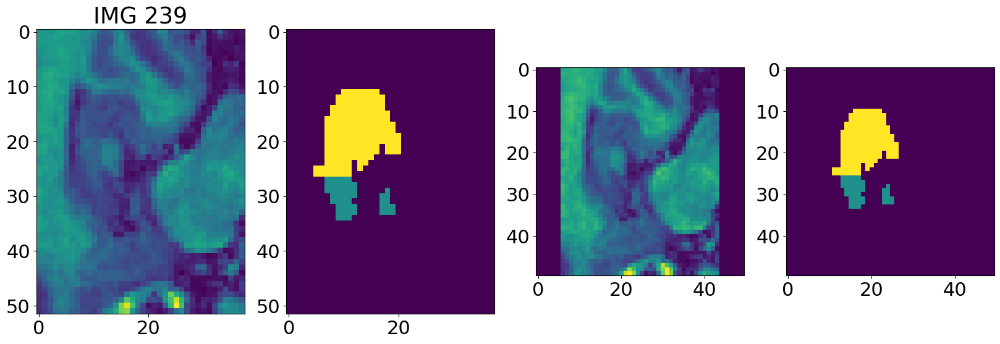

hippocampus_366
Padding value: 0.0
Normalizing intensities via 99 percentile
240 (50, 50, 34)


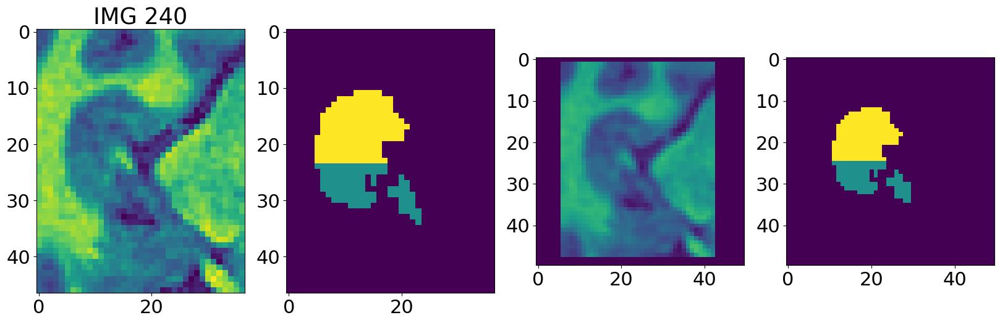

hippocampus_370
Padding value: 0.0
Normalizing intensities via 99 percentile
243 (50, 50, 36)


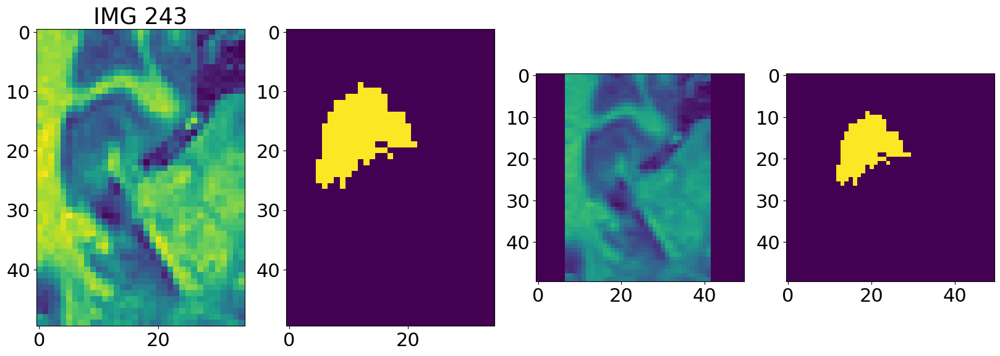

hippocampus_372
Padding value: 0.0
Normalizing intensities via 99 percentile
244 (50, 50, 34)


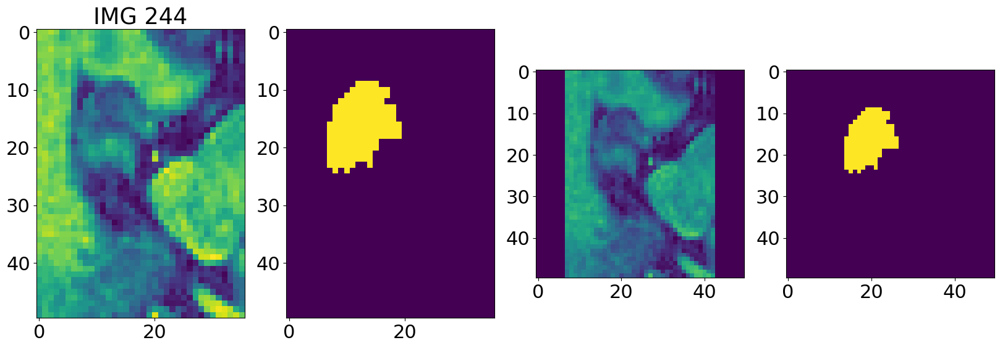

hippocampus_374
Padding value: 0.0
Normalizing intensities via 99 percentile
246 (50, 50, 39)


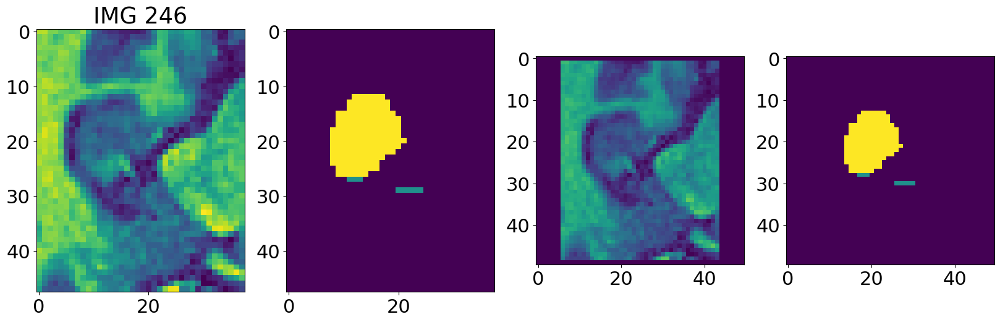

hippocampus_375
Padding value: 0.0
Normalizing intensities via 99 percentile
247 (50, 50, 34)


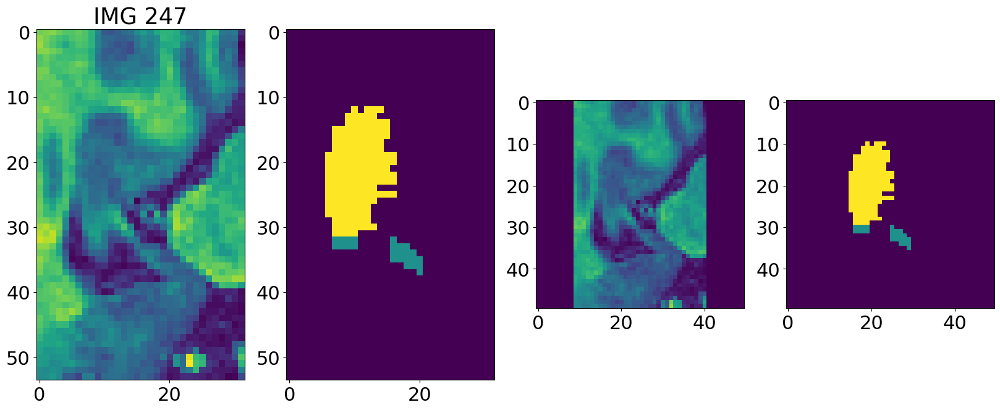

hippocampus_378
Padding value: 0.0
Normalizing intensities via 99 percentile
249 (50, 50, 34)


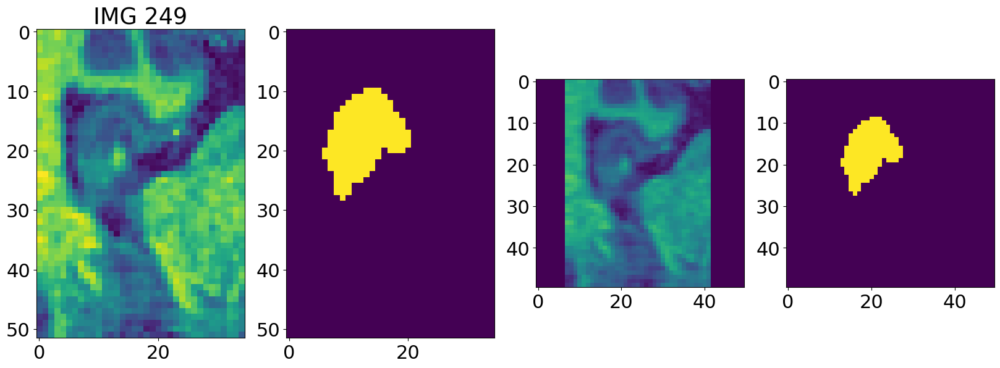

hippocampus_380
Padding value: 0.0
Normalizing intensities via 99 percentile
250 (50, 50, 42)


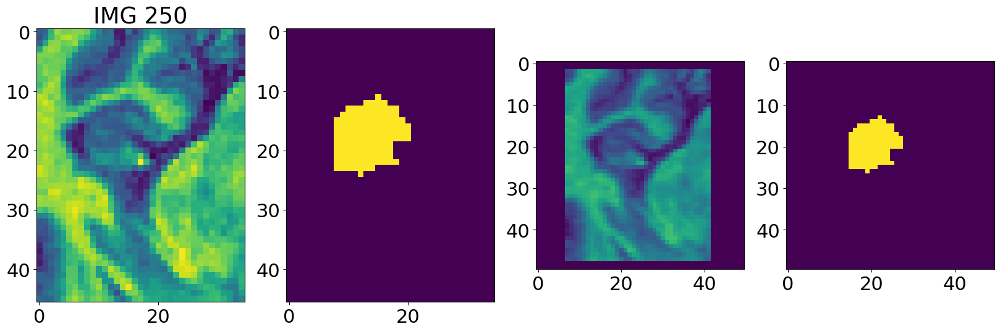

hippocampus_381
Padding value: 0.0
Normalizing intensities via 99 percentile
251 (50, 50, 37)


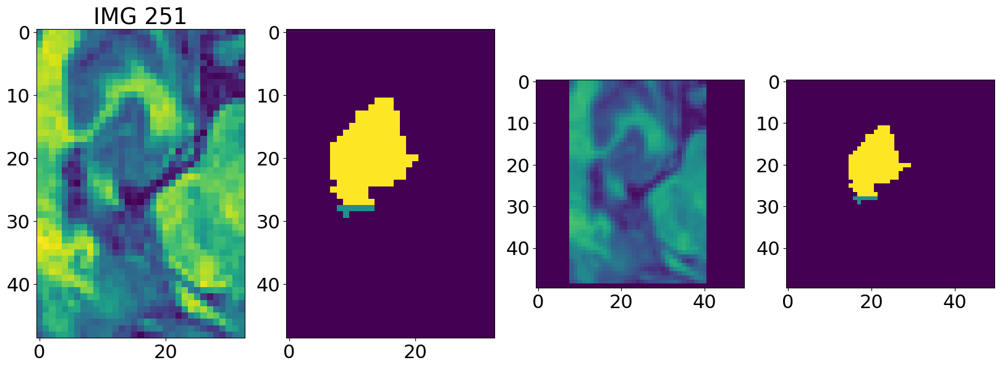

hippocampus_385
Padding value: 0.0
Normalizing intensities via 99 percentile
253 (50, 50, 40)


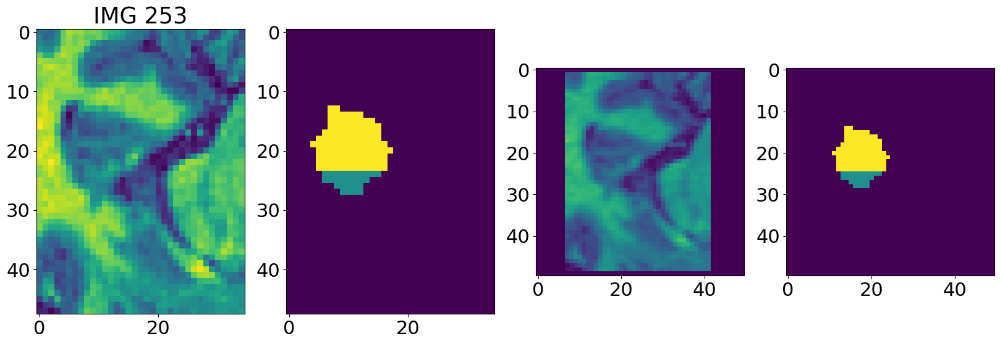

hippocampus_386
Padding value: 0.0
Normalizing intensities via 99 percentile
254 (50, 50, 40)


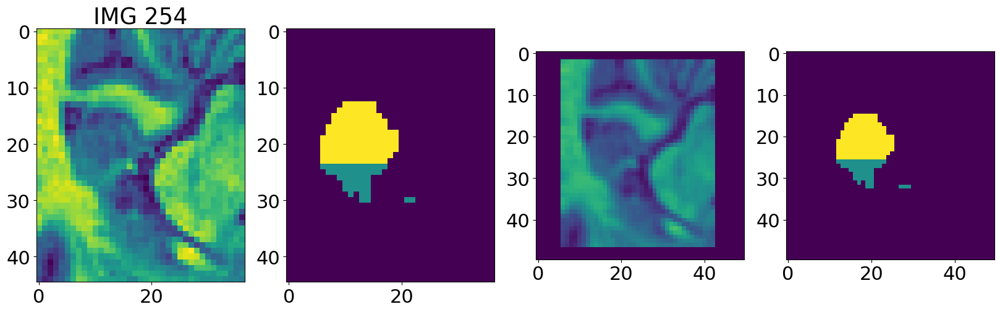

hippocampus_389
Padding value: 0.0
Normalizing intensities via 99 percentile
256 (50, 50, 32)


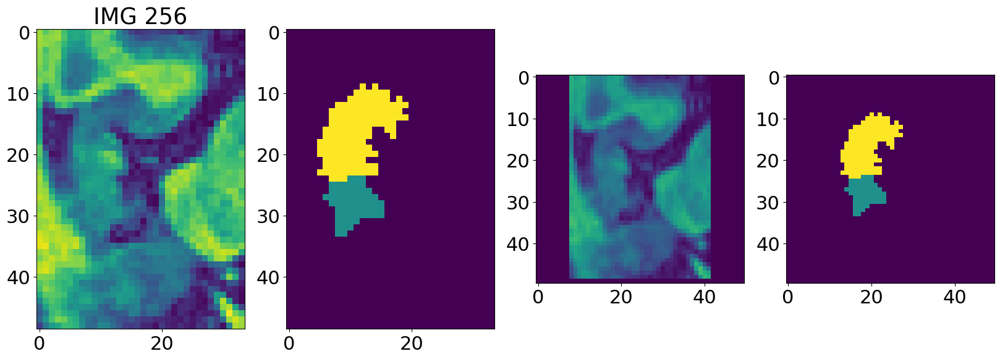

hippocampus_390
Padding value: 0.0
Normalizing intensities via 99 percentile
257 (50, 50, 33)


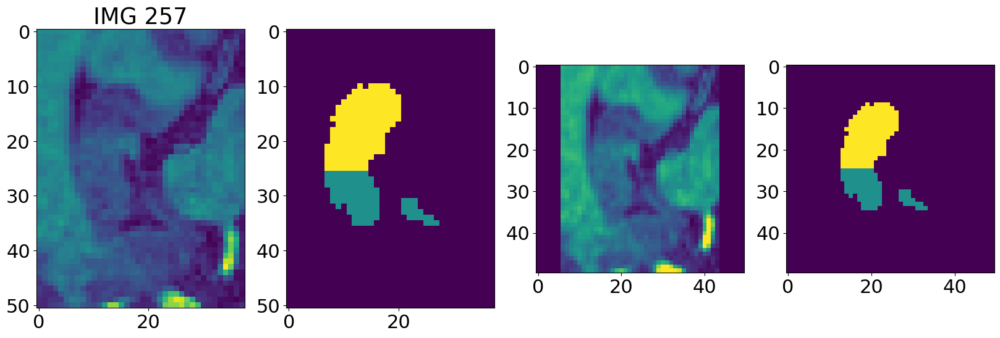

hippocampus_393
Padding value: 0.0
Normalizing intensities via 99 percentile
258 (50, 50, 31)


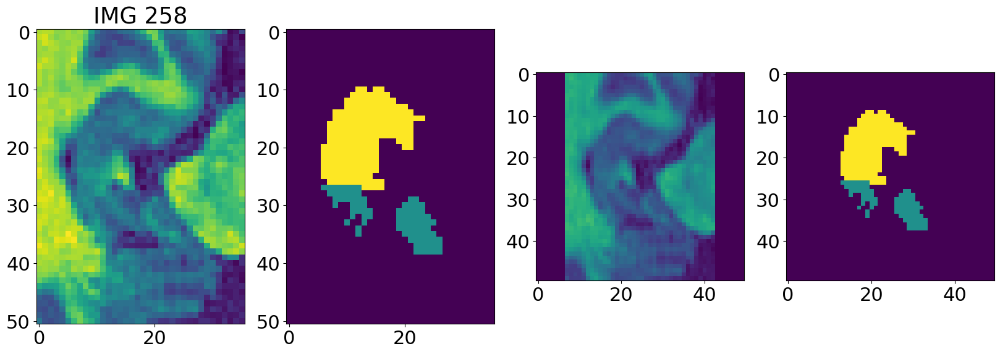

hippocampus_394
Padding value: 0.0
Normalizing intensities via 99 percentile
259 (50, 50, 32)


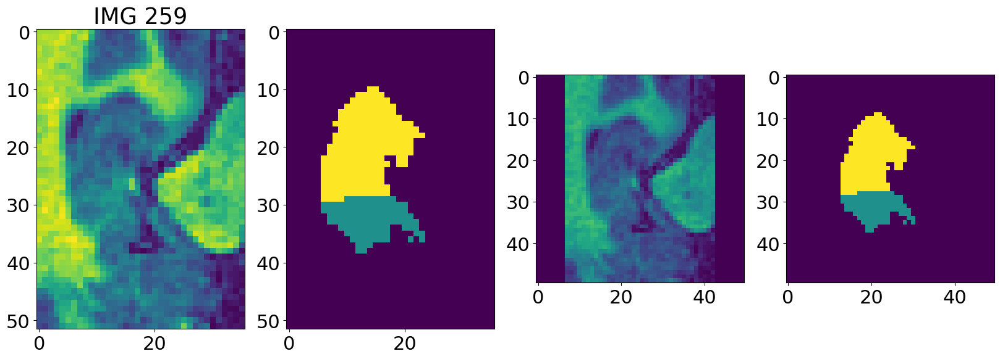

In [28]:
# Preprocesssing train data
d = DatasetPreprocessor(dataset_folder_path)
train_all_img_arr, train_all_seg_arr, \
    train_slice_info, train_scan_info, \
    train_preprocessing_info = d.preprocess_dataset(new_img_width=new_img_width, new_spacing=new_spacing, 
                                              padding_type=padding_type,
                                              vol_idx_list=train_indices, 
                                              clip_range=clip_range,
                                              normalize_min_max=normalize_min_max,
                                              normalize_percentile=normalize_percentile,
                                              center_crop_width=center_crop_width,
                                              nchannels_last=nchannels_last,
                                              plot=True
                                             )

In [29]:
train_all_img_arr.shape

(7513, 1, 50, 50)

In [30]:
# Saving preprocessed data
preprocessing_type = 'train'

# We create the folders to save the preprocessed data
temp_save_folder = os.path.join(data_folder, dataset_name, 'preprocessed', preprocessing_type)
save_folder = create_unexisting_folder(temp_save_folder)
print('Saving preprocessed data in {}'.format(save_folder))

# We save data (image) and label in two .hdf5 files
for idx in range(len(train_all_img_arr)):
    # We save the preprocessed files
    volume_save_path = os.path.join(save_folder, 'data')
    save_hdf5(train_all_img_arr[idx, :, :, :], idx, volume_save_path + '.hdf5')

    label_save_path = os.path.join(save_folder, 'label')
    save_hdf5(train_all_seg_arr[idx, :, :], idx, label_save_path + '.hdf5')
    
# We save the *_info dictionaries as json files
preprocessing_info_path = os.path.join(save_folder, 'preprocessing_info.json')
with open(preprocessing_info_path, "w") as file:
    json.dump(train_preprocessing_info , file) 
    
scan_info_path = os.path.join(save_folder, 'scan_info.json')
with open(scan_info_path, "w") as file:
    json.dump(train_scan_info , file) 
    
slice_info_path = os.path.join(save_folder, 'slice_info.json')
with open(slice_info_path, "w") as file:
    json.dump(train_slice_info , file) 

Saving preprocessed data in /home/ar32500@ens.ad.etsmtl.ca/moneta_data/users/melanie/data/Task04_Hippocampus/preprocessed/train


## Get validation set

In [30]:
size_val = 10

In [31]:
print(len(train_scan_info.keys()))
print(train_scan_info.keys())

210
dict_keys(['hippocampus_001', 'hippocampus_004', 'hippocampus_006', 'hippocampus_007', 'hippocampus_008', 'hippocampus_017', 'hippocampus_019', 'hippocampus_020', 'hippocampus_024', 'hippocampus_025', 'hippocampus_026', 'hippocampus_033', 'hippocampus_034', 'hippocampus_035', 'hippocampus_036', 'hippocampus_037', 'hippocampus_038', 'hippocampus_041', 'hippocampus_042', 'hippocampus_045', 'hippocampus_046', 'hippocampus_048', 'hippocampus_049', 'hippocampus_050', 'hippocampus_051', 'hippocampus_052', 'hippocampus_053', 'hippocampus_057', 'hippocampus_058', 'hippocampus_060', 'hippocampus_067', 'hippocampus_068', 'hippocampus_070', 'hippocampus_074', 'hippocampus_075', 'hippocampus_077', 'hippocampus_083', 'hippocampus_084', 'hippocampus_087', 'hippocampus_089', 'hippocampus_090', 'hippocampus_091', 'hippocampus_092', 'hippocampus_096', 'hippocampus_098', 'hippocampus_099', 'hippocampus_101', 'hippocampus_102', 'hippocampus_104', 'hippocampus_105', 'hippocampus_106', 'hippocampus_107

In [32]:
val_patients = np.random.choice(list(train_scan_info.keys()), size=size_val, replace=False)

In [35]:
#val_patients = ['hippocampus_067', 'hippocampus_329', 'hippocampus_166',
#'hippocampus_374', 'hippocampus_132', 'hippocampus_301',
#       'hippocampus_099', 'hippocampus_341', 'hippocampus_025',
#       'hippocampus_366', 'hippocampus_261', 'hippocampus_353',
#       'hippocampus_390', 'hippocampus_244', 'hippocampus_037',
#       'hippocampus_154', 'hippocampus_318', 'hippocampus_042',
#       'hippocampus_325', 'hippocampus_181']

In [33]:
val_patients 

array(['hippocampus_067', 'hippocampus_329', 'hippocampus_166',
       'hippocampus_374', 'hippocampus_132', 'hippocampus_301',
       'hippocampus_099', 'hippocampus_341', 'hippocampus_025',
       'hippocampus_366'], dtype='<U15')

In [34]:
val_indices = [i for i in range(len(train_all_img_arr)) if train_slice_info[i]['scan_name'] in val_patients]
len(val_indices)

350

In [35]:
print(val_indices)

[336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358, 359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 1089, 1090, 1091, 1092, 1093, 1094, 1095, 1096, 1097, 1098, 1099, 1100, 1101, 1102, 1103, 1104, 1105, 1106, 1107, 1108, 1109, 1110, 1111, 1112, 1113, 1114, 1115, 1116, 1117, 1118, 1119, 1120, 1121, 1122, 1123, 1124, 1125, 1126, 1127, 1128, 1129, 1653, 1654, 1655, 1656, 1657, 1658, 1659, 1660, 1661, 1662, 1663, 1664, 1665, 1666, 1667, 1668, 1669, 1670, 1671, 1672, 1673, 1674, 1675, 1676, 1677, 1678, 1679, 2198, 2199, 2200, 2201, 2202, 2203, 2204, 2205, 2206, 2207, 2208, 2209, 2210, 2211, 2212, 2213, 2214, 2215, 2216, 2217, 2218, 2219, 2220, 2221, 2222, 2223, 2224, 2225, 2226, 2227, 2228, 2229, 2230, 2231, 2232, 2233, 2234, 2235, 2236, 2237, 3108, 3109, 3110, 3111, 3112, 3113, 3114, 3115, 3116, 3117, 3118, 3119, 3120, 3121, 3122, 3123, 3124, 3125, 3126, 3127, 3128, 3129, 3130, 3131, 3132, 3133, 3134, 3135, 3136, 31

## Inital labeled set

In [36]:
num_init = 10

In [37]:
train_patients = [name for name in list(train_scan_info.keys()) if name not in val_patients]
train_patients

['hippocampus_001',
 'hippocampus_004',
 'hippocampus_006',
 'hippocampus_007',
 'hippocampus_008',
 'hippocampus_017',
 'hippocampus_019',
 'hippocampus_020',
 'hippocampus_024',
 'hippocampus_026',
 'hippocampus_033',
 'hippocampus_034',
 'hippocampus_035',
 'hippocampus_036',
 'hippocampus_037',
 'hippocampus_038',
 'hippocampus_041',
 'hippocampus_042',
 'hippocampus_045',
 'hippocampus_046',
 'hippocampus_048',
 'hippocampus_049',
 'hippocampus_050',
 'hippocampus_051',
 'hippocampus_052',
 'hippocampus_053',
 'hippocampus_057',
 'hippocampus_058',
 'hippocampus_060',
 'hippocampus_068',
 'hippocampus_070',
 'hippocampus_074',
 'hippocampus_075',
 'hippocampus_077',
 'hippocampus_083',
 'hippocampus_084',
 'hippocampus_087',
 'hippocampus_089',
 'hippocampus_090',
 'hippocampus_091',
 'hippocampus_092',
 'hippocampus_096',
 'hippocampus_098',
 'hippocampus_101',
 'hippocampus_102',
 'hippocampus_104',
 'hippocampus_105',
 'hippocampus_106',
 'hippocampus_107',
 'hippocampus_108',


In [38]:
training_indices = [i for i in range(len(train_all_img_arr)) if train_slice_info[i]['scan_name'] in train_patients]
print(len(training_indices))

7163


In [39]:
init_set = np.random.choice(training_indices, size=num_init, replace=False)

In [40]:
#init_set = [660, 2939, 101, 4941, 2121, 5675, 4300, 6319, 1886, 3007]

In [41]:
init_set

array([ 660, 2939,  101, 4941, 2121, 5675, 4300, 6319, 1886, 3007])

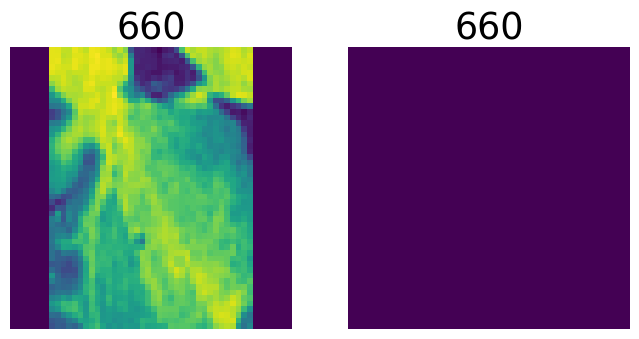

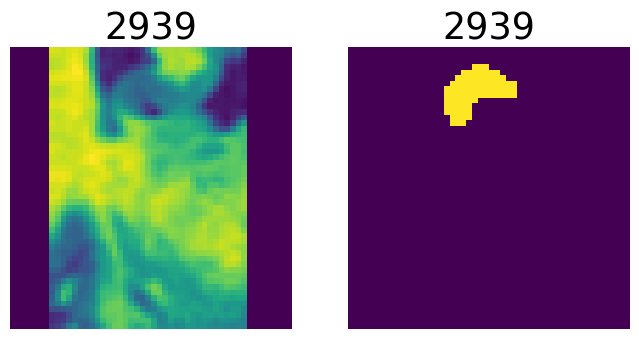

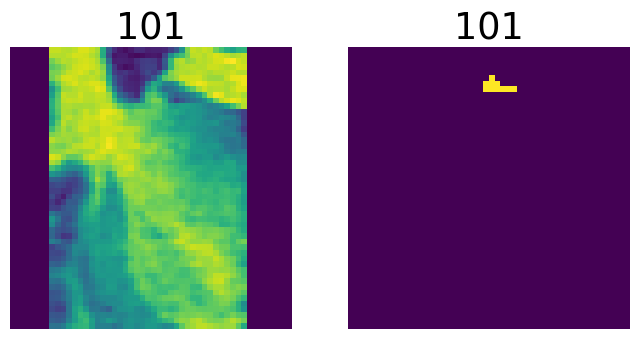

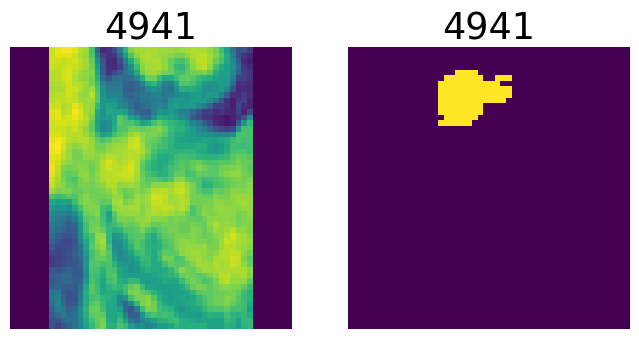

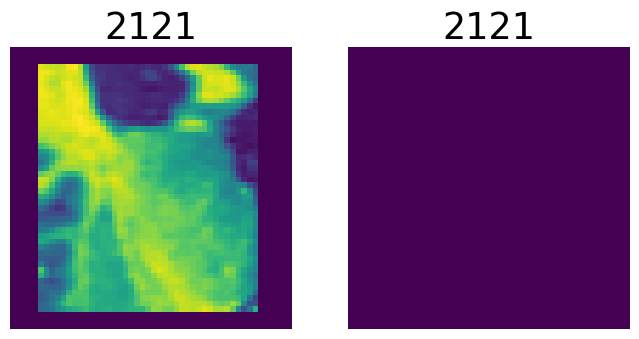

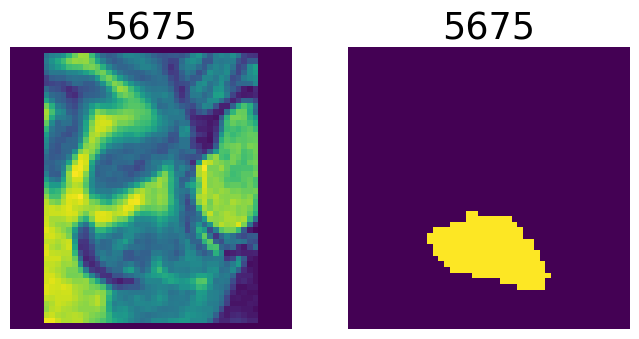

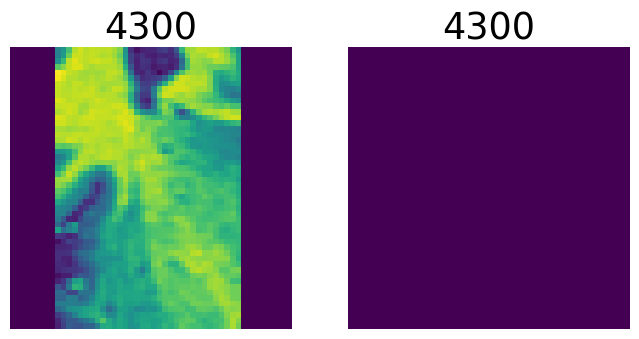

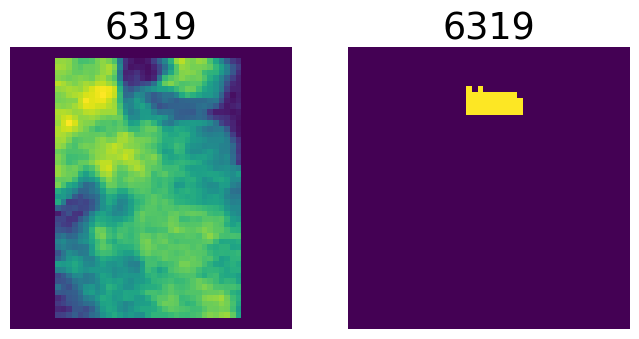

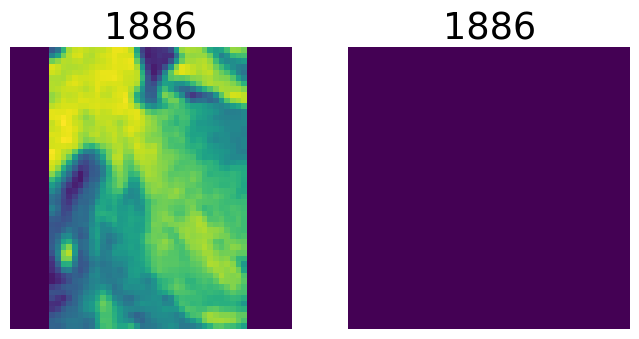

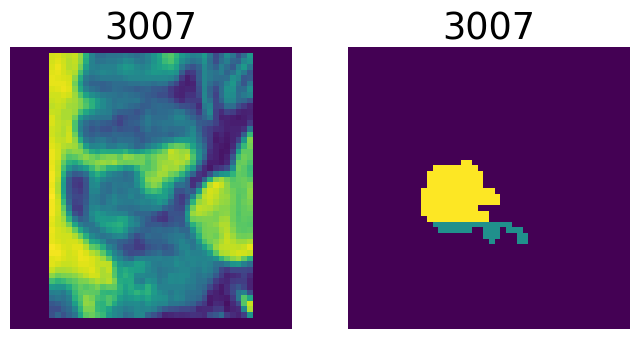

In [42]:
for i in init_set:
    fig = plt.figure(figsize=(8, 4))
    ax = fig.add_subplot(121)
    ax.imshow(train_all_img_arr[i, 0, :, :])
    plt.axis('off')
    ax.set_title(i)
    
    ax = fig.add_subplot(122)
    ax.imshow(train_all_seg_arr[i, :, :])
    plt.axis('off')
    
    ax.set_title(i)